In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import glob
import os
import peakutils
import logging
import datetime
import warnings
from lmfit.models import PseudoVoigtModel, GaussianModel
from jupyterthemes import jtplot

In [3]:
from matplotlib.colors import Normalize


In [4]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *
from xps.xps_fits import *

jtplot.style('grade3', context='talk', grid=False, ticks=True, fscale=1.5)
logging.getLogger().setLevel(logging.CRITICAL)
warnings.filterwarnings("ignore")

plt.rcParams['errorbar.capsize'] = 8
plt.rcParams['font.size'] = 18
plt.rc('font', size= 18)
plt.rc('legend', fontsize= 15)
plt.rc('xtick', labelsize= 18)
plt.rc('ytick', labelsize= 18)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)
plt.rcParams["xtick.major.size"] = 8
plt.rcParams["ytick.major.size"] = 8
plt.rcParams["xtick.minor.size"] = 4
plt.rcParams["ytick.minor.size"] = 4

plt.rcParams['axes.edgecolor'] = '0.'
plt.rcParams['axes.labelcolor'] = '0.'
plt.rcParams['xtick.color'] = '0.'
plt.rcParams['ytick.color'] = '0.'
plt.rcParams['text.color'] = '0.'
plt.rcParams['axes.linewidth'] = 1.6
plt.rcParams['lines.linewidth'] = 4

asf = dict({'C_1s' : 0.296, 'O_1s' : 0.711, 'N_1s' : 0.477, 'Ba_3d' : 7.49, 'Ba_3d_5/2' : 7.49, 'Ba_3d_3/2' : 5.20,
            'Br_3p' : 1.054, 'Cu_2p' : 5.321, 'Ba_4d': 2.35, 'Na_1s' : 1.685, 'Cl_2s' : 0.37,
           'In3d' : 4.359, 'Sn3d' : 4.725, 'Cl_2p' : 0.891, 'Si2p': 0.339})

In [5]:
asf2 = {'Ba_3d_5/2' : 25.8, 'Ba_3d_3/2': 17.9, 'Ba_4d': 5.86, 'Cl_2p': 2.28, 'Cl_2s': 1.69}

asf3 = {'Ba_3d_5/2' : 64.3, 'Ba_3d_3/2': 49.9, 'Ba_4d': 5.86, 'Cl_2p': 2.28, 'Cl_2s': 1.50}

In [6]:
plt.rcParams['axes.grid'] = False
plt.rcParams['axes.grid.which'] = 'major'
plt.rcParams['axes.grid.which'] = 'minor'
plt.rcParams['axes.grid.axis'] = 'x'
plt.rcParams['axes.grid.axis'] = 'y'

In [148]:
def plot_fit_result(xp: XPS_experiment, region: str, fitRes: ModelResult = None,
                    lb : str = None, ax = None, col:str = None, offset: float = 0.3,
                    plot_comps: bool = True, plot_bg:bool = False, flag_fill: bool = False):
    if ax == None : ax = plt.gca()
    if col == None: col = xp.color
    if lb == None: lb = xp.name
    if fitRes == None: fitRes = xp.fit[region]

    x = xp.dfx[region].dropna().energy
    ybg = np.zeros_like(x)
    if plot_bg == True:
        try:
            ybg = xp.dfx[region+'_bg'].dropna().counts
            ax.plot(x, ybg , ls='dotted', color=col, lw=2)
        except KeyError as e:
            print('Background not found for ', e)
            
    offset *= np.average(xp.dfx[region].dropna().counts.values)
    
    p1 = ax.scatter(x, xp.dfx[region].dropna().counts + ybg + offset,
                    color=col, label=lb, zorder = 1)

    ax.plot(x, fitRes.best_fit + ybg + offset, '-', color=col)#, label='best fit, $\chi^2_N$ = %i' %fitRes.redchi)
#     ax.legend(loc='upper left')

    if plot_comps:
        comps = fitRes.eval_components(x=x)
        for compo in comps:
            posx = fitRes.best_values[compo+'center']
            colc = ax.plot(x, comps[compo] + ybg + offset, ls='dotted', lw=2, color=col, label='__nolabel__')[0].get_color()

            ax.vlines(x=posx, ymin=ybg.min() + offset, ymax=(comps[compo] + ybg + offset).max(), lw=2, linestyle='-', colors=col)
            ax.text(x=posx, y=(comps[compo] + offset + ybg).max()*0.99, s='%.1f' %posx)
            if flag_fill:
                ax.fill_between(x, y1 = ybg, y2 = comps[compo] + ybg, alpha=0.3, color=col)
    ax.invert_xaxis()
    return ax, offset

## Figure 5: fluorescence spectra

In [7]:
pathflu = '/Users/pabloherrero/sabat/spectroscopy/FBI/emission/emission_FBI_Ba_Na.png'
dflu = pd.read_csv(pathflu, sep=',', skiprows=1)
dflu.columns = ['fbi', 'fbina', 'fbiba']

dflu['fbina'] /= dflu['fbina'].max()
dflu['fbina'] += 0.1

dflu['fbiba'] /= dflu['fbiba'].max()
dflu['fbiba'] += 0.2

dflu['fbi'] /= dflu['fbi'].max()
dflu.columns = ['FBI', 'FBI-NaClO$_4$', 'FBI-BaClO$_4$']

485.07
481.94
453.03


Text(0.5, 0, 'Wavelength [nm]')

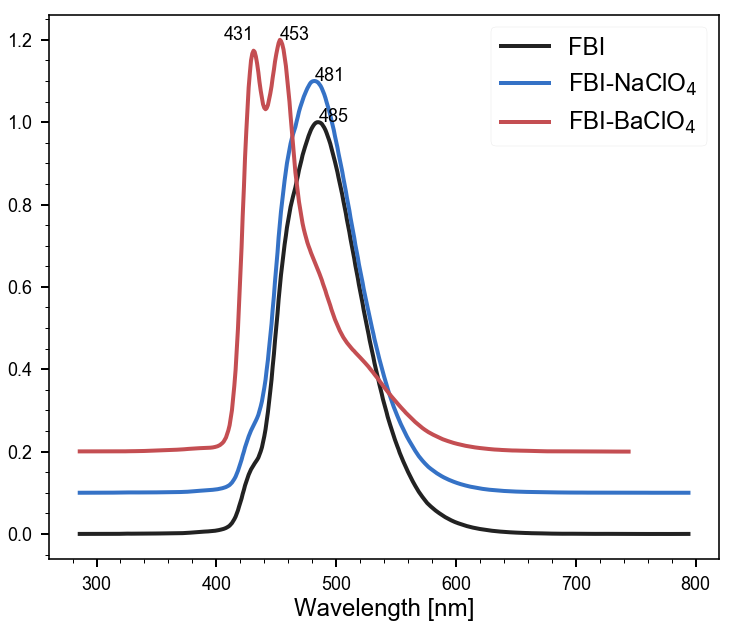

In [8]:
plt.figure(figsize=(12, 10))
dflu['FBI'].plot(color='k')
dflu['FBI-NaClO$_4$'].plot(color='b')
dflu['FBI-BaClO$_4$'].plot(color='r')

for co in dflu.columns:
    mx = dflu.index[np.argmax(dflu[co])]
    print(mx)
    plt.text(s='%i'%mx, x=mx, y=np.max(dflu[co]))
plt.text(s=431, x=431, y=np.max(dflu[co]), ha='right')
    
plt.legend(fontsize=24)
plt.xlabel('Wavelength [nm]', fontsize=24)

In [9]:
np.argmax(dflu['FBI-BaClO$_4$'].values)
np.argmax(dflu['FBI-BaClO$_4$'][:450])
dflu.index[145]

431.04

# Figure 2 comparison BaCl2/NaCl

## Raw data plot

In [189]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/**/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
file_clean = files[-1]
files[1:] = files[:-1]
files[0] = file_clean
print(files)

raw2 = [xps_data_import(f) for f in files]
cols = ['r', 'g', 'b', 'y']
for xp, c in zip(raw2, cols):
    xp.color = c
trim_spectra(raw2[2], raw2[0], 'N_1s', inplace=True);


['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_clean2.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min_BaCl2_30s.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min_BaCl2_60s.xy']


In [192]:
for xp in raw2[:3]:
    trim_spectra(xp, raw2[3], 'O_1s', inplace=True)

for xp in raw2:
    crop_spectrum(xp, 'O_1s', edw=529, inplace=True)

In [193]:
r = 'O_1s'
norm2 = [normalise_dfx(xp,r) for xp in raw2]

# for xp in norm2:
#     trim_spectra(xp, norm2[3],r, inplace=True);#, eup=537.8, edw=529.5);

In [11]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
files[0], files[1] = files[1], files[0]
print(files)

raw1 = [xps_data_import(f) for f in files]

raw1[1].color = 'darkgreen'
raw1[2].color = 'y'

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210507_Au111_clean.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210507_Au111_FBI_subl_30min.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210508_Au111_FBI_subl_30min_NaCl_2min.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_07_Au111/20210508_Au111_FBI_subl_30min_NaCl_2min_150ºC.xy']


In [12]:
# norm1 = [normalise_dfx(xp, r) for xp in [raw2[0]]+raw1[1:]]
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']
norm1 = [normalise_dfx(xp) for xp in raw1]

r = 'O_1s'
for xp in norm1:
    trim_spectra(xp, norm1[3],r, inplace=True);#, eup=537.8, edw=529.5);

In [13]:
trim_spectra(raw1[2], raw2[3], 'O_1s', inplace=True);
trim_spectra(raw1[1], raw2[3], 'O_1s', inplace=True);

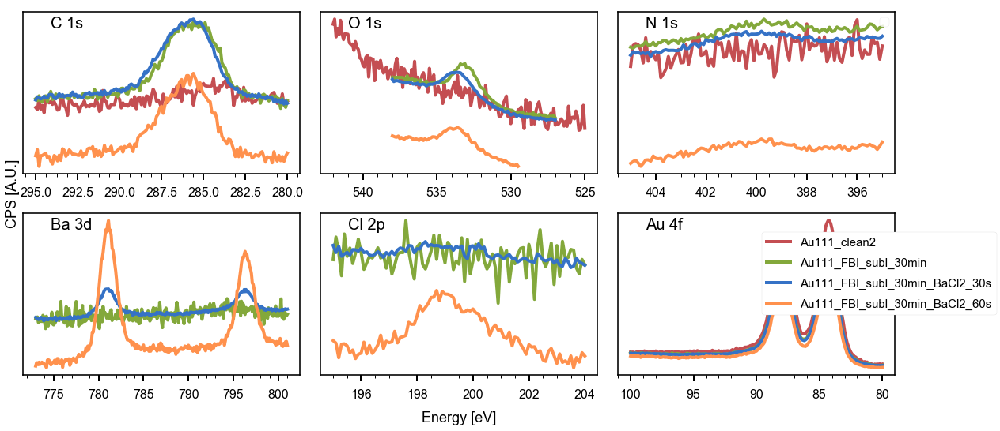

In [176]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

plot_xp_regions(raw2, regs, ncols=3);
# plt.gcf().savefig('/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_26_Cu/Unscaled_exps.png', dpi=200)

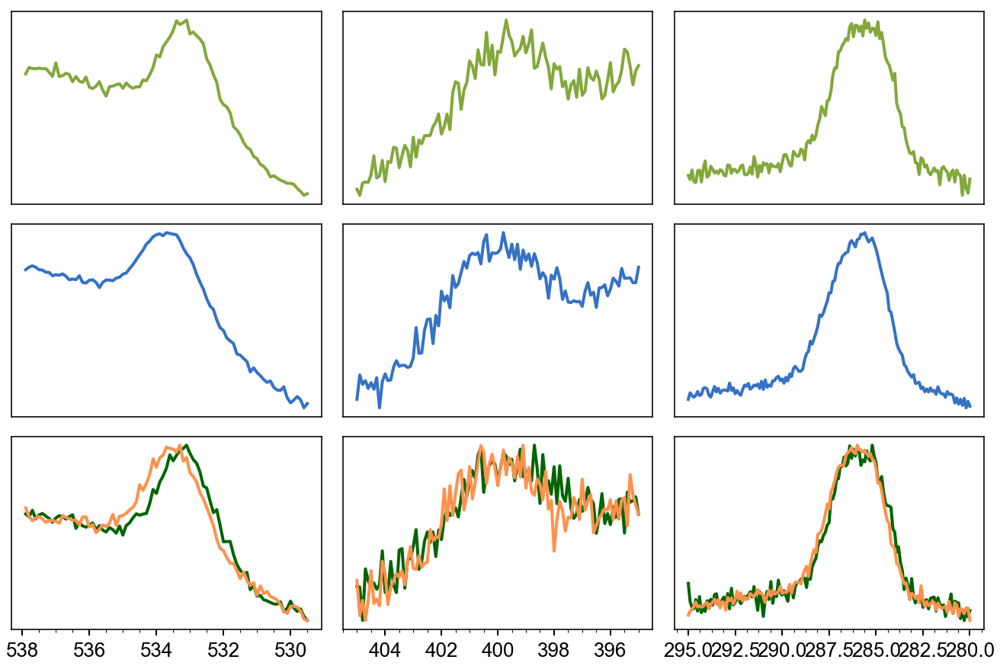

In [174]:
regs = ['O_1s', 'N_1s', 'C_1s']
sel = [raw2[1], raw2[2], normalise_dfx(raw1[1]), normalise_dfx(raw1[2])]
off = [800, 800, 400]
plt.rc('xtick', labelsize= 26)

fig, ax = plt.subplots(3,3, figsize=(18, 12))
for j, r in enumerate(regs):
    for i, xp in enumerate(sel[:3]):
        plot_region(xp, r, ax=ax[i,j])
        ax[i,j].set(yticks=[], ylabel=None, xlabel=None)
        ax[i,j].invert_xaxis()
        if i < 2: ax[i,j].set(xticks=[])
    plot_region(sel[3], r, ax=ax[i,j], offset=0)#off[j])
ax[i,j].set(yticks=[], ylabel=None, xlabel=None)

ax[i,j].get_legend().remove()
# ax[i,j].invert_xaxis()
plt.tight_layout(w_pad=0.6, h_pad=0.5, pad=0.1)
plt.rc('xtick', labelsize= 16)


# Figure 2 b) progressive barium addition

## Raw data plot 

In [16]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
# files[2], files[3] = files[3], files[2]
print(files)

raw3 = [xps_data_import(f) for f in files]
cols = ['k','g', 'b', 'y', 'm', 'c', 'r', 'k']
for xp, c in zip(raw3, cols):
    xp.color = c

['/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210520_Au111_clean.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210521_Au111_FBI_subl_45min.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210521_Au111_FBI_subl_45min_BaCl2_10s.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210522_Au111_FBI_subl_45min_BaCl2_20s.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210523_Au111_FBI_subl_45min_BaCl2_30s.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210523_Au111_FBI_subl_45min_BaCl2_40s.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210524_Au111_FBI_subl_45min_BaCl2_60s.xy', '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210524_Au111_FBI_subl_45min_BaCl2_80s.xy']


In [17]:
region = 'O_1s'
crop_spectrum(raw2[1], region, eup=536, edw=529, inplace=True)
crop_spectrum(raw2[2], region, eup=536, edw=529, inplace=True);

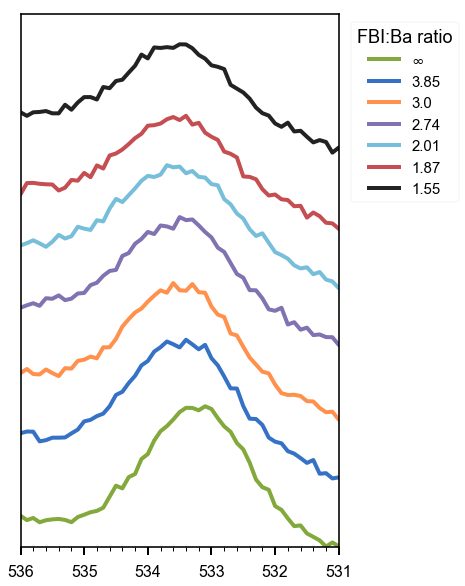

In [80]:
fbibaratio = ['$\infty$', 3.85, 3.0, 2.74, 2.01, 1.87, 1.55]
fig, ax = plt.subplots(1, sharex=False, figsize=(5, 8))
plt.xlabel("Energy [eV]")
plt.ylabel("Counts [A.U.]")
r = 'O_1s'

seps =  532
enmx, comx = [], []
handles = []
for i, xp in enumerate(raw3[1:]):
    
    if i == 0:
        off = -200
    else: off = 200*i
    li = plot_region(xp, r, offset=off)
    handles.append(li)
    ax = plt.gca()
    argmx = np.argmax(xp.dfx[r].counts)

    enmx.append(xp.dfx[r].energy.loc[argmx])
    comx.append(xp.dfx[r].counts.loc[argmx])# + off)
ax.plot(enmx, comx, '--k', lw=2.5)
ax.set(xlim=(536, 531), ylim=(4.3e3, 5.6e3), xlabel='', ylabel='', yticks=[])
# ax.invert_xaxis()

plt.tight_layout(w_pad=0.5, h_pad=0.5, pad=0.1)     #  First manage the space and THEN add the legend
labels = [str(cov) for cov in fbibaratio]#[::-1]
ax.legend(handles, labels, ncol=1, title='FBI:Ba ratio', loc='upper right', bbox_to_anchor=(1.4, 1.))           

# fig.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v3/fbi_coverage_all_norm.png', dpi=200, bbox_inches = 'tight')

In [44]:
enmx, comx

([533.1, 546.8, 546.7, 533.5, 546.5, 547.0, 546.8],
 [4842.925, 5967.0909, 5909.0521, 4504.9615, 5800.6125, 5723.1866, 5668.2943])

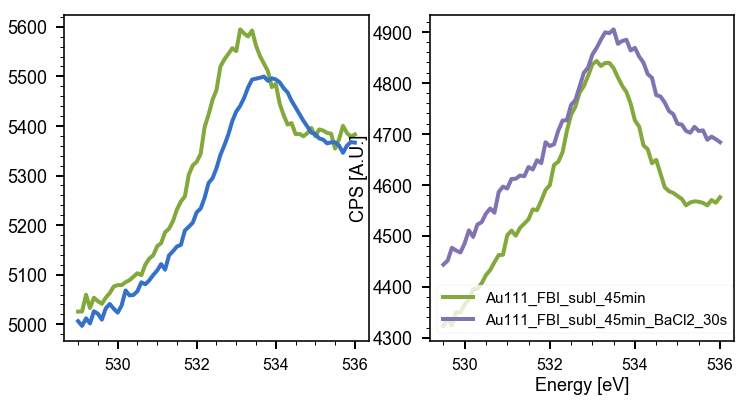

In [54]:
region = 'O_1s'
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
plot_region(raw2[1], region=region, ax=ax[0])
plot_region(raw2[2], region=region, ax=ax[0])
plot_region(raw3[1], region=region, ax=ax[1])
plot_region(raw3[4], region=region, ax=ax[1], offset=400)

In [116]:
raw2[1].color = 'g'

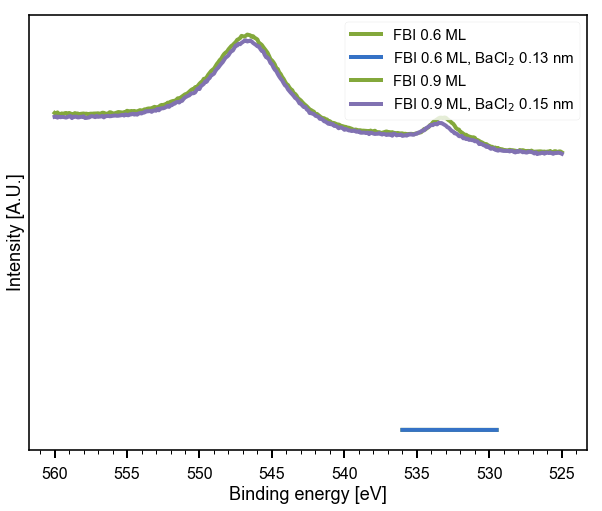

In [82]:
plt.figure(figsize=(10, 8))
region = 'O_1s'

plot_region(raw2[1], region=region, lb='FBI 0.6 ML')
plot_region(raw2[2], region=region, lb='FBI 0.6 ML, BaCl$_2$ 0.13 nm')
plot_region(raw3[1], region=region, offset=400, lb='FBI 0.9 ML')
plot_region(raw3[4], region=region, offset=400+250, lb='FBI 0.9 ML, BaCl$_2$ 0.15 nm')

ax = plt.gca()
ax.legend(loc='upper right')
# ax.get_legend().set(')
ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
ax.invert_xaxis()
# plt.gcf().savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig2_xps_chelation/fig2_xps_chelation.c).png')

# Figure 5, Chelation in Cu and qITO

## Shift in Cu sample 13 (BaCl2)

In [26]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21*/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_1min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_2min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_200grad.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_250grad.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_300grad.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_clean.xy']

In [27]:
cuba = [xps_data_import(f) for f in files]
cuba[0].color = 'g'
cuba[3].color = 'b'
cuba = [normalise_dfx(xp) for xp in [cuba[0], cuba[3]]]

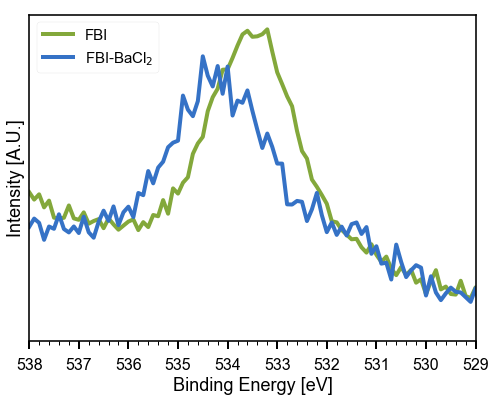

In [28]:
region = 'O_1s'
fig = plt.figure(figsize=(8, 6))
plot_region(cuba[0], region, offset=0.1)
plot_region(cuba[1], region)
ax = plt.gca()
ax.set(xlabel = 'Binding Energy [eV]',xlim=(538, 529), ylabel='Intensity [A.U.]', yticks=[])
# ax.invert_xaxis()
ax.legend(handles=ax.get_lines(), labels=['FBI', 'FBI-BaCl$_2$'], loc='upper left')

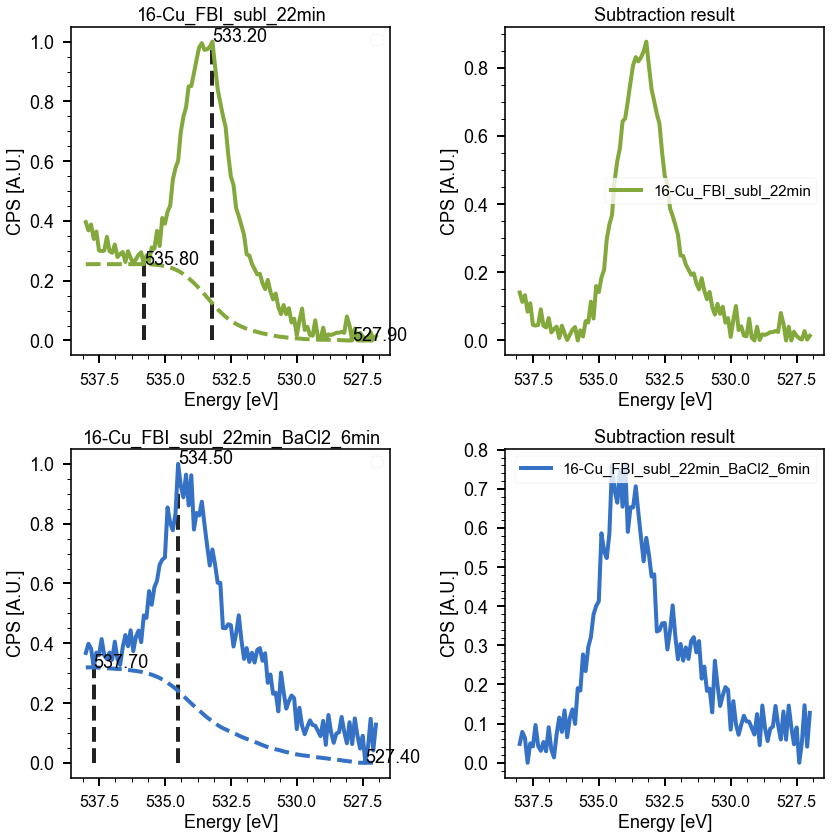

In [29]:
cuba = region_bg_subtract(cuba, region=region, flag_plot=True)

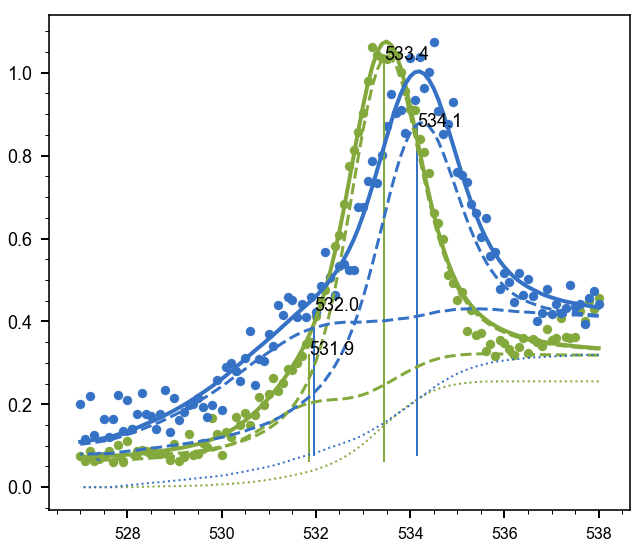

In [30]:
for xp in cuba:
    Fn = XPFit(xp, 'O_1s')
    Fn.double_voigt(533.5)
    Fn.plot(plot_bg=True)

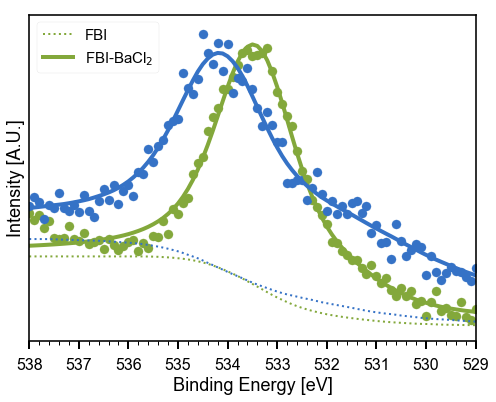

In [31]:
fig = plt.figure(figsize=(8, 6))
plot_fit_result(cuba[0], region, plot_bg=True, plot_comps=False, offset=0.1)
plot_fit_result(cuba[1], region, plot_bg=True, plot_comps=False)
ax = plt.gca()
ax.set(xlabel = 'Binding Energy [eV]',xlim=(538, 529), ylabel='Intensity [A.U.]', yticks=[])
# ax.invert_xaxis()
ax.legend(handles=ax.get_lines(), labels=['FBI', 'FBI-BaCl$_2$'], loc='upper left')

## Shift in sample 9 (NaCl) for inset

In [51]:
path = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_05_04*/*.xy'

files = glob.glob(path, recursive=True)
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_05_04_Cu/20210504_18-Cu_FBI_subl_20min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_05_04_Cu/20210504_18-Cu_clean.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_05_04_Cu/20210505_18-Cu_FBI_subl_20min_NaCl_2min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_05_04_Cu/20210506_18-Cu_FBI_subl_20min_NaCl_2min_200ºC.xy']

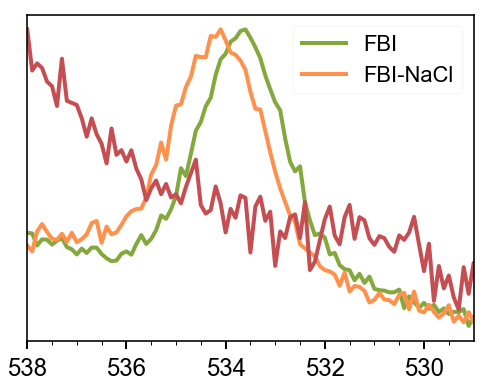

In [90]:
nacl = [xps_data_import(f) for f in files]
nacl[0].color = 'g'
nacl[2].color = 'y'
nacl = [normalise_dfx(xp) for xp in [nacl[0], nacl[2], nacl[3]] ]
region = 'O_1s'
fig = plt.figure(figsize=(8, 6))
plot_region(nacl[0], region)
plot_region(nacl[1], region)
plot_region(nacl[2], region)

ax = plt.gca()
ax.set(xlabel = None, ylabel=None, xlim=(538, 529), yticks=[])
# ax.invert_xaxis()
ax.legend(handles=ax.get_lines(), labels=['FBI', 'FBI-NaCl'], loc='upper right', fontsize=22)

Max iterations exceeded, subtract linear baseline


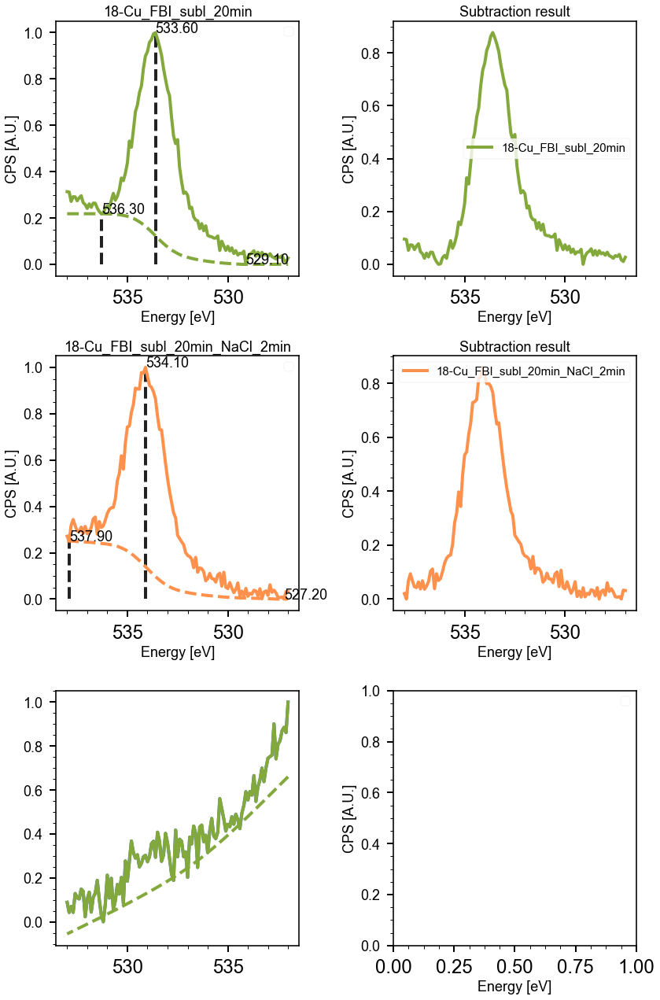

In [89]:
nacl = region_bg_subtract(nacl, region=region, flag_plot=True)

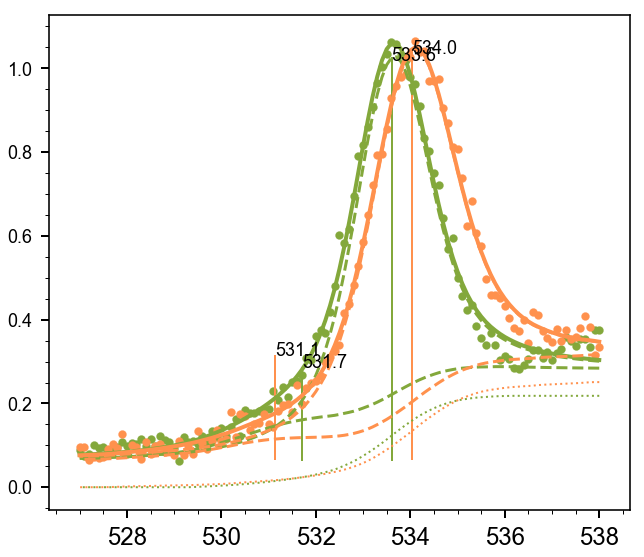

In [71]:
for xp in nacl:
    Fn = XPFit(xp, 'O_1s')
    Fn.double_voigt(533.5)
    Fn.plot(plot_bg=True)

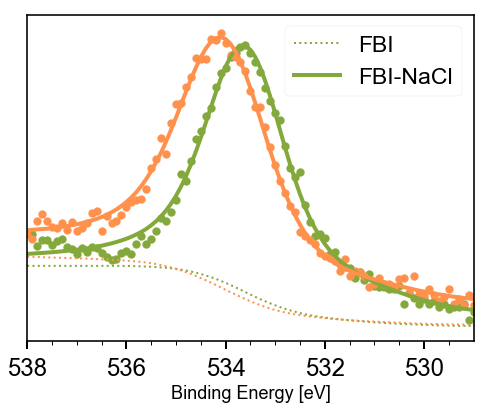

In [55]:
fig = plt.figure(figsize=(8, 6))
region = 'O_1s'
plot_fit_result(nacl[0], region, plot_bg=True, plot_comps=False, offset=0.1)
plot_fit_result(nacl[1], region, plot_bg=True, plot_comps=False)
ax = plt.gca()
ax.set(xlabel = 'Binding Energy [eV]',xlim=(538, 529), yticks=[])
# ax.invert_xaxis()
ax.legend(handles=ax.get_lines(), labels=['FBI', 'FBI-NaCl'], loc='upper right', fontsize=23)
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig5_cu_ito/fig4_cu_ito.b).png',
#             dpi=600)

[[],
 (0.0, 1.4),
 Text(0, 0.5, 'Intensity (A.U.)'),
 (1076.5, 1065),
 Text(0.5, 1.0, 'Na 1s')]

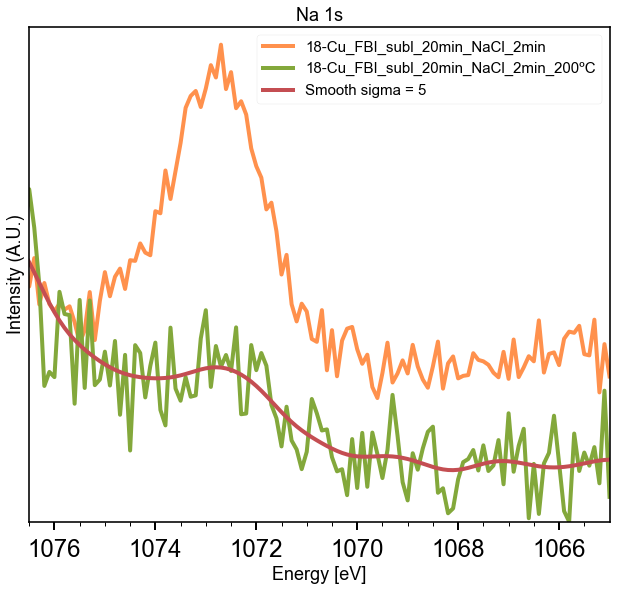

In [98]:
sig = 5
plot_region(nacl[1], 'Na_1s', offset=0.35)
plot_region(nacl[2], 'Na_1s', offset=0.)
plot_region(gaussian_smooth(nacl[2], 'Na_1s', sigma=sig), 'Na_1s',
            offset=0., lb='Smooth sigma = '+str(sig))

ax = plt.gca()
ax.set(xlim = (1076.5, 1065), ylim = (0., 1.4), title = 'Na 1s',
       ylabel = 'Intensity (A.U.)', yticks=[])

## Figure 5 b) qITO

In [36]:
def subtract_fit_component(xp: XPS_experiment, region:str, prefix: str, fitRes = None,
                           flag_plot:bool = True, store:bool = True, inplace:bool = False):
    """Subtract a fit component from the data, prefix specifies which component
        Returns XPS_experiment: a single dfx region with the subtraction result"""
    x = xp.dfx[region].dropna().energy.values
    y = xp.dfx[region].dropna().counts.values
    if fitRes == None:  fitRes = xp.fit[region]
        
    comps = fitRes.eval_components(x=x)
    yv1 = comps[prefix]
    yb1 = y - yv1
    if flag_plot:
        fig, ax = plt.subplots(1, 2, sharex=True, figsize=(12, 6))
        plot_fit_result(xp, region, ax=ax[0], fitRes=fitRes)
        ax[0].set(title=xp.name+ ' original fit')
        lim = ax[0].get_ylim()
        ax[1].plot(x, yb1, color=xp.color)
        ax[1].set(title='v1 subtraction', yticks=[], ylim=lim)
    
    xpNew = deepcopy(xp)
    xpNew.dfx[region, 'energy'] = pd.Series(x)
    xpNew.dfx[region, 'counts']  = pd.Series(yb1)

    if store:    
        xpNew.dfx[region+'_'+prefix+'bg', 'energy'] = pd.Series(x)
        xpNew.dfx[region+'_'+prefix+'bg', 'counts']  = pd.Series(yv1)
    
    if inplace:
        insert_dfx_region(xp, xpNew, region=region, inplace=True)
        insert_dfx_region(xp, xpNew, region=region+'_'+prefix+'bg', inplace=True)
        
    else:
        return xpNew

In [37]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/**/*.uxy'
files = glob.glob(path, recursive=True)
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/2021_04_15_qITO/proc/20210415_1-qITO_FBI_subl_60min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/2021_04_15_qITO/proc/20210415_1-qITO_as_received.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/2021_04_15_qITO/proc/20210415_1-qITO_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/2021_04_28_qITO/proc/20210428_3-qITO_FBI_subl_40min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/2021_04_28_qITO/proc/20210428_3-qITO_FBI_subl_40min_BaCl2_5min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/2021_04_28_qITO/proc/20210428_3-qITO_clean.uxy']

In [38]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/qITO_subl/**/*.uxy'
files = glob.glob(path, recursive=True)
files.sort()
files.pop(1)
files

qito = [read_processed_xp(f) for f in files]

In [39]:
fig = plt.figure(figsize=(8, 6))
plot_region(ito[0], region)
plot_region(ito[1], region)
ax = plt.gca()
ax.set(xlabel = 'Binding Energy [eV]',xlim=(538, 529), ylabel='Intensity [A.U.]', yticks=[])
# ax.invert_xaxis()
ax.legend(handles=ax.get_lines()[1::2], labels=['FBI', 'FBI-BaCl$_2$'], loc='upper left')

NameError: name 'ito' is not defined

<Figure size 576x432 with 0 Axes>

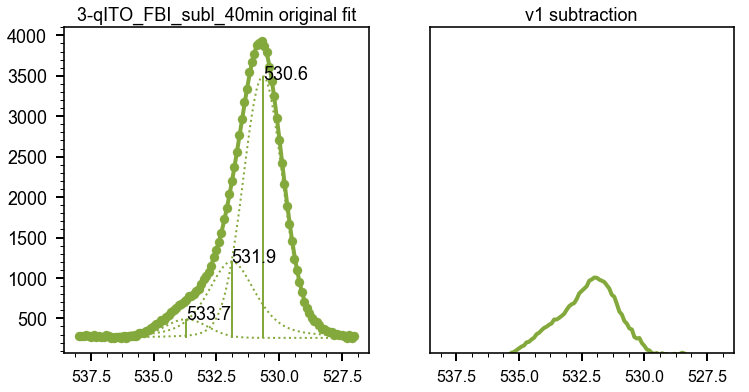

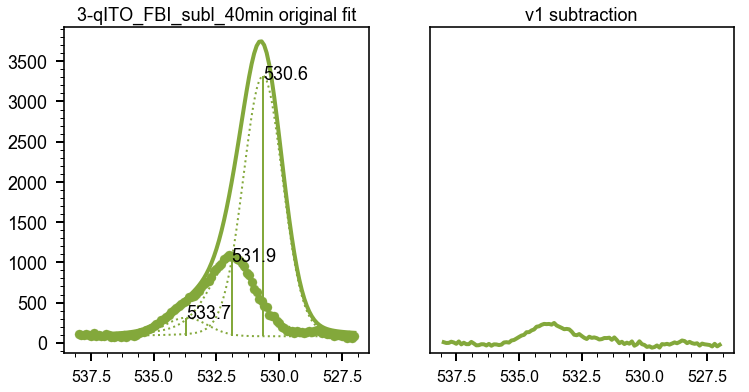

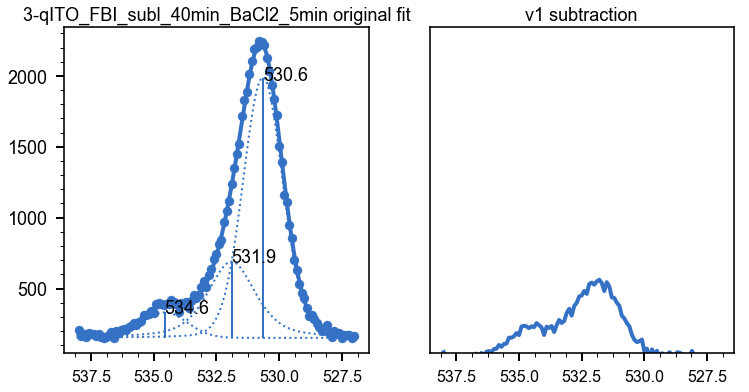

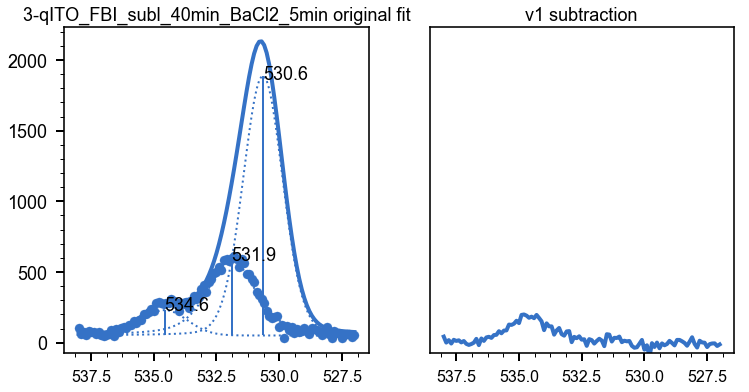

In [30]:
ito = []
region = 'O1s'
buf = subtract_fit_component(qito[2], region, prefix='v1_')
ito.append(subtract_fit_component(buf, region, prefix='v2_'))

buf = subtract_fit_component(qito[3], region, prefix='v1_')
ito.append(subtract_fit_component(buf, region, prefix='v2_'))

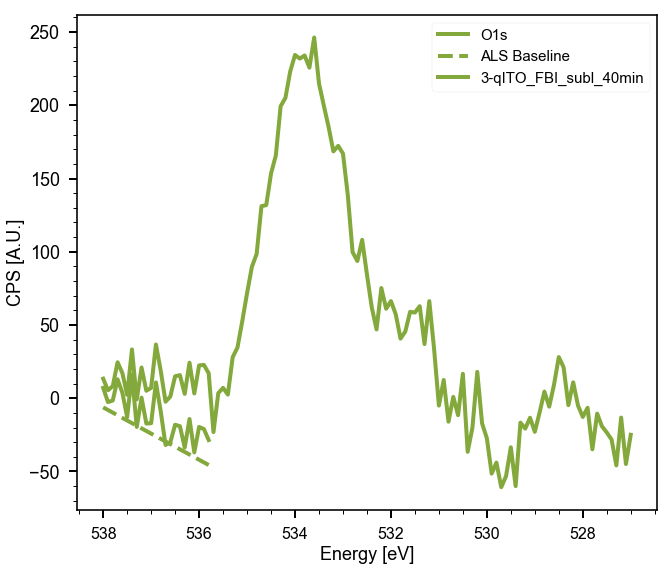

In [25]:
fix_tail_bg(ito[0], 'O1s', edw=535.8, store=False, inplace=True);

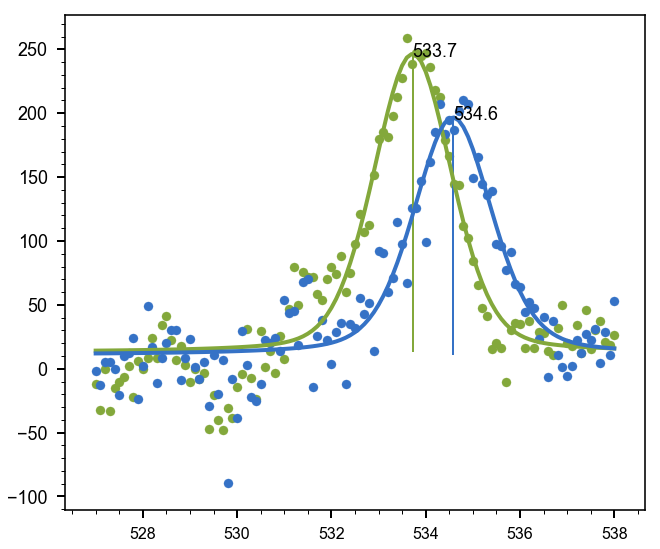

In [26]:
for xp in ito:
    Fn = XPFit(xp, 'O1s')
    Fn.voigt()
    Fn.plot()

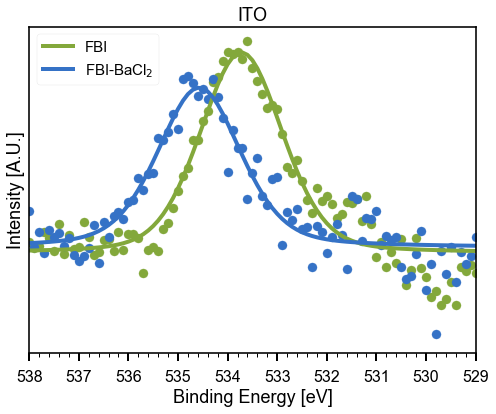

In [27]:
fig = plt.figure(figsize=(8, 6))
plot_fit_result(ito[0], region, plot_comps=False, offset=0.1)
plot_fit_result(ito[1], region, plot_comps=False)
ax = plt.gca()
ax.set(title='ITO', xlabel = 'Binding Energy [eV]',xlim=(538, 529), ylabel='Intensity [A.U.]', yticks=[])
# ax.invert_xaxis()
ax.legend(handles=ax.get_lines(), labels=['FBI', 'FBI-BaCl$_2$'], loc='upper left')

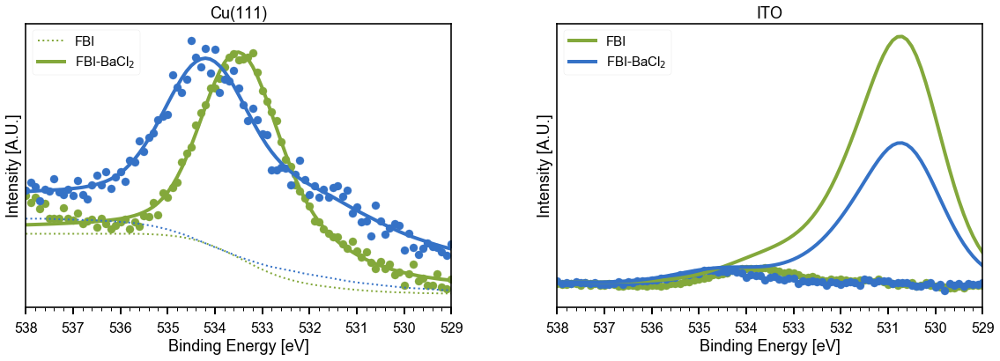

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
region = 'O_1s'           
plot_fit_result(cuba[0], region, plot_bg=True, plot_comps=False, offset=0.1, ax=ax[0])
plot_fit_result(cuba[1], region, plot_bg=True, plot_comps=False, ax=ax[0])
ax[0].set(title='Cu(111)', xlabel = 'Binding Energy [eV]',xlim=(538, 529), ylabel='Intensity [A.U.]', yticks=[])
# ax.invert_xaxis()
ax[0].legend(handles=ax[0].get_lines(), labels=['FBI', 'FBI-BaCl$_2$'], loc='upper left')
region = 'O1s'           
plot_fit_result(ito[0], region, plot_comps=False, ax=ax[1], offset=0.1)
plot_fit_result(ito[1], region, plot_comps=False, ax=ax[1])
ax[1].set(title='ITO', xlabel = 'Binding Energy [eV]',xlim=(538, 529), ylabel='Intensity [A.U.]', yticks=[])
# ax.invert_xaxis()
ax[1].legend(handles=ax[1].get_lines(), labels=['FBI', 'FBI-BaCl$_2$'], loc='upper left')
plt.tight_layout(w_pad=5, h_pad=0.5, pad=1)
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig5_cu_ito/fig4_cu_ito.a).png',
#             dpi=600)

## Unsubstracted qITO peaks

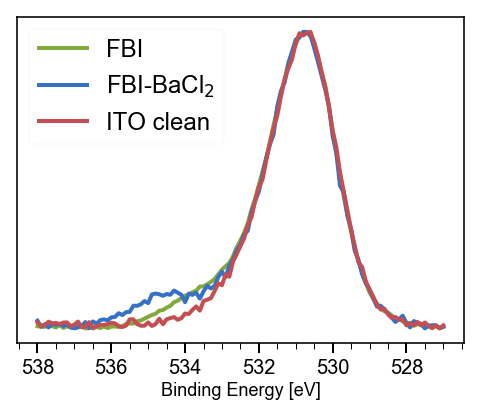

In [191]:
fig = plt.figure(figsize=(8, 6))
for xp in qito[2:]:
    plot_region(normalise_dfx(xp), 'O1s')
ax = plt.gca()
ax.set(xlabel = 'Binding Energy [eV]', ylabel=None, yticks=[])
ax.legend(handles=ax.get_lines(), labels=['FBI', 'FBI-BaCl$_2$', 'ITO clean'], loc='upper left', fontsize=24)
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig5_cu_ito/fig4_cu_ito.c).png',
            dpi=600)

# Fit O 1s with Au 4p

In [83]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_*/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()

samp3 = [read_processed_xp(f) for f in files]
cols = ['k','g', 'b', 'y', 'm', 'c', 'r', 'lime']
for xp, c in zip(samp3, cols):
    xp.color = c

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210520_Au111_clean.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210521_Au111_FBI_subl_45min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210521_Au111_FBI_subl_45min_BaCl2_10s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210522_Au111_FBI_subl_45min_BaCl2_20s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210523_Au111_FBI_subl_45min_BaCl2_30s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/proc/20210523_Au

## Subtract fit components

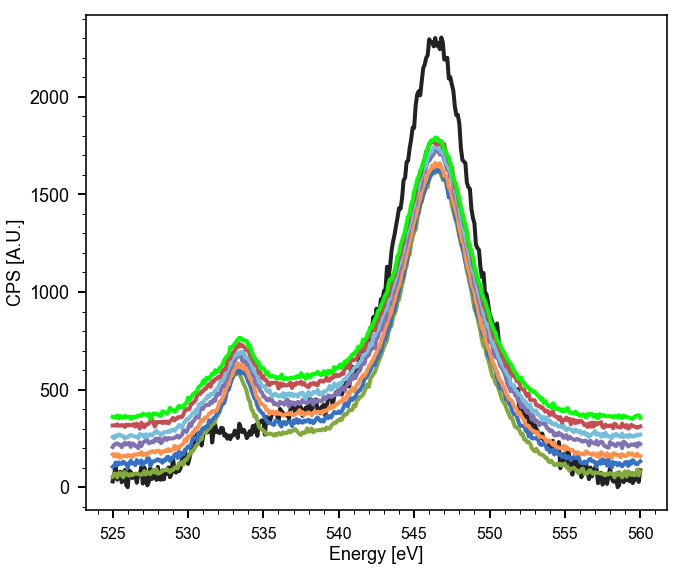

In [58]:
r = 'O_1s'
for i,xp in enumerate(samp3):
    plot_region(xp, r, offset=50*i)
    plt.gca().get_legend().remove()

Best chi2 value for 4 components


[42329.72136549863, 25803.0224499544, 29516.25793352984, 19767.539328214265]

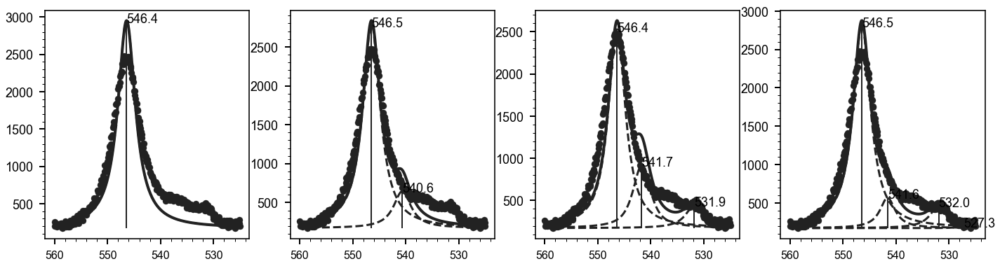

In [59]:
fit_n_voigt(samp3[0], r, max_comps = 4, )

Best chi2 value for 3 components


[26452.922182387952, 22969.634975771052, 7118.991089046457, 11376.066616438331]

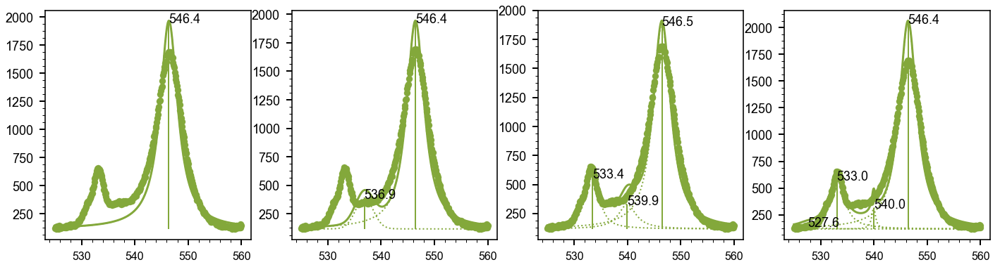

In [57]:
fit_n_voigt(samp3[1], r, max_comps = 4, )

In [52]:
def fit_n_voigt(xp: XPS_experiment, region: str, max_comps: int=3, flag_save: bool = False):
    """Fits up to max_comps voigt components and returns reduced chi2 for each fit
    Args:
        max_comps: int, maximum number of components to look for
        flag_save: bool, if True, stores each fit (as many as max_comps) in xp.fit[region_i_comps]
    """
    chis = []
    x = xp.dfx[region].dropna().energy.values
    y = xp.dfx[region].dropna().counts.values
    xs = [x]
    ys = [y]
    fig, ax = plt.subplots(1, max_comps, figsize=(6*max_comps, 6))

    for ncomps in range( max_comps):
        if ncomps > 0:
            sigmas = np.array([fitv.best_values['v'+str(i)+'_sigma'] for i in range(ncomps)])

            largest_comp = np.argmin(sigmas)
            xs, ys = split_component(xs, ys, largest_comp)

        mod, pars = set_mod_pars(ncomps+1, xs, ys)

        fitv = mod.fit(y, pars, x=x)
        plot_fit_result(xp, region, fitv, ax=ax[ncomps])
        ax[ncomps].invert_xaxis()
        chis.append(fitv.redchi)
        if flag_save: xp.fit[region+'_'+str(ncomps+1)+'comps'] = fitv
    print('Best chi2 value for %i components' %(np.argmin(chis)+1))
    return chis

Best chi2 value for 3 components


[25164.392527989967, 17764.614711024064, 6978.336359821204]

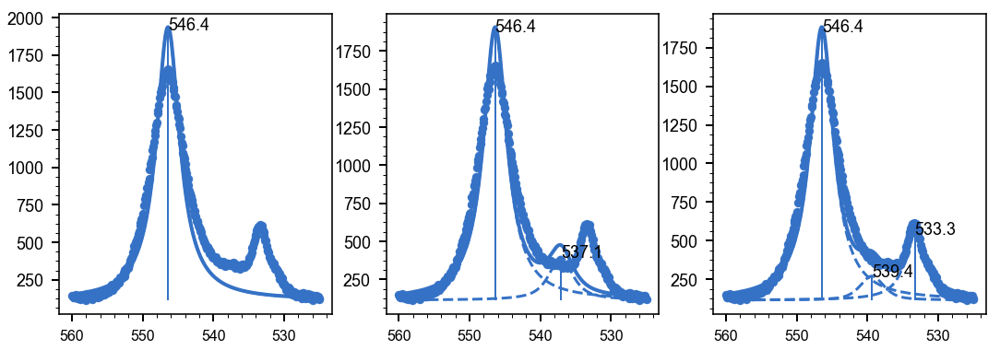

In [60]:
fit_n_voigt(samp3[2], r, max_comps = 3, flag_save=True)

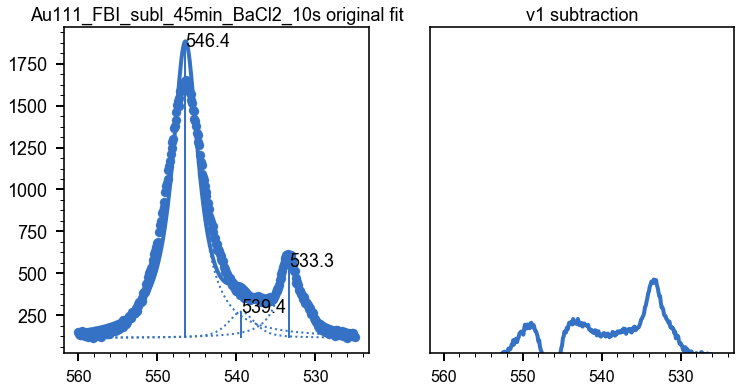

In [61]:
xpsub = subtract_fit_component(samp3[2], r, prefix='v0_', fitRes=samp3[2].fit['O_1s_3comps'], )

In [62]:
xpsubsub = subtract_fit_component(xpsub, 'O_1s-v0_', prefix='v2_', fitRes=samp3[2].fit['O_1s_3comps'], )

KeyError: 'O_1s-v0_'

Best chi2 value for 3 components


KeyError: 'O_1s-v0_'

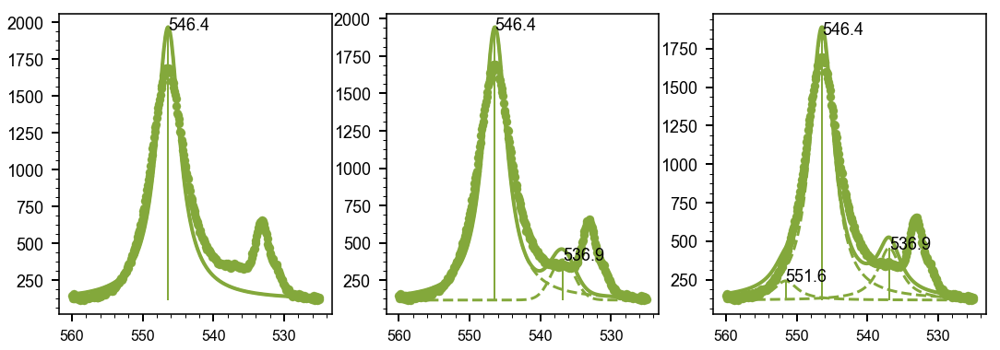

In [63]:
ausub_exps =  []
r = 'O_1s'
for xp in samp3[1:]:
    fit_n_voigt(xp, r, max_comps = 3, flag_save=True)
    xpsub = subtract_fit_component(xp, r, prefix='v0_', fitRes=xp.fit['O_1s_3comps'], flag_plot=False)
    xpsubsub = subtract_fit_component(xpsub, 'O_1s-v0_', prefix='v2_', fitRes=xp.fit['O_1s_3comps'], flag_plot=False)
    ausub_exps.append(xpsubsub)

In [64]:
cols = [ 'g', 'b', 'y', 'm', 'c', 'r', 'k']
for xp, c in zip(ausub_exps, cols):
    xp.color = c

AttributeError: 'NoneType' object has no attribute 'remove'

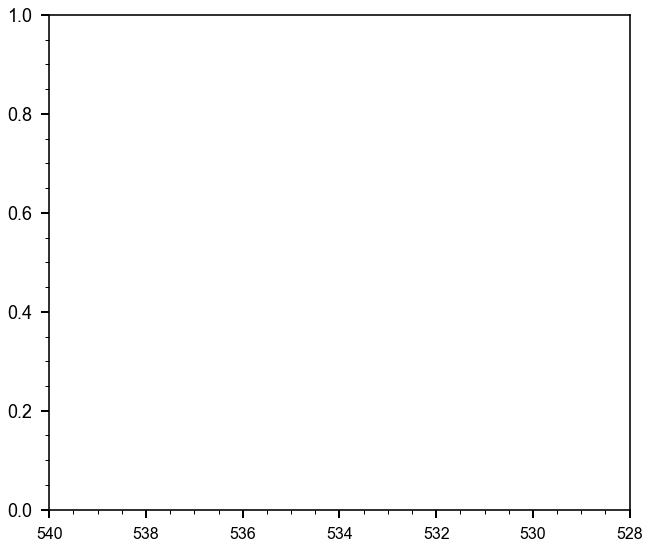

In [65]:
for i,xp in enumerate(ausub_exps):
    plot_region(xp, 'O_1s-v0_-v2_', offset=100*i)
ax = plt.gca()
ax.set(xlim=(540, 528))
ax.get_legend().remove()

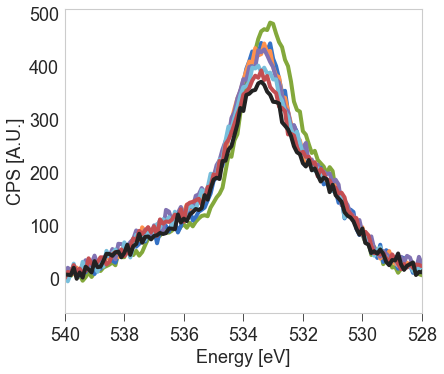

In [178]:
for i,xp in enumerate(ausub_exps):
    plot_region(xp, 'O_1s-v0_-v2_', offset=0*i)
ax = plt.gca()
ax.set(xlim=(540, 528))
ax.get_legend().remove()

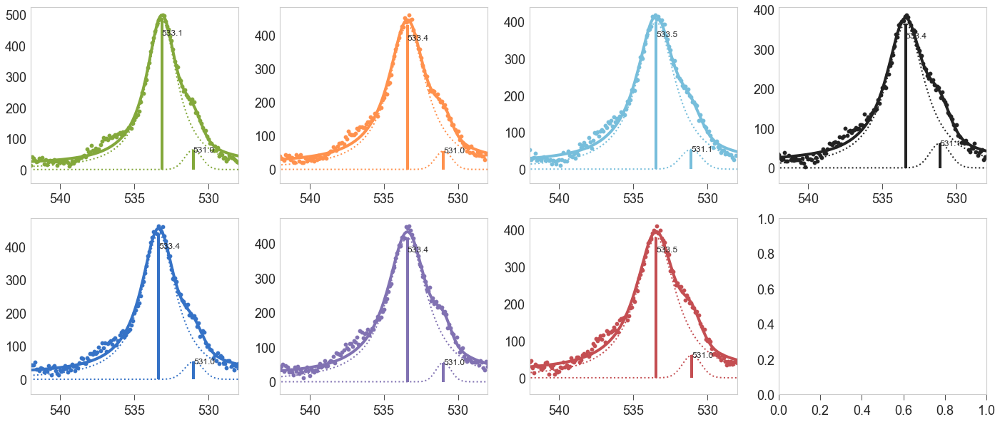

In [186]:
fig, ax = plt.subplots(2,4, figsize=(24, 10))
for i,xp in enumerate(ausub_exps):
    j,k = i//2, i%2
    Fn = XPFit(xp, 'O_1s-v0_-v2_')
    Fn.double_voigt(sepPt=532)
    plot_fit_result(xp, 'O_1s-v0_-v2_', ax=ax[k,j])
    ax[k,j].set(xlim=(542, 528))
# ax.get_legend().remove()

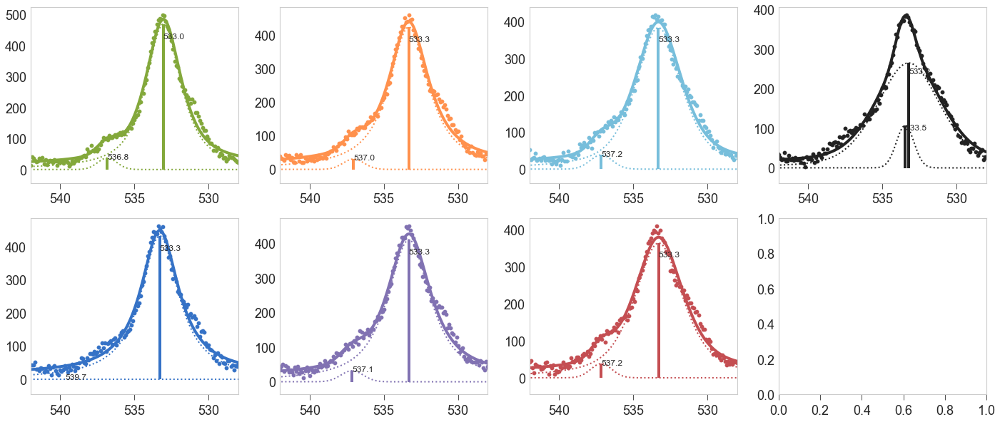

In [185]:
fig, ax = plt.subplots(2,4, figsize=(24, 10))
for i,xp in enumerate(ausub_exps):
    j,k = i//2, i%2
    Fn = XPFit(xp, 'O_1s-v0_-v2_')
    Fn.double_voigt(sepPt=535)
    plot_fit_result(xp, 'O_1s-v0_-v2_', ax=ax[k,j])
    ax[k,j].set(xlim=(542, 528))
# ax.get_legend().remove()

## Subtract clean gold for Sample 3 (progBa)

In [163]:
def subtract_ref_region(xp : XPS_experiment, xpRef: XPS_experiment, region: str, inplace : bool = False):
    """Subtract the counts in a region in xpRef from xp"""

    df, dfRef = xp.dfx[region].dropna(), xpRef.dfx[region].dropna()
    y_sub = df.counts - dfRef.counts
    if inplace:
        xp.dfx[region] = pd.DataFrame([xp.dfx[region].energy, y_sub]).T
        return xp
    else:
        xpNew = deepcopy(xp)
        xpNew.dfx[region] = pd.DataFrame([xpNew.dfx[region].energy, y_sub]).T
        return xpNew

In [18]:
norm3 = [normalise_dfx(xp) for xp in raw3]

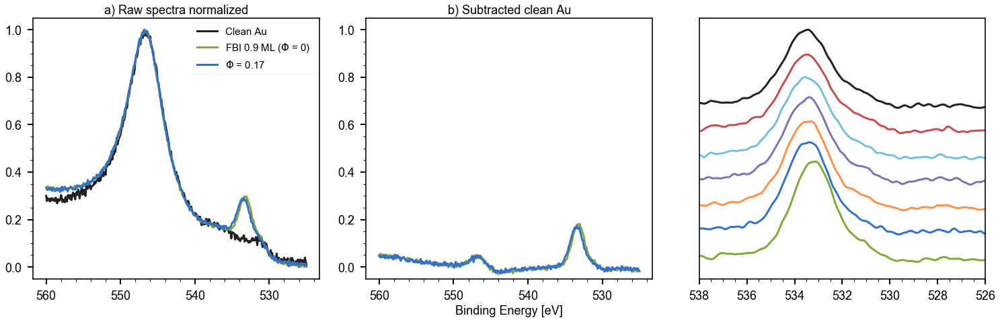

In [19]:
plt.rcParams['lines.linewidth'] = 3

region = 'O_1s'
# xp0 = norm3[0]
xp0 = gaussian_smooth(norm3[0], region, sigma=7)

fig, ax = plt.subplots(1, 3, figsize=(21, 7))
x = xp0.dfx[region].dropna().energy.values
y0 = xp0.dfx[region].dropna().counts.values
lb = ['Clean Au', 'FBI 0.9 ML ($\\Phi$ = 0)', '$\\Phi$ = 0.17']

refau_sub = []
for i,xp in enumerate(norm3):
    if i < 3:
        plot_region(xp, region, ax=ax[0])
    xpdif = subtract_ref_region(xp, xp0, region)
    if i > 0:
        x = xpdif.dfx[region].energy
        y = xpdif.dfx[region].counts
        if i < 3:
            plot_region(xpdif, region, ax=ax[1])
            
#         ax[2].scatter(x, y, color=xpdif.color)
        plot_region(gaussian_smooth(xpdif, region, sigma=1), region, offset=0.05*i, ax=ax[2])
    crop_spectrum(xpdif, region, eup=537, edw=530, inplace=True)
    refau_sub.append(xpdif)
ax[0].legend(ax[0].get_lines(), lb)

tit = ['a) Raw spectra normalized', 'b) Subtracted clean Au', '']
for j,a in enumerate(ax):
    a.set_title(tit[j])
ax[0].invert_xaxis()
ax[1].invert_xaxis()
ax[1].set(ylim=ax[0].get_ylim(), xlabel='Binding Energy [eV]')

ax[2].set(yticks=[], xlim=(538, 526), ylabel=None, xlabel=None)
ax[2].get_legend().remove()
# ax[2].invert_xaxis()
plt.tight_layout()
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/si_ausub.a).png',
#             dpi=600)

In [170]:
# norm3[0] = gaussian_smooth(norm3[0], region, sigma=7)
# norm3[0] = normalise_dfx(norm3[0])

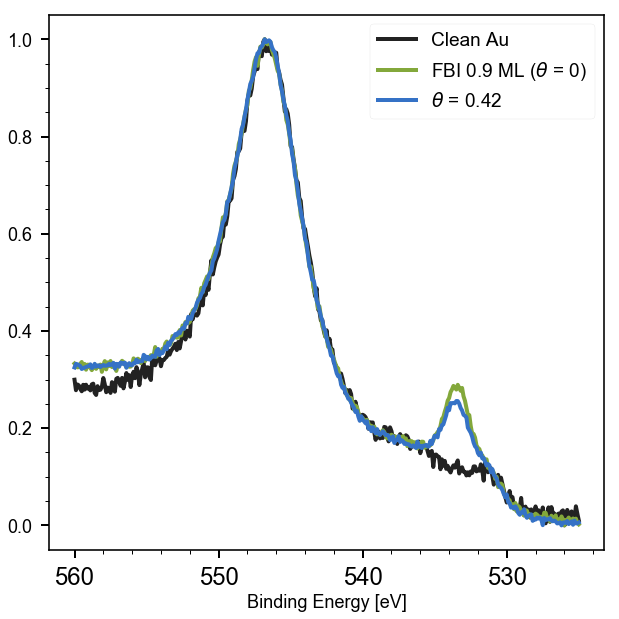

In [312]:
norm3[-1].color = 'b'

region = 'O_1s'
xp0 = norm3[0]
norm3[2].color = 'g'
plt.figure(figsize=(9,9))

lb = ['Clean Au', 'FBI 0.9 ML ($\\theta$ = 0)', '$\\theta$ = 0.42']

plot_region(xp0, region)
plot_region(norm3[2], region)
plot_region(norm3[-1], region)

plt.legend(plt.gca().get_lines(), lb, fontsize=19)
plt.gca().set(xlabel='Binding Energy [eV]', ylabel=None)
# plt.gca().invert_xaxis()
plt.tight_layout()
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig2_xps_chelation/fig2_xps_chelation.e).png',
            dpi=600, transparent=True)

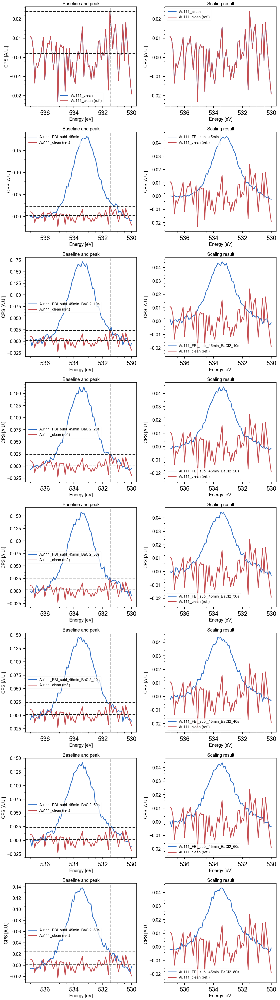

In [277]:
refau_sub = scale_and_plot_spectra(refau_sub, region=region)

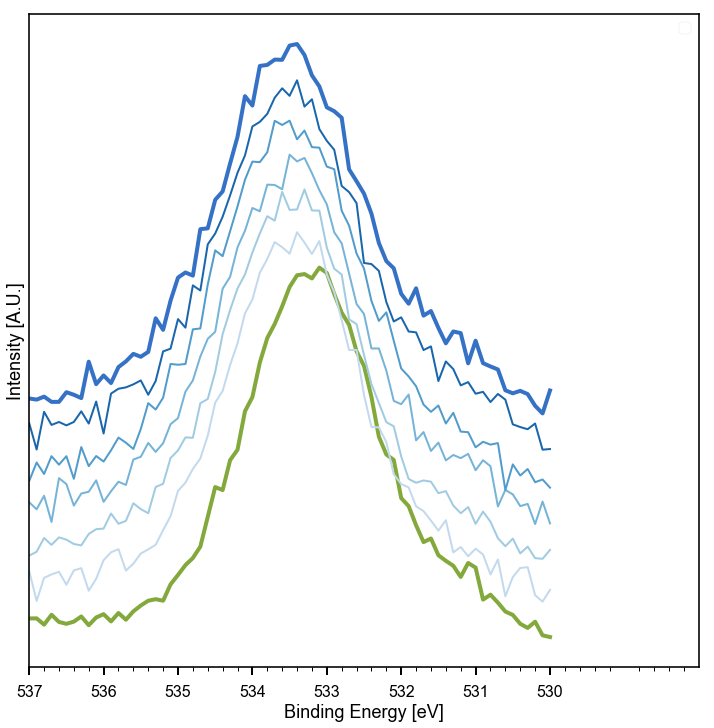

In [88]:
plt.rcParams['lines.linewidth'] = 4
plt.figure(figsize=(12,12))
cmap = plt.cm.Blues
norm = Normalize(vmin=-15, vmax=80)
blues = [0, 10, 20, 30, 40, 60, 80]
for i,xp in enumerate(refau_sub[1:-1]):
    if i == 0: col = 'g'
    else: col = cmap(norm(blues[i]))
    plot_region(xp, region, col=col, offset=0.005*i, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
    plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.linewidth'] = 4
plot_region(refau_sub[-1], region, col='b', offset=0.005*(i+1), lb='__nolabel__')#'$\\Phi$ = %.2f'%fbibaratio[i])

ax = plt.gca()

ax.set(yticks=[],  xlim=(537, 528) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
ax.set_xticks(range(530, 538),);

# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/si_ausub.b).png',
#             dpi=2000)

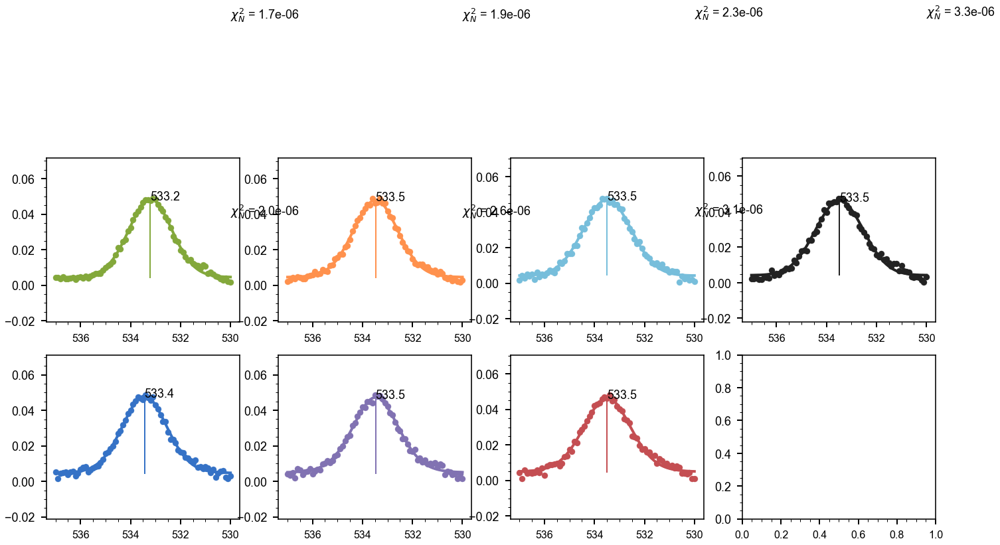

In [89]:
r = 'O_1s'
fig, ax = plt.subplots(2,4, figsize=(24, 10))
for i,xp in enumerate(refau_sub[1:]):
    j,k = i//2, i%2
    Fn = XPFit(xp, r)
    
    Fn.pvoigt()
    plot_fit_result(xp, r, ax=ax[k,j])
    ax[k,j].text(s='$\chi^2_N$ = %.1e' %xp.fit[r].redchi, x=530, y=0.15)
# ax.get_legend().remove()

Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars
Modify user pars


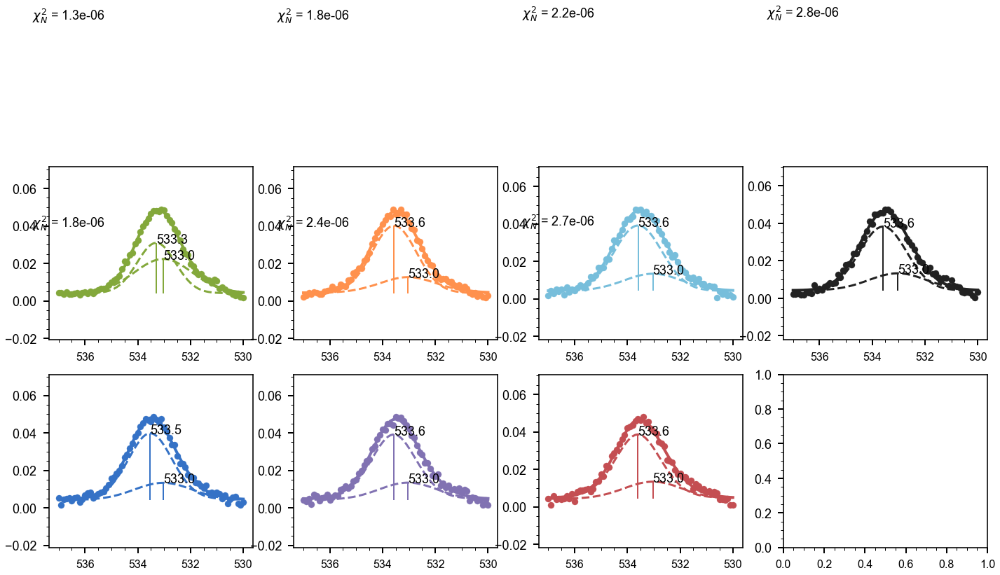

In [90]:
fig, ax = plt.subplots(2,4, figsize=(24, 10))
for i,xp in enumerate(refau_sub[1:]):
    j,k = i//2, i%2
    Fn = XPFit(xp, 'O_1s')
    if i > 0:
        Fn.preset_pars('v2_sigma', refau_sub[1].fit['O_1s'].best_values['v2_sigma'])
        Fn.preset_pars('v2_center', refau_sub[1].fit['O_1s'].best_values['v2_center'])
        Fn.preset_pars('v2_amplitude', refau_sub[1].fit['O_1s'].best_values['v2_amplitude']/2)
    if i > 1:
        Fn.preset_pars('v2_amplitude', refau_sub[2].fit['O_1s'].best_values['v2_amplitude'])  
#         Fn.preset_pars('v1_amplitude', refau_sub[2].fit['O_1s'].best_values['v1_amplitude'])
#         Fn.preset_pars('v1_sigma', refau_sub[2].fit['O_1s'].best_values['v1_sigma'])
    Fn.double_pvoigt(sepPt=532)
    plot_fit_result(xp, 'O_1s', ax=ax[k,j])
    ax[k,j].text(s='$\chi^2_N$ = %.1e' %xp.fit[r].redchi, x=538, y=0.15)
    
# ax.get_legend().remove()

In [94]:
r = 'O_1s'
for xp in refau_sub[1:]:
    print(xp.fit[r].best_values['v1_center'], xp.fit[r].best_values['v2_center'])

533.2977300329123 533.0320201470184
533.5251961427088 533.0320201470184
533.559286191766 533.0320201470184
533.575467665355 533.0320201470184
533.5917841424327 533.0320201470184
533.5977376051832 533.0320201470184
533.5857422059734 533.0320201470184


In [36]:
r = 'O_1s'
for xp in refau_sub[1:]:
    print(2*xp.fit[r].best_values['v1_sigma'], 2*xp.fit[r].best_values['v2_sigma'])

9.59168271481212 2.0372638454898597
2.0369404099415496 2.0372638454898597
1.9781777887551417 2.0372638454898597
2.0839781041459453 2.0372638454898597
2.0303932591272984 2.0372638454898597
1.9774705862839812 2.0372638454898597
1.9149084535062104 2.0372638454898597


In [249]:
r = 'O_1s'
for xp in refau_sub[1:]:
    print(xp.fit[r].best_values['v1_amplitude'], xp.fit[r].best_values['v2_amplitude'])

2.8388180695060328e-11 0.39536239901557746
0.1877351447848219 0.19768119950778873
0.16634631652641052 0.19768119950778873
0.1617182509207138 0.19768119950778873
0.14547738288136425 0.19768119950778873
0.12862415242237035 0.19768119950778873
0.12062105408917079 0.19768119950778873


## Subtract Clean Au for Sample 2

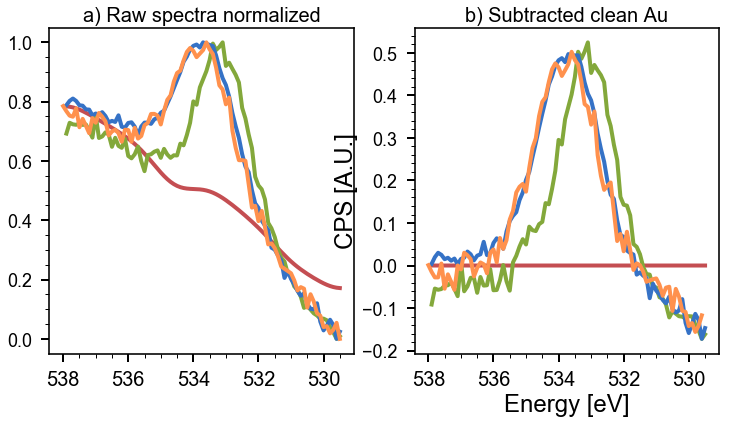

In [194]:
region = 'O_1s'
xp0 = gaussian_smooth(norm2[0], region, sigma=6)
# xp0 = gaussian_smooth(trim_spectra(norm3[0], norm2[3], region), region, sigma=3)
# xp0 = norm2[0]

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
x = xp0.dfx[region].dropna().energy.values
y0 = xp0.dfx[region].dropna().counts.values
# ax[0].plot(x, y0)
refau_sub2 = []
for i,xp in enumerate([xp0]+norm2[1:]):
    plot_region(xp, region, ax=ax[0])
    xpdif = subtract_ref_region(xp, xp0, region)
    plot_region(xpdif, region, ax=ax[1])
#     crop_spectrum(xpdif, region, eup=538, edw=529, inplace=True)
    refau_sub2.append(xpdif)
    
tit = ['a) Raw spectra normalized', 'b) Subtracted clean Au', 'c) Same as b) with offset and shorter energy range']
for j,a in enumerate(ax):
    a.set_title(tit[j])
ax[0].invert_xaxis()
ax[1].invert_xaxis()
ax[1].get_legend().remove()
# ax[2].invert_xaxis()

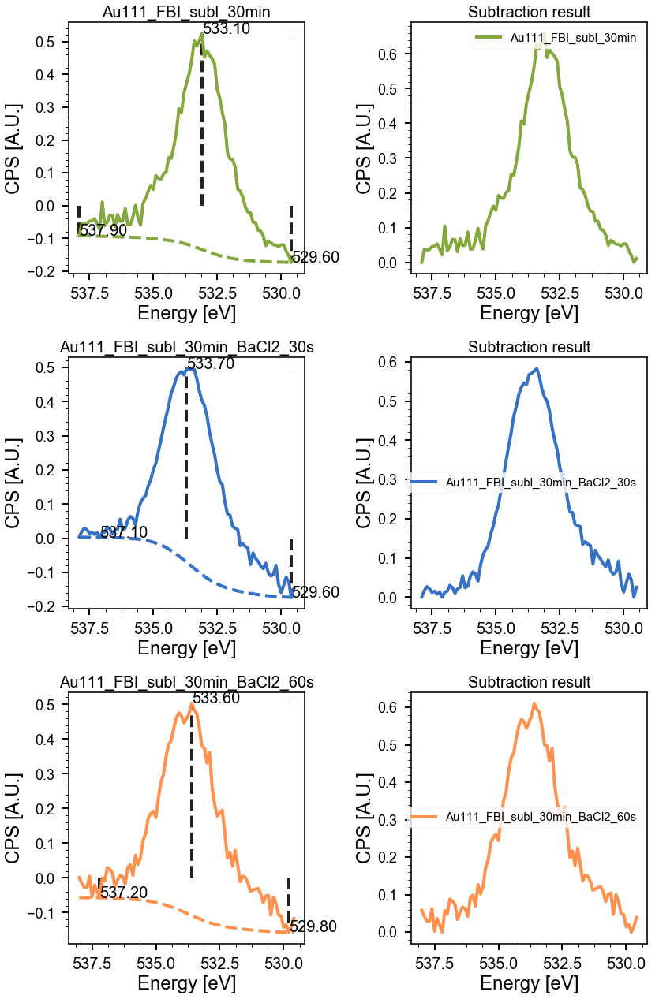

In [195]:
refau_sub2[1:] = region_bg_subtract(refau_sub2[1:], region)

#### Store the background froom Au clean

In [196]:
for xp in refau_sub2[1:]:
    xp.dfx['O_1s_bg'].counts = xp.dfx['O_1s_bg'].dropna().counts + y0

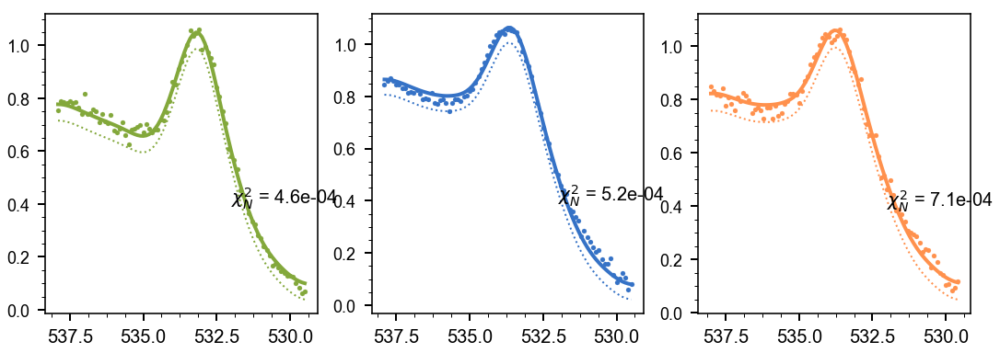

In [210]:
r = 'O_1s'
fig, ax = plt.subplots(1,3, figsize=(18, 6))
for i,xp in enumerate(refau_sub2[1:]):
    Fn = XPFit(xp, r)
    
    Fn.pvoigt()
    plot_fit_result(xp, r, ax=ax[i], plot_bg=True)
    ax[i].text(s='$\chi^2_N$ = %.1e' %xp.fit[r].redchi, x=532, y=0.4)
# ax.get_legend().remove()

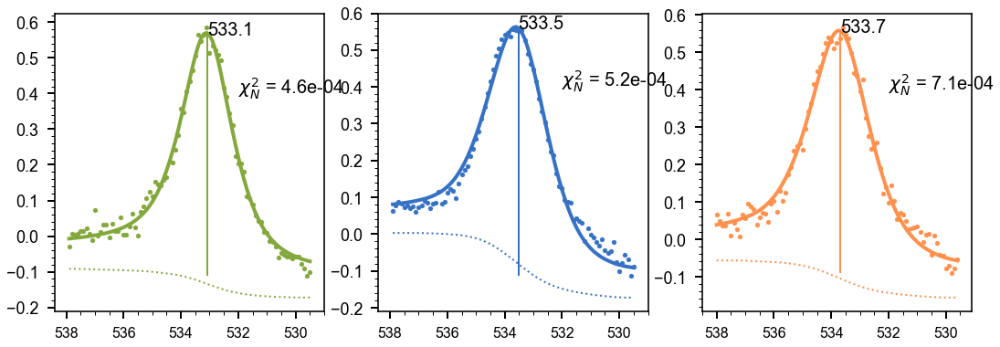

In [240]:
r = 'O_1s'
fig, ax = plt.subplots(1,3, figsize=(18, 6))
for i,xp in enumerate(refau_sub2[1:]):
    Fn = XPFit(xp, r)
    
    Fn.pvoigt()
    plot_fit_result(xp, r, ax=ax[i], plot_bg=True)
    ax[i].text(s='$\chi^2_N$ = %.1e' %xp.fit[r].redchi, x=532, y=0.4)
# ax.get_legend().remove()

Modify user pars
Modify user pars
Modify user pars


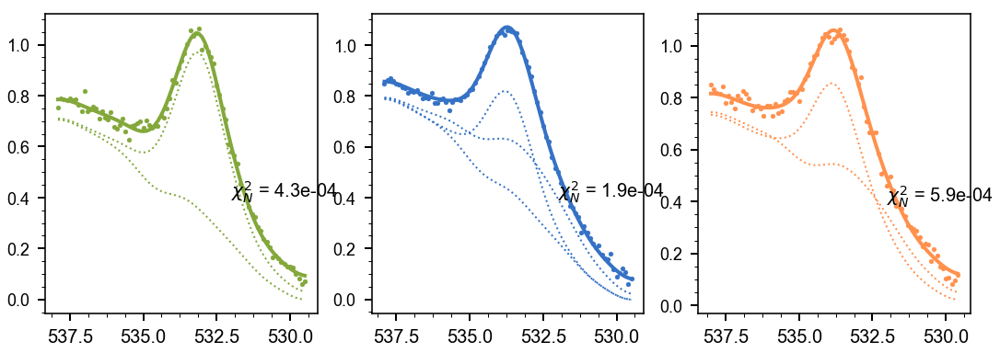

In [211]:
r = 'O_1s'
fig, ax = plt.subplots(1,3, figsize=(18, 6))
for i,xp in enumerate(refau_sub2[1:]):
    Fn = XPFit(xp, r)
    if i > 0:
#         Fn.preset_pars('v2_sigma', refau_sub2[1].fit['O_1s'].best_values['v2_sigma'])
        Fn.preset_pars('v2_center', refau_sub2[1].fit['O_1s'].best_values['v2_center'])
        Fn.preset_pars('v2_amplitude', refau_sub2[1].fit['O_1s'].best_values['v2_amplitude']/2)
    fitv = Fn.double_pvoigt(sepPt=532)
    if i == 1: Fn.gauss_shoulder(fitv, par_g=[0.1, 537, 1], bounds_g=[(0.01, 0.2), (536.5, 537.5), (0.8, 1.5)])
    plot_fit_result(xp, r, ax=ax[i], plot_bg=True)
    ax[i].text(s='$\chi^2_N$ = %.1e' %xp.fit[r].redchi, x=532, y=0.4)
# ax.get_legend().remove()

Modify user pars
Modify user pars
Modify user pars


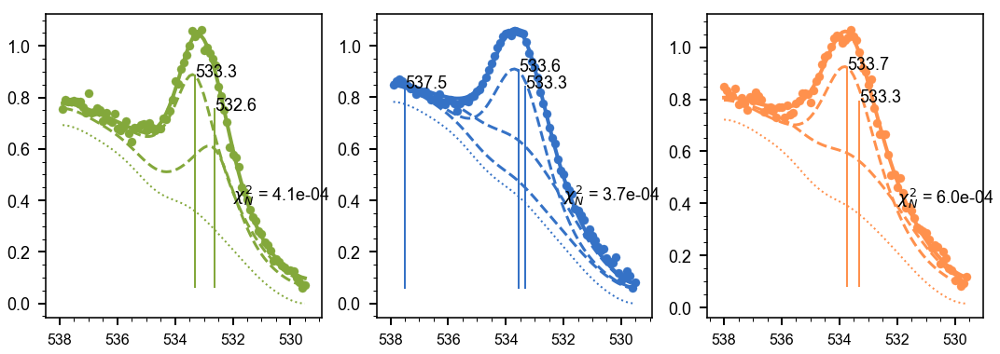

In [104]:
r = 'O_1s'
fig, ax = plt.subplots(1,3, figsize=(18, 6))
for i,xp in enumerate(refau_sub2[1:]):
    Fn = XPFit(xp, r)
    if i > 0:
#         Fn.preset_pars('v2_sigma', refau_sub2[1].fit['O_1s'].best_values['v2_sigma'])
        Fn.preset_pars('v2_center', refau_sub2[1].fit['O_1s'].best_values['v2_center'])
        Fn.preset_pars('v2_amplitude', refau_sub2[1].fit['O_1s'].best_values['v2_amplitude']/2)
    fitv = Fn.double_pvoigt(sepPt=532)
    if i == 1: Fn.gauss_shoulder(fitv, par_g=[0.1, 537, 1], bounds_g=[(0.01, 0.2), (536.5, 537.5), (0.8, 1.5)])
    plot_fit_result(xp, r, ax=ax[i], plot_bg=True)
    ax[i].text(s='$\chi^2_N$ = %.1e' %xp.fit[r].redchi, x=532, y=0.4)
# ax.get_legend().remove()

## Subtract Clean Au for Sample 1 (NaCl)

In [112]:
# nacl[0], nacl[1] = nacl[1], nacl[0]
[xp.name for xp in raw1]

['Au111_clean',
 'Au111_FBI_subl_30min',
 'Au111_FBI_subl_30min_NaCl_2min',
 'Au111_FBI_subl_30min_NaCl_2min_150ºC']

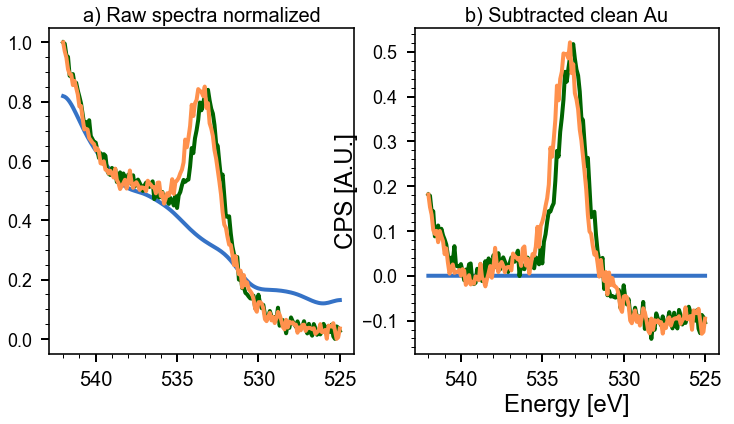

In [170]:
region = 'O_1s'
xp0 = gaussian_smooth(norm1[0], region, sigma=7)
# xp0 = norm1[0]

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
x = xp0.dfx[region].dropna().energy.values
y0 = xp0.dfx[region].dropna().counts.values
# ax[0].plot(x, y0)
refau_sub1 = []
for i,xp in enumerate([xp0]+norm1[1:3]):
# for i,xp in enumerate(norm1):
    plot_region(xp, region, ax=ax[0])
    xpdif = subtract_ref_region(xp, xp0, region)
    plot_region(xpdif, region, ax=ax[1])
#     crop_spectrum(xpdif, region, eup=538, edw=529, inplace=True)
    refau_sub1.append(xpdif)
    
tit = ['a) Raw spectra normalized', 'b) Subtracted clean Au', 'c) Same as b) with offset and shorter energy range']
for j,a in enumerate(ax):
    a.set_title(tit[j])
ax[0].invert_xaxis()
ax[1].invert_xaxis()
ax[1].get_legend().remove()
# ax[2].invert_xaxis()

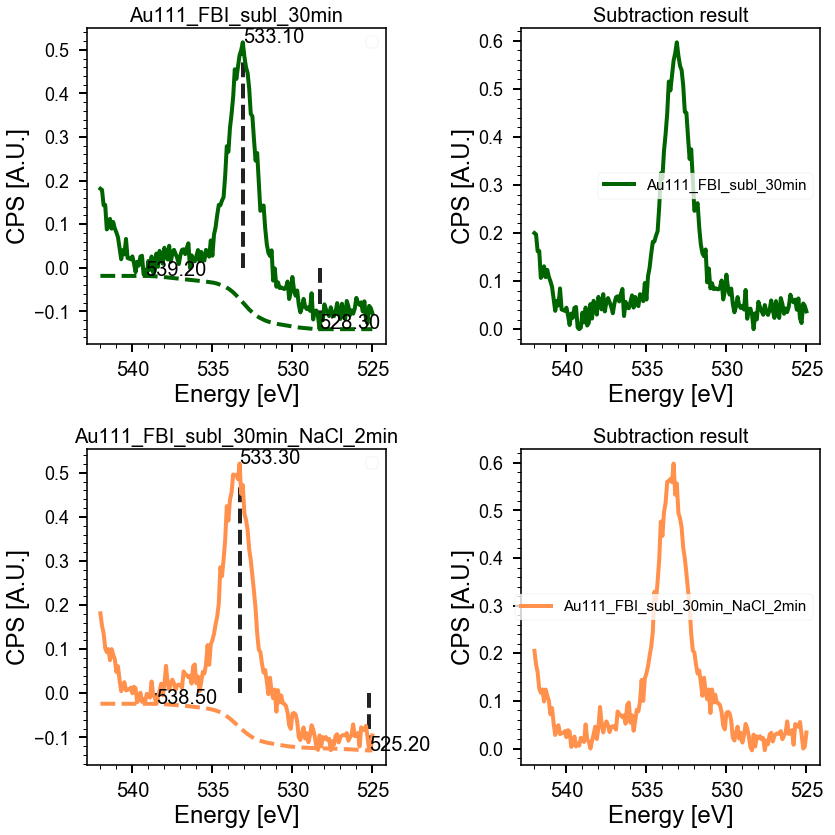

In [171]:
refau_sub1[1:] = region_bg_subtract(refau_sub1[1:], region)

In [172]:
for xp in refau_sub1[1:3]:
    xp.dfx['O_1s_bg'].counts = xp.dfx['O_1s_bg'].dropna().counts + y0

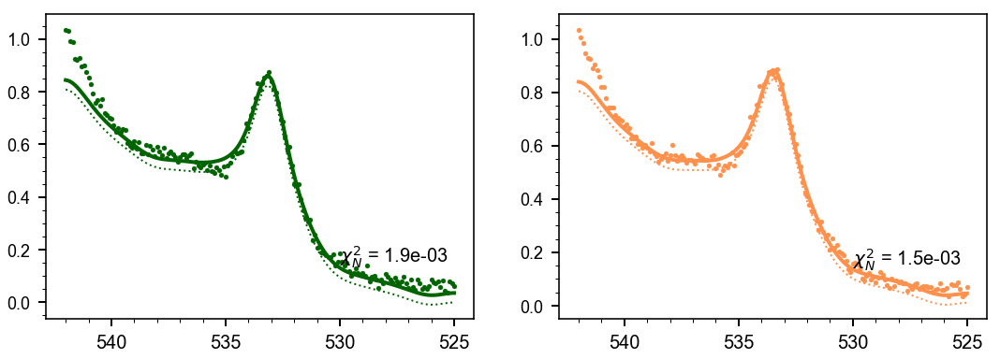

In [173]:
r = 'O_1s'
fig, ax = plt.subplots(1,2, figsize=(18, 6))
for i,xp in enumerate(refau_sub1[1:]):
    Fn = XPFit(xp, r)
    
    Fn.pvoigt()
    plot_fit_result(xp, r, ax=ax[i], plot_bg=True)
    ax[i].text(s='$\chi^2_N$ = %.1e' %xp.fit[r].redchi, x=530, y=0.15)
# ax.get_legend().remove()

# Export curves 

In [409]:
os.path.splitext(path+'.csv')

('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/exported_data/fig2d_',
 '.csv')

In [20]:
def export_csv_region(file: str, xp: XPS_experiment, regions: list = None):
    """Export to Igor compatible csv format"""
    if regions == None: regions = xp.dfx.columns.levels[0].values
    for r in regions:
        filename, extension = os.path.splitext(file)
        filename += '_'+r
        file = filename+extension
        with open(file, 'w') as fout:
            header = r+'_BE\t' +r+'_cps\t'
            fout.write(header+'\n')
            xp.dfx[r].to_csv(fout, sep='\t', na_rep='NaN', index=None, header=False)

In [26]:
regions=['C_1s', 'N_1s', 'O_1s']
sel = [norm2[1], norm2[2], norm1[1], norm1[2]]
for i,xp in enumerate(sel):
    xpn = XPS_experiment(path = path)
    frames = []
        
    for j, r in enumerate(regions):
        frames.append(xp.dfx[r])
    dfx = pd.concat(frames, axis=1)
    mi = pd.MultiIndex.from_product([regions, np.array(['energy', 'counts'])], names=['range', 'properties'])

    mi.to_frame()
    dfx.columns = mi
    xpn.dfx = dfx
    export_csv(path+xp.date.replace('.','')+'_'+xp.name+'.csv', xpn)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_*/**/*.uxy20210510_Au111_FBI_subl_30min.csv'

In [32]:
path = '/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/exported_paper_xps_fbi/fig2d_'

for xp in norm3:
    export_csv(path+xp.date.replace('.','')+'_'+xp.name+'.csv', xp)

In [518]:
path = '/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/exported_paper_xps_fbi/fig2_'
for xp in sel:
#     print(xp.name)
    export_csv(path+xp.date.replace('.','')+'_'+xp.name+'.csv', xp)

In [513]:
region = 'O_1s'
fbibaratio = [0, 3.85, 3.0, 2.74, 2.01, 1.87, 1.55]
frames = []
for i,xp in enumerate(refau_sub[1:]):
    frames.append(xp.dfx[region])
names = ['FBI:Ba='+str(i) for i in fbibaratio]
dfx = pd.concat(frames, axis=1)
mi = pd.MultiIndex.from_product([names, np.array(['energy', 'counts'])], names=['range', 'properties'])

mi.to_frame()
dfx.columns = mi
xp2d.dfx = dfx
export_csv(path+'FBI:Ba.csv', xp2d)

In [65]:
region = 'O_1s'
path = '/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/exported_paper_xps_fbi/fig2_'
# fbibaratio = [0, 3.85, 3.0, 2.74, 2.01, 1.87, 1.55]
frames = []
for i,xp in enumerate(refau_sub2[1:3]):
    print(xp.name)
    export_csv_region(path+xp.name+'.csv', xp, regions=['O_1s'])

Au111_FBI_subl_30min
Au111_FBI_subl_30min_BaCl2_30s


In [511]:
path = '/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/exported_paper_xps_fbi/fig2d_'
fbibaratio = [0, 3.85, 3.0, 2.74, 2.01, 1.87, 1.55]
for i,xp in enumerate(refau_sub[1:]):
    print(xp.name)
    export_csv_region(path+'FBI:Ba='+str(fbibaratio[i])+'.csv', xp, regions=['O_1s'])

Au111_FBI_subl_45min
Au111_FBI_subl_45min_BaCl2_10s
Au111_FBI_subl_45min_BaCl2_20s
Au111_FBI_subl_45min_BaCl2_30s
Au111_FBI_subl_45min_BaCl2_40s
Au111_FBI_subl_45min_BaCl2_60s
Au111_FBI_subl_45min_BaCl2_80s


In [414]:
selcu = [progba[0], progba[3], nacl[0], nacl[2]]

path = '/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/exported_data/fig5_cu_'
for i,xp in enumerate(selcu):
    print(xp.name)
    export_csv_region(path+xp.name+'.csv', xp, regions=['O_1s'])

16-Cu_FBI_subl_22min
16-Cu_FBI_subl_22min_BaCl2_6min
18-Cu_FBI_subl_20min
18-Cu_FBI_subl_20min_NaCl_2min


In [415]:
path = '/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/exported_data/fig5_ito_'
for i,xp in enumerate(qito[2:]):
    print(xp.name)
    export_csv_region(path+xp.name+'.csv', xp, regions=['O_1s'])

3-qITO_FBI_subl_40min
3-qITO_FBI_subl_40min_BaCl2_5min
3-qITO_clean


# Dev: fit + background

## Fig 2 (sample 1-2)

In [174]:
trim_spectra(norm2[2], norm2[1], 'N_1s', inplace=True);

In [217]:
def plot_fit_result(xp: XPS_experiment, region: str, fitRes: ModelResult = None,
                    lb : str = None, ax = None, col:str = None, offset: float = 0.3, off2: float = 0,
                    plot_comps: bool = True, plot_bg:bool = False, scat:bool =True, 
                    flag_fill: bool = False, colf: list = None):
    if ax == None : ax = plt.gca()
    if col == None: col = xp.color
    if lb == None: lb = xp.name
    if fitRes == None: fitRes = xp.fit[region]

    x = xp.dfx[region].dropna().energy
    ybg = np.zeros_like(x)
    
    offset *= np.average(xp.dfx[region].dropna().counts.values)
    off2 *= np.average(xp.dfx[region].dropna().counts.values)
    
    if plot_bg == True:
        try:
            ybg = xp.dfx[region+'_bg'].dropna().counts
#             ax.plot(x, ybg , ls='dashed', color=col, lw=3, label='__nolabel__')
        except KeyError as e:
            print('Background not found for ', e)
            
    if scat:
        p1 = ax.scatter(x, xp.dfx[region].dropna().counts + ybg + offset,
                        color=col, label=lb, zorder = 1)

    ax.plot(x, fitRes.best_fit + ybg + offset, '-', color=col, label='__nolabel__')#label='best fit, $\chi^2_N$ = %.2e' %fitRes.redchi)
#     ax.legend(loc='center left', fontsize=18)
#     colf = ['g', 'b']
    if plot_comps:
        comps = fitRes.eval_components(x=x)
        for i,compo in enumerate(comps):
            posx = fitRes.best_values[compo+'center']
            colc = ax.plot(x, comps[compo] + ybg + off2, ls='dotted', lw=2, color=col, label='__nolabel__')[0].get_color()

#             ax.vlines(x=posx, ymin=ybg.min() + offset, ymax=(comps[compo] + ybg + offset).max(), lw=2, linestyle='-', colors=col)
#             ax.text(x=posx, y=(comps[compo] + offset + ybg).max()*0.99, s='%.1f' %posx)
            if flag_fill:
                ax.fill_between(x, y1 = ybg + off2, y2 = comps[compo] + ybg + off2, alpha=0.3, color=colf[i])
    ax.invert_xaxis()
    return ax, offset

def fix_tail_bg(xp: XPS_experiment, region: str, eup: float = None, edw: float = None,
                ax = None, store:bool = True, inplace: bool = False):
    """Subtract ALS of the upper or lower tailing of a peak.
       Parameters:
           eup: upper energy limit
           edw: lower energy limit. Specify either one or the other"""

    xpf = deepcopy(xp)
    if ax == None: ax = plt.gca()

    xpcrop = crop_spectrum(xpf, region, eup=eup, edw=edw)  # Crop the tail to fix bg subtraction
    xpcropBg = subtract_als_bg(xpcrop, region, ax=ax)           # Subtract ALS bg

    dfshort = xpcropBg.dfx[region]                         # Set energy column as index for the whole and the cropped data
    dfshort.set_index('energy', drop=False, inplace=True)
    dfWhole = xpf.dfx[region]
    dfWhole.set_index('energy', drop=False, inplace=True)

    if eup != None:
        dfWhole['counts'].loc[eup:] = dfshort.dropna()['counts'].loc[eup:]   # Update the values of the tail
    elif edw != None:
        dfWhole['counts'].loc[:edw] = dfshort.dropna()['counts'].loc[:edw]   # Update the values of the tail
    else: print('Error: specify upper or lower limit')

    dfWhole.reset_index(drop=True, inplace=True)             # Reset the index and update the dfx in XPS_experiment

    xpf.dfx[region] = dfWhole
    plot_region(xpf, region, ax = ax)
    ax.invert_xaxis()

    if inplace:
        xp.dfx[region] = dfWhole

        if store:
            region += '_bg'
            dfWhole = xp.dfx[region]                # Set energy column as index for the whole and the cropped data
            dfshort = xpcropBg.dfx[region]
        
            dfWhole.set_index('energy', drop=False, inplace=True)
            dfshort.set_index('energy', drop=False, inplace=True)

            dfWhole.counts.loc[dfshort.index.dropna()] += dfshort.counts.dropna()
            dfWhole.reset_index(drop=True, inplace=True)             # Reset the index and update the dfx in XPS_experiment
            xp.dfx[region] = dfWhole
        return xp

    else: return xpf 

Au111_FBI_subl_30min C_1s
Au111_FBI_subl_30min N_1s
Au111_FBI_subl_30min Ba_3d
Au111_FBI_subl_30min_BaCl2_30s C_1s
Au111_FBI_subl_30min_BaCl2_30s N_1s
Au111_FBI_subl_30min_BaCl2_30s Ba_3d
Au111_FBI_subl_30min C_1s
Au111_FBI_subl_30min N_1s
Au111_FBI_subl_30min Ba_3d
Au111_FBI_subl_30min_NaCl_2min C_1s
Au111_FBI_subl_30min_NaCl_2min N_1s
Au111_FBI_subl_30min_NaCl_2min Ba_3d
Au111_FBI_subl_30min_BaCl2_60s C_1s
Au111_FBI_subl_30min_BaCl2_60s N_1s
Au111_FBI_subl_30min_BaCl2_60s Ba_3d


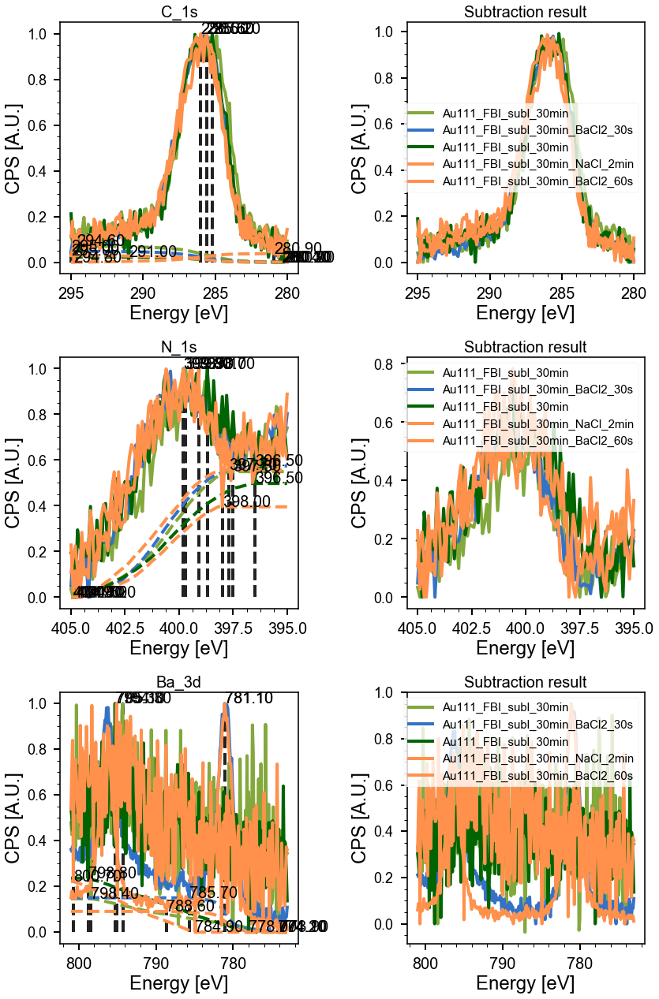

In [200]:
sel = [norm2[1], norm2[2], norm1[1], norm1[2], norm2[3]]
bg2 = bulk_bg_subtract(sel, ['C_1s', 'N_1s', 'Ba_3d'])

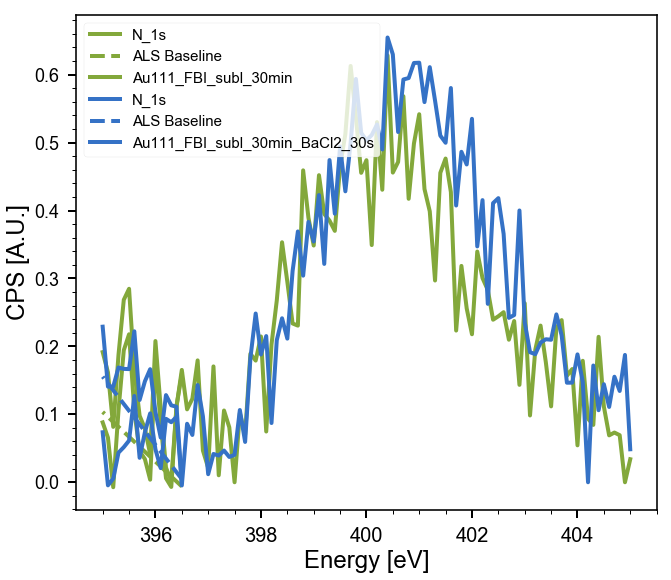

In [201]:
for xp in bg2[:2]:
    fix_tail_bg(xp, 'N_1s', eup=396.5, inplace=True);

Modify user pars


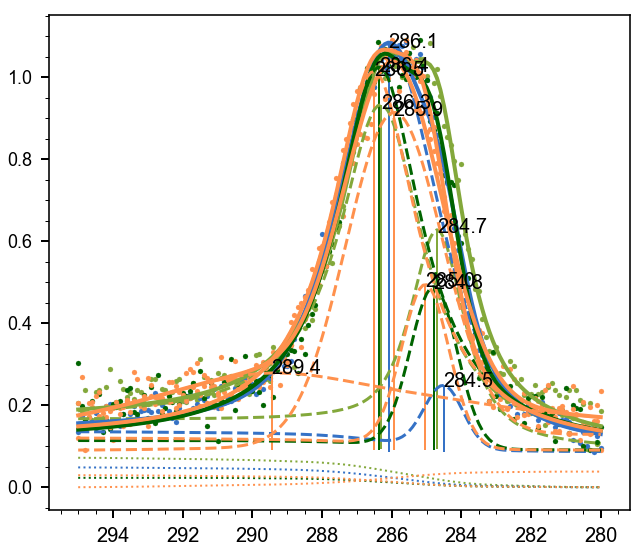

In [202]:
for i, xp in enumerate(bg2):
    Fn = XPFit(xp, 'C_1s')
    if i == 1:
        Fn.preset_pars('v1_center', 284.51)
    Fn.double_pvoigt(sepPt=285)
    Fn.plot(plot_bg=True)

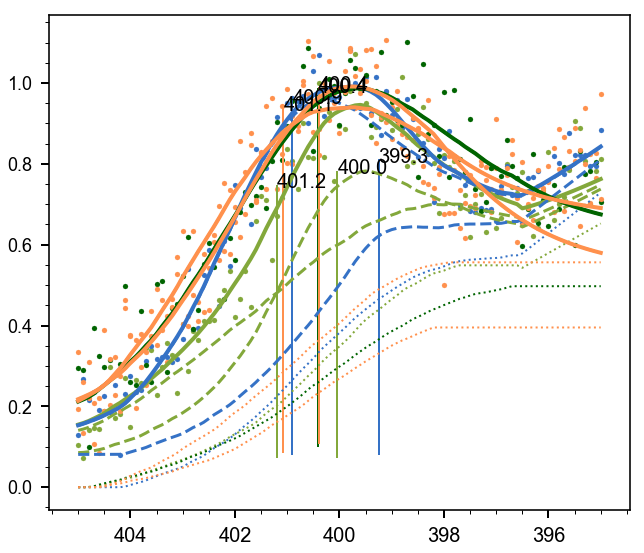

In [203]:
for i, xp in enumerate(bg2):
    Fn = XPFit(xp, 'N_1s')
    if i < 2: 
        Fn.double_voigt(400)
    else:
        Fn.voigt()
    Fn.plot(plot_bg=True)

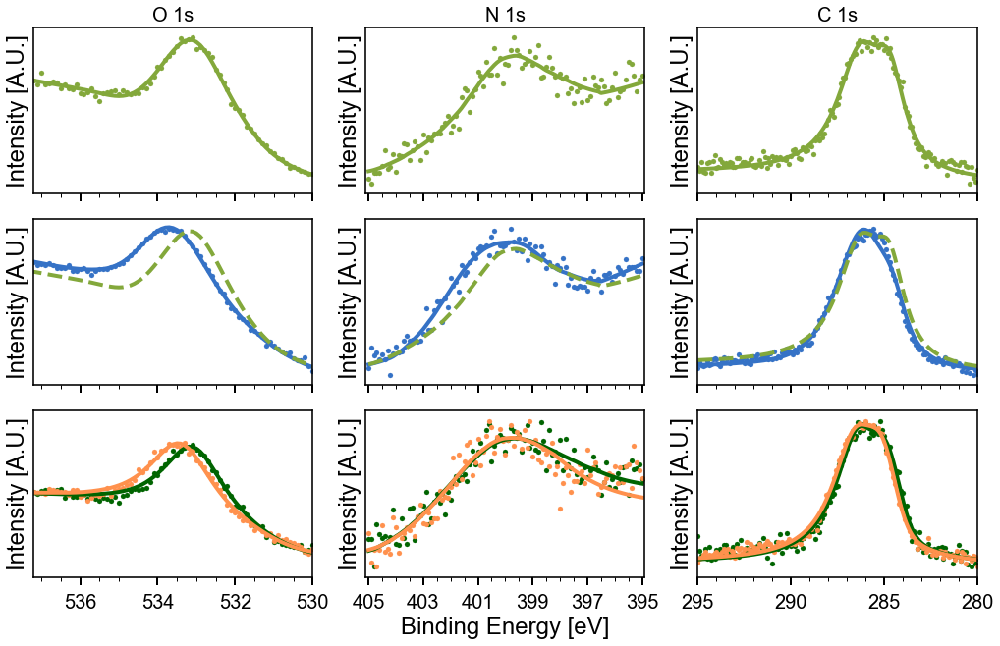

In [204]:
regs = ['N_1s', 'C_1s']
off = [800, 800, 400]
plt.rc('xtick', labelsize= 20)
plt.rc('font', size= 20)
plt.rc('lines', markersize=5)

fig, ax = plt.subplots(3,3, figsize=(14, 9), )
selo = [refau_sub2[1], refau_sub2[2], refau_sub1[1], refau_sub1[2]]
for i, xp in enumerate(selo[:3]):
    plot_fit_result(xp, 'O_1s', ax=ax[i,0], plot_bg=True, plot_comps=False)
    ax[i,0].set(yticks=[], xlim=(537.2, 530), ylabel='Intensity [A.U.]', xlabel=None)
    if i < 2: ax[i,0].tick_params(axis='x', labelbottom='off')
    ax[i,0].set_facecolor('0.999')  
#     ax[i,0].set(ylabel='Intensity [A.U.]')

plot_fit_result(selo[0], 'O_1s', scat=False, ax=ax[1,0], plot_bg=True, plot_comps=False)
ax[1,0].invert_xaxis()
ax[1,0].get_lines()[1].set(ls='--')
ax[0,0].set(title='O 1s')

plot_fit_result(selo[3], 'O_1s', ax=ax[i,0], plot_bg=True, plot_comps=False)
ax[2,0].invert_xaxis()

for j, r in enumerate(regs, start=1):
    for i, xp in enumerate(bg2[:3]):
        plot_fit_result(xp, r, ax=ax[i,j], plot_bg=True, plot_comps=False)
        ax[i,j].set(yticks=[], ylabel='Intensity [A.U.]', xlabel=None)
        ax[0,j].set(title=r.replace('_', ' '))
        if i < 2: ax[i,j].tick_params(axis='x', labelbottom='off')
        if r == 'N_1s': ax[i,j].set(xticks=np.arange(395, 407, 2), xlim=(405.1, 394.9))
        else: ax[i,j].set(xlim=(295, 280))
        ax[i,j].set_facecolor('0.999')      
        
    plot_fit_result(bg2[3], r, ax=ax[i,j], plot_bg=True, plot_comps=False)
    ax[i,j].invert_xaxis()


plot_fit_result(bg2[0], 'N_1s', scat=False, ax=ax[1,1], plot_bg=True, plot_comps=False)
plot_fit_result(bg2[0], 'C_1s', scat=False, ax=ax[1,2], plot_bg=True, plot_comps=False)

ax[1,1].invert_xaxis()
ax[1,1].get_lines()[1].set(ls='--')
ax[1,2].invert_xaxis()
ax[1,2].get_lines()[1].set(ls='--')
ax[i,j].set(yticks=[], ylabel="Intensity [A.U.]", xlabel=None)
ax[2,1].set(xlabel='Binding Energy [eV]')
# plt.sca(ax[2,1])
# plt.xticks(ticks=range(408, 405, -3))#, labels=[str(i) for i in [404, 401, 398, 395] ])
# ax[i,j].get_legend().remove()
plt.tight_layout(w_pad=0.1, h_pad=0.5, pad=0.1)
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig2_xps_chelation/fig2_xps_chelation.a).png',
#             dpi=600, transparent=True)

In [25]:
selo[0].name = 'FBI 0.9 ML'
selo[1].name = 'FBI 0.9 ML + BaCl$_2$ $\phi$ = 0.8'

## Methods: fitting O 1s

Modify user pars


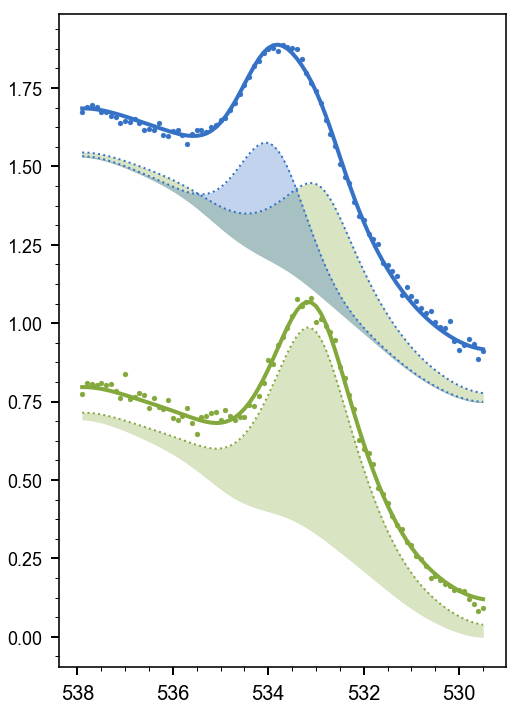

In [126]:
off = 0.4
off2 = 0
plt.figure(figsize=(8, 12))
colorsfill = [['g', 'b'], ['g', 'b'], ['g', 'r']]

for i, xp in enumerate(selo[:2]):
    Fn = XPFit(xp, 'O_1s')
    if i == 1:
        Fn.preset_pars('v1_center', 532.9)
        Fn.preset_pars('v1_sigma', 1.04)
        Fn.double_pvoigt(sepPt=533.3)
        off = 4.5
        off2 = 3.8
    else:
        Fn.pvoigt()

    plot_fit_result(xp, 'O_1s', plot_comps=True, flag_fill=True,
                    plot_bg=True, offset = off, off2 = off2, colf=colorsfill[i])
ax = plt.gca()
ax.invert_xaxis()
# ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/fig_fit_c).png',
#             dpi=600, transparent=True)

TypeError: 'NoneType' object is not subscriptable

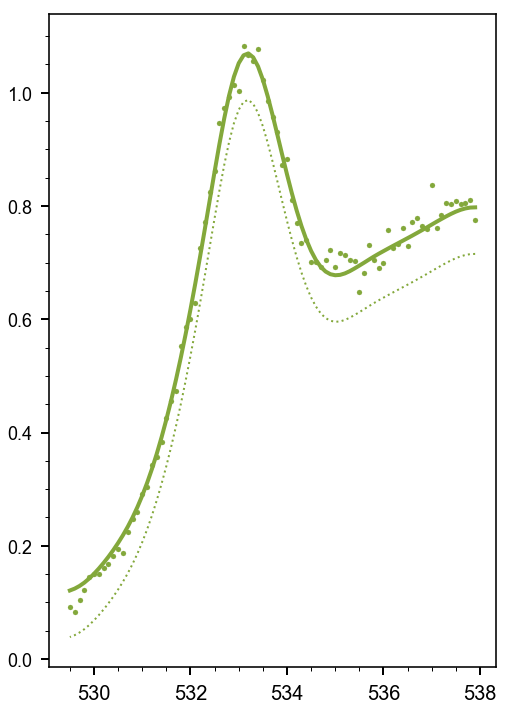

In [218]:
off = 0.4
off2 = 0
plt.figure(figsize=(8, 12))
for i, xp in enumerate(selo[:2]):
    Fn = XPFit(xp, 'O_1s')
    if i == 1:
        Fn.preset_pars('v1_center', 532.9)
        Fn.preset_pars('v1_sigma', 1.04)
        Fn.double_pvoigt(sepPt=533.3)
        off = 4.5
        off2 = 3.8
    else:
        Fn.pvoigt()

    plot_fit_result(xp, 'O_1s', plot_comps=True, flag_fill=True,
                    plot_bg=True, offset = off, off2 = off2)
ax = plt.gca()
ax.invert_xaxis()
# ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/fig_fit_c).png',
#             dpi=600, transparent=True)

In [215]:
selo[0].fit['O_1s']

In [340]:
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Helvetica Neue', 'Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']
plt.rcParams['font.sans-serif'] = ['Helvetica Neue','Helvetica', 'Arial', 'DejaVu Sans', 'Liberation Sans', 'sans-serif']


Modify user pars
Modify user pars


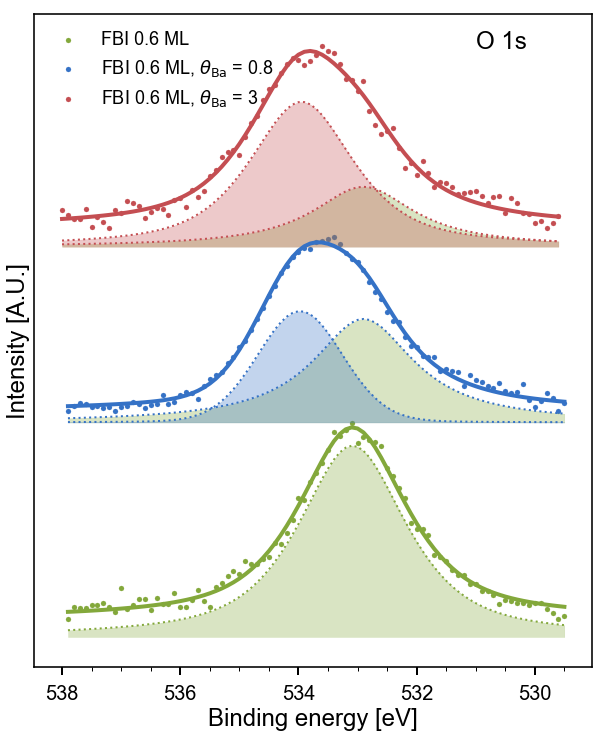

In [230]:
off = [0.4, 4, 6.5]
off2 = [0.1, 3.8, 6.2]
refau_sub2[3].color = 'r'
plt.figure(figsize=(10, 12))
colorsfill = [['g', 'b'], ['g', 'b'], ['g', 'r']]
labels = ['FBI 0.6 ML', 'FBI 0.6 ML, $\\theta_{\mathrm{Ba}}$ = 0.8', 'FBI 0.6 ML, $\\theta_{\mathrm{Ba}}$ = 3' ]
for i, xp in enumerate(refau_sub2[1:]):
    Fn = XPFit(xp, 'O_1s')
    if i >= 1:
        Fn.preset_pars('v1_center', 532.9)
        Fn.preset_pars('v1_sigma', 1.04)
        Fn.double_pvoigt(sepPt=533.3)

    else:
        Fn.pvoigt()

    plot_fit_result(xp, 'O_1s', plot_comps=True, flag_fill=True, lb=labels[i],
                    offset = off[i], off2 = off2[i], colf=colorsfill[i])
ax = plt.gca()
plt.legend(fontsize=18, framealpha=0.)
plt.text(s='O 1s', x = 531, y = 2., fontsize = 24)
# ax.invert_xaxis()
ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/SI_O1s_dose3Ba.png',
            dpi=600, transparent=True)

In [165]:
off = [0.4, 4, 6.5]
off2 = [0.1, 3.8, 6.2]
refau_sub2[3].color = 'r'
plt.figure(figsize=(8, 12))
colorsfill = [['g', 'b'], ['g', 'b'], ['g', 'r']]
labels = ['FBI 0.6 ML', 'FBI 0.6 ML, $\\theta_{\mathrm{Ba}}$ = 0.8', 'FBI 0.6 ML, $\\theta_{\mathrm{Ba}}$ = 3' ]
for i, xp in enumerate(refau_sub2[1:]):
    Fn = XPFit(xp, 'O_1s')
    if i >= 1:
        Fn.preset_pars('v1_center', 532.9)
        Fn.preset_pars('v1_sigma', 1.04)
        Fn.double_pvoigt(sepPt=533.3)

    else:
        Fn.pvoigt()

    plot_fit_result(xp, 'O_1s', plot_comps=True, flag_fill=True, lb=labels[i],
                    offset = off[i], off2 = off2[i], colf=colorsfill[i])
ax = plt.gca()
plt.legend()
plt.text(s='O 1s', x = 531, y = 2., fontsize = 24)
# ax.invert_xaxis()
ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/SI_O1s_dose3Ba.png',
#             dpi=600, transparent=True)

NameError: name 'refau_sub2' is not defined

In [60]:
refau_sub2[1].fit['O_1s'].params['p1_center']

<Parameter 'p1_center', value=533.0675352482667 +/- 0.0115, bounds=[-inf:inf]>

In [61]:
refau_sub2[1].fit['O_1s'].params['p1_fwhm']

<Parameter 'p1_fwhm', value=2.1422705923362013 +/- 0.0417, bounds=[-inf:inf], expr='2.0000000*p1_sigma'>

In [53]:
refau_sub2[2].fit['O_1s'].params['v2_center']

<Parameter 'v2_center', value=533.9471106882586 +/- 0.0239, bounds=[-inf:inf]>

In [62]:
refau_sub2[2].fit['O_1s'].params['v2_fwhm']

<Parameter 'v2_fwhm', value=1.6850430254624786 +/- 0.0497, bounds=[-inf:inf], expr='2.0000000*v2_sigma'>

In [78]:
refau_sub2[3].fit['O_1s'].params['v2_center']

<Parameter 'v2_center', value=533.9082345922864 +/- 0.0527, bounds=[-inf:inf]>

In [64]:
refau_sub2[3].fit['O_1s'].params['v2_fwhm']

<Parameter 'v2_fwhm', value=2.1074701263553752 +/- 0.124, bounds=[-inf:inf], expr='2.0000000*v2_sigma'>

In [424]:
selo[0].fit['O_1s'].params['v1_center']

<Parameter 'v1_center', value=532.949322922286 +/- 0.0149, bounds=[-inf:inf]>

In [426]:
selo[1].fit['O_1s'].params['v2_center']

<Parameter 'v2_center', value=533.9092615628956 +/- 0.0249, bounds=[-inf:inf]>

In [457]:
selo[0].fit['O_1s'].params['v1_fwhm']

<Parameter 'v1_fwhm', value=2.1623341356017374 +/- 0.0408, bounds=[-inf:inf], expr='2.0000000*v1_sigma'>

In [459]:
selo[1].fit['O_1s'].params['v2_fwhm']

<Parameter 'v2_fwhm', value=1.405641284755664 +/- 0.0533, bounds=[-inf:inf], expr='2.0000000*v2_sigma'>

(0.05080803573645687,
 0.0006272597004500848,
 0.023275913638445753,
 0.00029463181820817407)

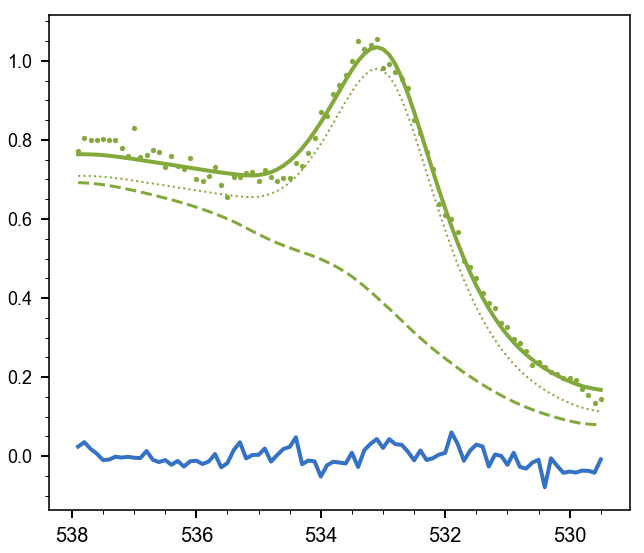

In [27]:

plt.plot(selo[0].dfx['O_1s'].energy.dropna()[::-1], selo[0].fit['O_1s'].residual, label='Residual: $y_{data} - y_{fit}$')
plot_fit_result(selo[0], region, plot_bg=True)
selo[0].fit['O_1s'].chisqr, selo[0].fit['O_1s'].redchi, selo[1].fit['O_1s'].chisqr, selo[1].fit['O_1s'].redchi

In [428]:
selo[1].fit['O_1s'].params['v1_fraction']

<Parameter 'v1_fraction', value=0.9999999972107989 +/- 0.0179, bounds=[0.0:1.0]>

In [427]:
selo[1].fit['O_1s'].params['v2_fraction']

<Parameter 'v2_fraction', value=2.169735624502067e-08 +/- 0.153, bounds=[0.0:1.0]>

In [445]:
selo[0].fit['O_1s'].chisqr

0.08121685233272652

Modify user pars


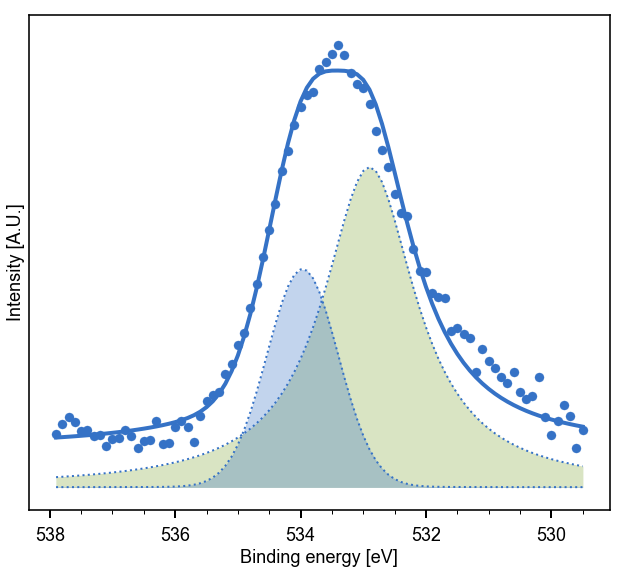

In [386]:
Fn = XPFit(selo[1], 'O_1s')
Fn.preset_pars('v1_center', 532.9)
Fn.preset_pars('v1_sigma', 0.9)
# Fn.preset_pars('v2_sigma', 0.9)

Fn.double_voigt(sepPt=533.3)
plot_fit_result(selo[1], 'O_1s', plot_comps=True, plot_bg=False,
                offset=0.3, flag_fill=True)
ax = plt.gca()

ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/fig_fit_b).png',
            dpi=600, transparent=True)

Modify user pars


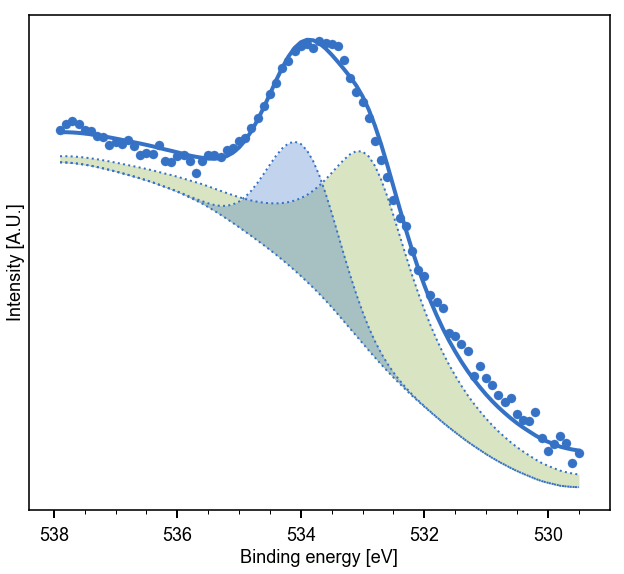

In [385]:
Fn = XPFit(selo[1], 'O_1s')
Fn.preset_pars('v1_center', 532.9)
Fn.preset_pars('v1_sigma', 0.9)
# Fn.preset_pars('v2_sigma', 1.04)

Fn.double_voigt(sepPt=533.3)
plot_fit_result(selo[1], 'O_1s', plot_comps=True, 
                plot_bg=True, offset=0.3, flag_fill=True)
ax = plt.gca()

ax.set(yticks=[], xlabel='Binding energy [eV]', ylabel='Intensity [A.U.]')
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/fig_fit_a).png',
#             dpi=600, transparent=True)

In [99]:
bg2[4].color = 'r'

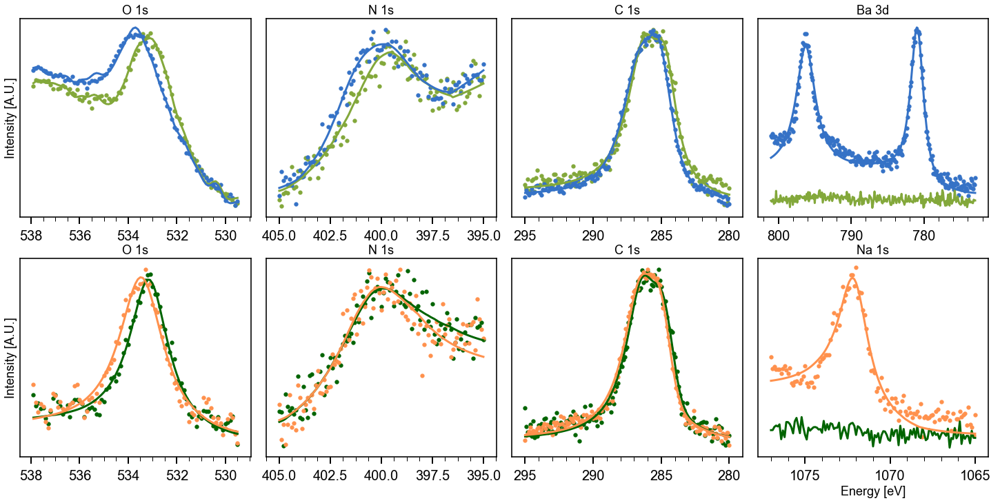

In [260]:
regs = ['N_1s', 'C_1s']
off = [800, 800, 400]
plt.rc('xtick', labelsize= 20)
plt.rc('font', size= 20)

fig, ax = plt.subplots(2, 4, figsize=(20, 10))
selo = [refau_sub2[1], refau_sub2[2], refau_sub1[1], refau_sub1[2]]
for i, xp in enumerate(selo[:2]):
    plot_fit_result(xp, 'O_1s', ax=ax[0,0], plot_bg=True, plot_comps=False)
    ax[0,0].set(yticks=[], ylabel=None, xlabel=None)
    ax[0,0].set(ylabel='Intensity [A.U.]')
ax[0,0].set(title='O 1s')
ax[0,0].invert_xaxis()

for i, xp in enumerate(selo[2:4]):
    plot_fit_result(xp, 'O_1s', ax=ax[1,0], plot_bg=True, plot_comps=False)
    ax[1,0].set(yticks=[], ylabel=None, xlabel=None)
    ax[1,0].set(ylabel='Intensity [A.U.]')
ax[1,0].set(title='O 1s')
ax[1,0].invert_xaxis()

for j, r in enumerate(regs, start=1):
    for i, xp in enumerate(bg2[:2]):
        plot_fit_result(xp, r, ax=ax[0,j], plot_bg=True, plot_comps=False)
        
    ax[0,j].set(yticks=[], ylabel=None, xlabel=None)
    ax[0,j].set(title=r.replace('_', ' '))

    for i, xp in enumerate(bg2[2:4], start=2):
        plot_fit_result(xp, r, ax=ax[1,j], plot_bg=True, plot_comps=False)
    ax[1,j].set(yticks=[], ylabel=None, xlabel=None)
    ax[1,j].set(title=r.replace('_', ' '))
    ax[0,j].invert_xaxis()
    ax[1,j].invert_xaxis()
plot_region(bg2[0], 'Ba_3d', ax=ax[0,3])
plot_fit_result(bg2[1], 'Ba_3d', ax=ax[0,3], plot_bg=True, plot_comps=False)
ax[0,3].set(title='Ba 3d')

plot_region(bg2[2], 'Na_1s', ax=ax[1,3])
plot_fit_result(bg2[3], 'Na_1s', ax=ax[1,3], plot_bg=True, plot_comps=False)
ax[1,3].set(title='Na 1s')

ax[0,3].set(yticks=[], )
ax[1,3].set(yticks=[], ylabel=None)
ax[1,3].get_legend().remove()

# ax[0,3].invert_xaxis()
# ax[1,3].invert_xaxis()

plt.tight_layout(w_pad=0.1, h_pad=0.1, pad=0.1)
# plt.savefig('/Users/pabloherrero/Dropbox/phd/talks/RIVA21/BaNa1.png',
#             dpi=600, transparent=True)

In [169]:
ax[2,0].get_xlim()

(538.4753895023188, 528.9246104976812)

## O 1s curves Progba

In [103]:
plt.rcParams['lines.markersize'] = 6

In [138]:
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)
plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18
plt.rcParams["xtick.major.size"] = 10
plt.rcParams["ytick.major.size"] = 10
plt.rcParams["xtick.minor.size"] = 6
plt.rcParams["ytick.minor.size"] = 6
plt.rcParams["xtick.major.width"] = 2

plt.rcParams["xtick.minor.width"] = 1
plt.rcParams["ytick.minor.width"] = 1
plt.rcParams["ytick.minor.visible"] = True
plt.rcParams["xtick.minor.visible"] = True



In [151]:
def scatter_region(xp : XPS_experiment, region : str, col: str = None, lb : str = None, ax = None, offset: float = 0.):
    """Quick region plotter"""
    if lb == None: lb = xp.name
    if ax == None: ax = plt.gca()
#     offset *= np.average(xp.dfx[region].dropna().counts.values)
    p1 = ax.plot(xp.dfx[region].energy, xp.dfx[region].counts + offset, 'o', label=lb)

    if col != None:
        p1[0].set(color=col)
    elif xp.color :
        p1[0].set(color=xp.color)

    if xp.ls:
        p1[0].set(linestyle=xp.ls)

    cosmetics_plot()
    return p1[0]


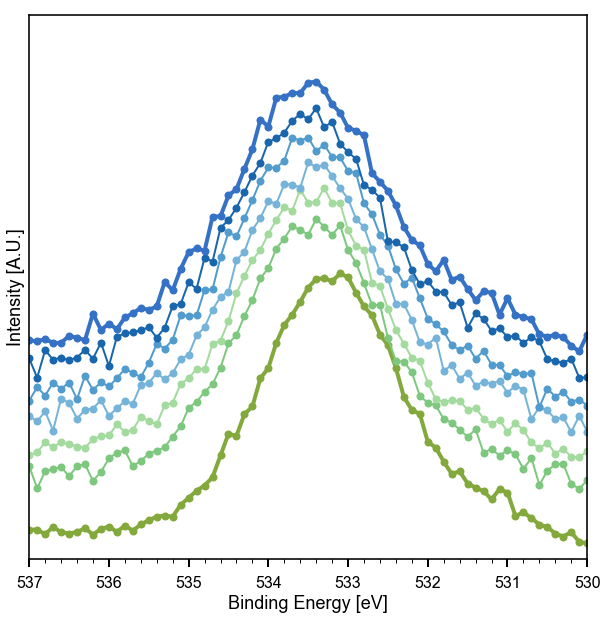

In [250]:
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['lines.markersize'] = 8
region = 'O_1s'

plt.figure(figsize=(10,10))
cmap = plt.cm.Blues
cmapg = plt.cm.Greens

norm = Normalize(vmin=-15, vmax=80)
blues = [10, 20, 30, 40, 60, 80]

scatter_region(refau_sub[1], region, col='g', offset=-0.01)
plot_region(refau_sub[1], region, col='g', offset=-0.01, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 2

for i,xp in enumerate(refau_sub[2:-1]):
    if i < 2: col = cmapg(norm(blues[-(i-2)]))
    else: col = cmap(norm(blues[i]))
    scatter_region(xp, region, col=col, offset=0.005*i)
    plot_region(xp, region, col=col, offset=0.005*i, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 4
scatter_region(refau_sub[-1], region, col='b', offset=0.005*(i+1))
plot_region(refau_sub[-1], region, col='b', offset=0.005*(i+1), lb='__nolabel__')#'$\\Phi$ = %.2f'%fbibaratio[i])
i = 0
ax = plt.gca()
ax.get_legend().remove()
ax.set(yticks=[], xlim=(537, 530), ylim=(-0.015, 0.08) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
ax.set_xticks(range(530, 538));
ax.set_xticks(np.arange(530, 537, 0.2), minor=True);

# plt.savefig('/Users/pabloherrero/Dropbox/phd/talks/Neutrino2022/xpsO1s_'+str(i)+'.png',
#             dpi=400, transparent=False)

## Barium curves

### BaCl2 / bare Au

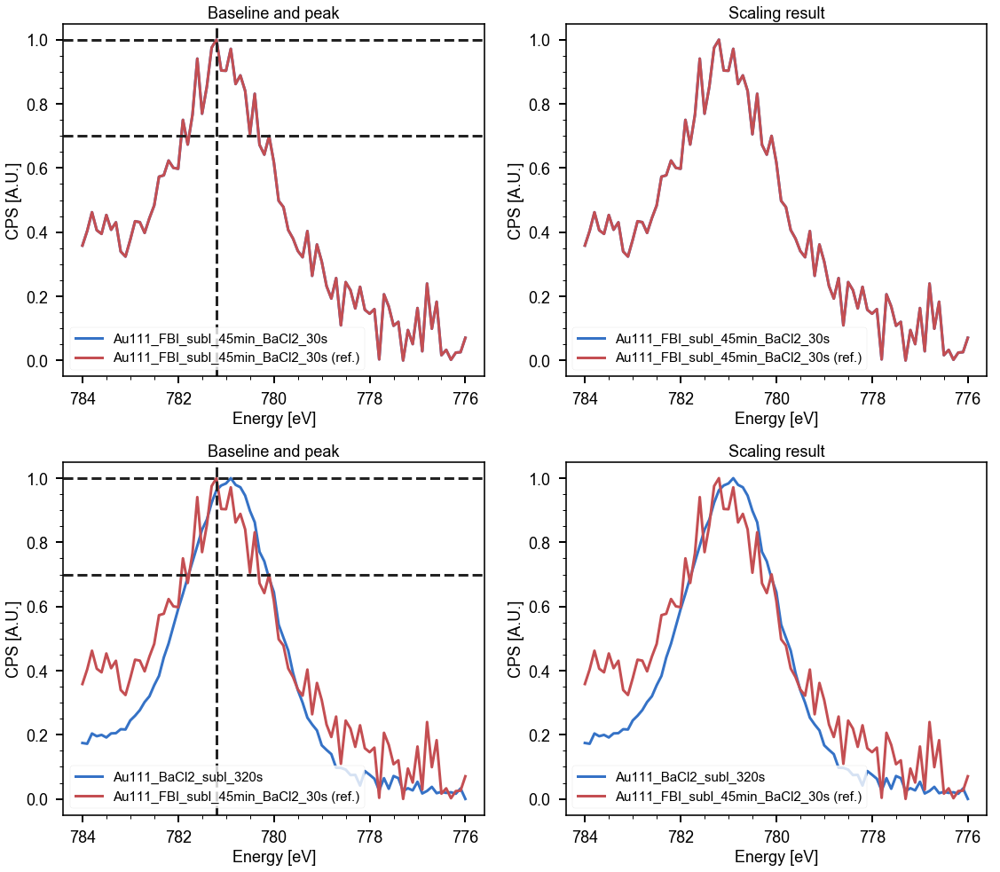

In [20]:
fbaau = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/20210525_Au111_BaCl2_subl_320s.xy'
baau = normalise_dfx(xps_data_import(fbaau, ))
# baau = gaussian_smooth(baau, 'Ba_3d', sigma=4)
_, baau = scale_and_plot_spectra([refau_sub[4], baau], region='Ba_3d')

### Figure 2d

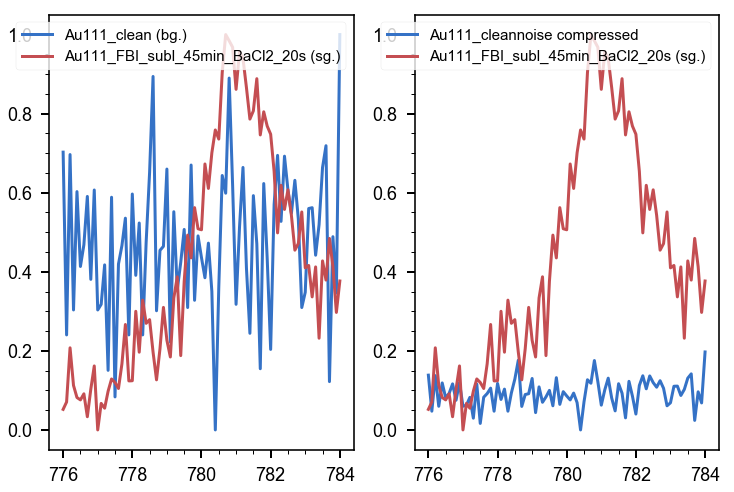

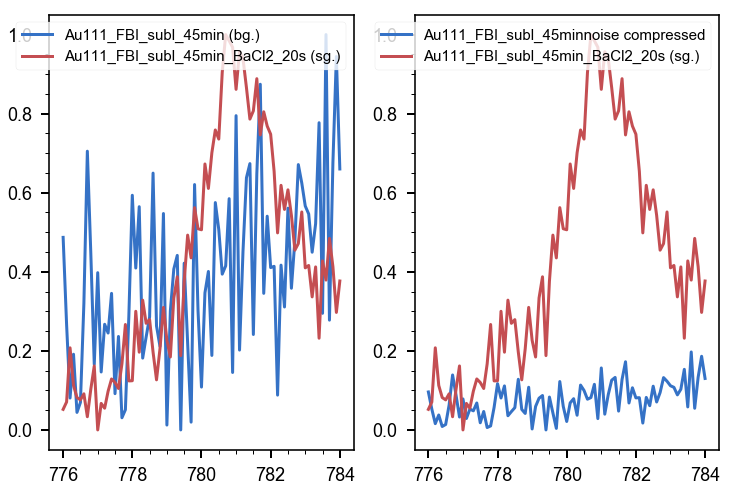

In [21]:
sm0 = compress_noisy_region(refau_sub[0], refau_sub[3], 'Ba_3d' )
sm1 = compress_noisy_region(refau_sub[1], refau_sub[3], 'Ba_3d' )

In [104]:
smoothed = [baau, sm1]
# smoothed.append(gaussian_smooth(sm1, region='Ba_3d', sigma=4, ))

for xp in refau_sub[2:]:
#     sm = gaussian_smooth(xp, region='Ba_3d', sigma=2, )
    smoothed.append(xp)

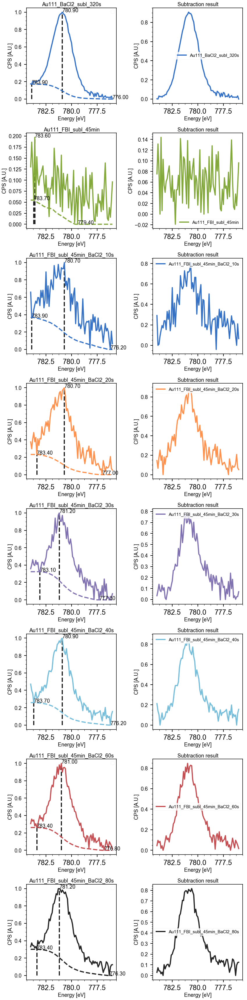

In [105]:
region = 'Ba_3d'
smoothed = region_bg_subtract(smoothed, region)

In [24]:
plt.rc('xtick', labelsize= 24)


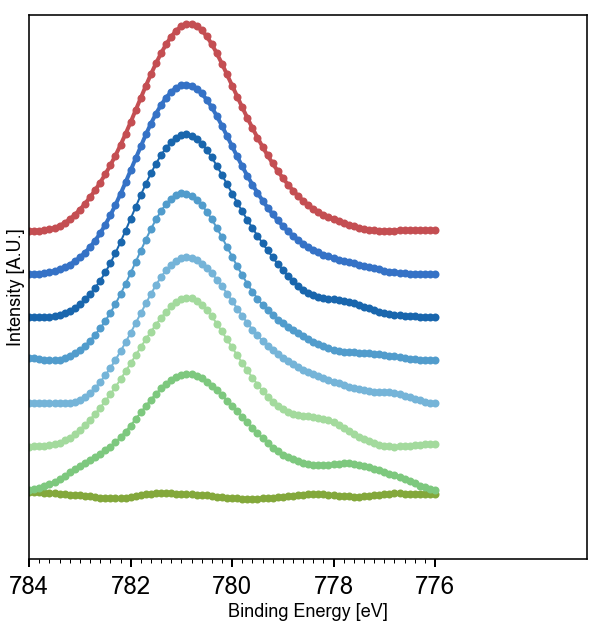

In [311]:
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['lines.markersize'] = 8

plt.figure(figsize=(10,10))
region = 'Ba_3d'
cmap = plt.cm.Blues
cmapg = plt.cm.Greens

norm = Normalize(vmin=-15, vmax=80)
blues = [10, 20, 30, 40, 60, 80]

scatter_region(smoothed[1], region, col='g', offset=-0.01)
plot_region(smoothed[1], region, col='g', offset=-0.01, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 2

for i,xp in enumerate(smoothed[2:-1]):
    if i < 2: col = cmapg(norm(blues[-(i-2)]))
    else: col = cmap(norm(blues[i]))
    scatter_region(xp, region, col=col, offset=0.05*i)
    plot_region(xp, region, col=col, offset=0.05*i, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 4
scatter_region(smoothed[-1], region, col='b', offset=0.05*(i+1))
plot_region(smoothed[-1], region, col='b', offset=0.05*(i+1), lb='__nolabel__')#'$\\Phi$ = %.2f'%fbibaratio[i])

scatter_region(smoothed[0], region, col='r', offset=0.05*(i+2))
plot_region(smoothed[0], region, col='r', offset=0.05*(i+2), lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])

ax = plt.gca()
ax.get_legend().remove()
ax.set(yticks=[], ylim = (-0.08, 0.55), xlim=(784, 773) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
ax.set(xticks=range(776, 786, 2));
ax.set_xticks(np.arange(776, 784, 0.2), minor=True);

plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/xpsBa3d.png',
            dpi=400, transparent=True)

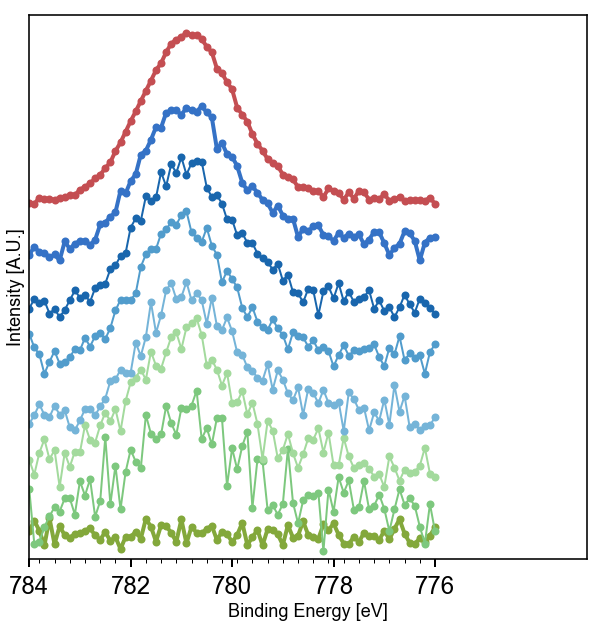

In [113]:
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['lines.markersize'] = 8

plt.figure(figsize=(10,10))
region = 'Ba_3d'
cmap = plt.cm.Blues
cmapg = plt.cm.Greens

norm = Normalize(vmin=-15, vmax=80)
blues = [10, 20, 30, 40, 60, 80]

scatter_region(smoothed[1], region, col='g', offset=-0.01)
plot_region(smoothed[1], region, col='g', offset=-0.01, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 2

for i,xp in enumerate(smoothed[2:-1]):
    if i < 2: 
        col = cmapg(norm(blues[-(i-2)]))
        off = 0.3*i
    else: col = cmap(norm(blues[i])); off = 0.3*i
    scatter_region(xp, region, col=col, offset=off)
    plot_region(xp, region, col=col, offset=off, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 4
scatter_region(smoothed[-1], region, col='b', offset=0.3*(i+1))
plot_region(smoothed[-1], region, col='b', offset=0.3*(i+1), lb='__nolabel__')#'$\\Phi$ = %.2f'%fbibaratio[i])

scatter_region(smoothed[0], region, col='r', offset=0.3*(i+2))
plot_region(smoothed[0], region, col='r', offset=0.3*(i+2), lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])

ax = plt.gca()
ax.get_legend().remove()
ax.set(yticks=[], ylim = (-0.08, 2.8), xlim=(784, 773) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
ax.set(xticks=range(776, 786, 2));
ax.set_xticks(np.arange(776, 784, 0.3), minor=True);

plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/xpsBa3d.png',
            dpi=400, transparent=True)

### Fits Ba

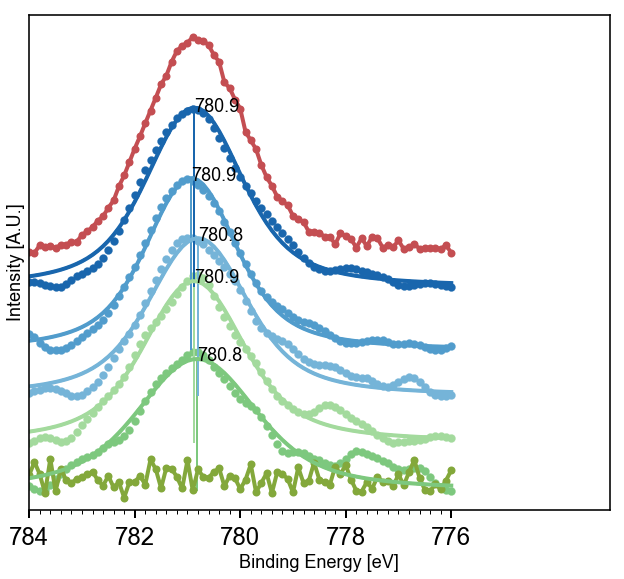

In [103]:
scatter_region(smoothed[1], region, col='g', offset=-0.01)
plot_region(smoothed[1], region, col='g', offset=-0.01, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
for i,xp in enumerate(smoothed[2:-1]):
    if (i < 2): col = cmapg(norm(blues[-(i-2)]))
    elif (i >= 2): col = cmap(norm(blues[i]))
    if i == 6: col = 'b'
#     scatter_region(xp, region, col=col, offset=0.2*i)
    fn = XPFit(xp, region)
    fn.voigt()
    plot_fit_result(xp, region, col=col, offset=0.9*i, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])

scatter_region(smoothed[0], region, col='r', offset=0.2*(i+1))
plot_region(smoothed[0], region, col='r', offset=0.2*(i+1), lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])

ax = plt.gca()
ax.get_legend().remove()
ax.set(yticks=[], ylim = (-0.08, 2.), xlim=(784, 773) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
ax.set(xticks=range(776, 786, 2));
ax.set_xticks(np.arange(776, 784, 0.2), minor=True);


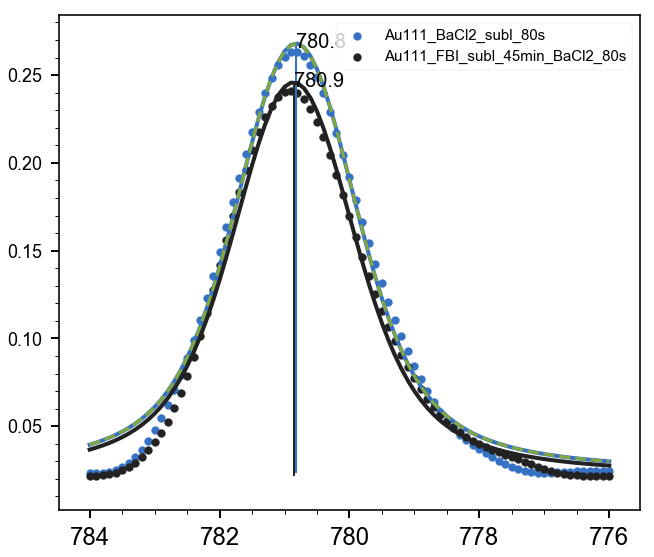

In [310]:
region = 'Ba_3d'
for i, xp in enumerate([smoothed[0], smoothed[-1]]):
    fn = XPFit(xp, region)
    fn.voigt()
    fn.plot()
plt.legend()
plt.gca().invert_xaxis()

### Ba/Cl plots and stoichiometry

#### Au

In [483]:
fbaau = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_25_Au111/20210525_Au111_BaCl2_subl_320s.xy'
baau = xps_data_import(fbaau, )

ffbaau = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_21_Au111/20210524_Au111_FBI_subl_45min_BaCl2_80s.xy'
fbaau = xps_data_import(ffbaau, )
fbaau = trim_spectra(fbaau, baau, 'Ba_3d')

flfbaau = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/20210510_Au111_FBI_subl_30min_BaCl2_60s.xy'
flbaau = xps_data_import(flfbaau, )
flbaau = trim_spectra(flbaau, baau, 'Ba_3d')

##### Preproc

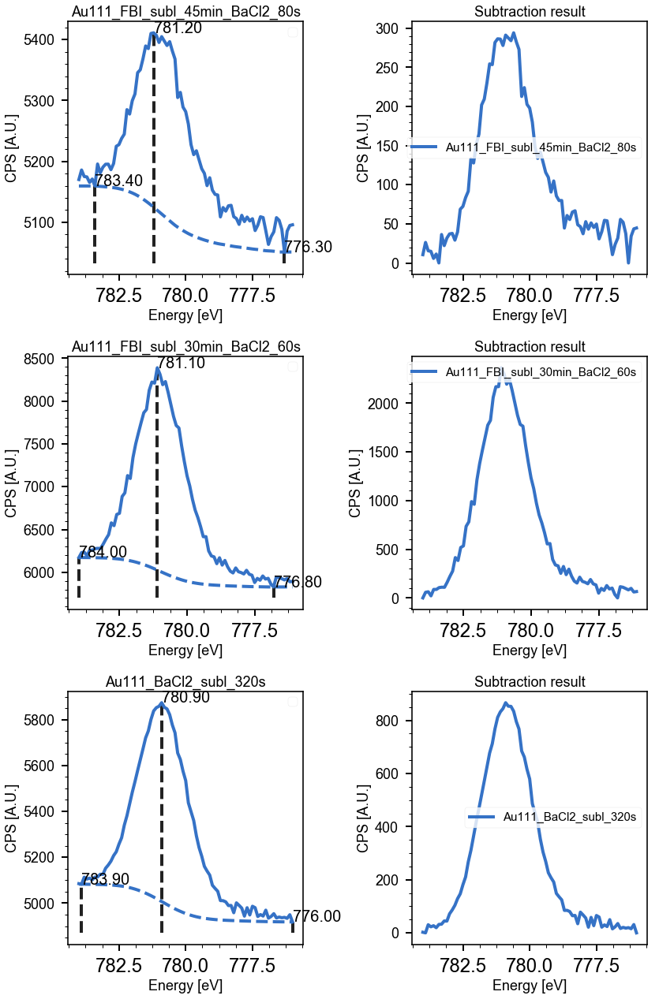

In [484]:
[fbaau, flbaau, baau] = region_bg_subtract([fbaau, flbaau, baau], 'Ba_3d')

Max iterations exceeded, subtract linear baseline


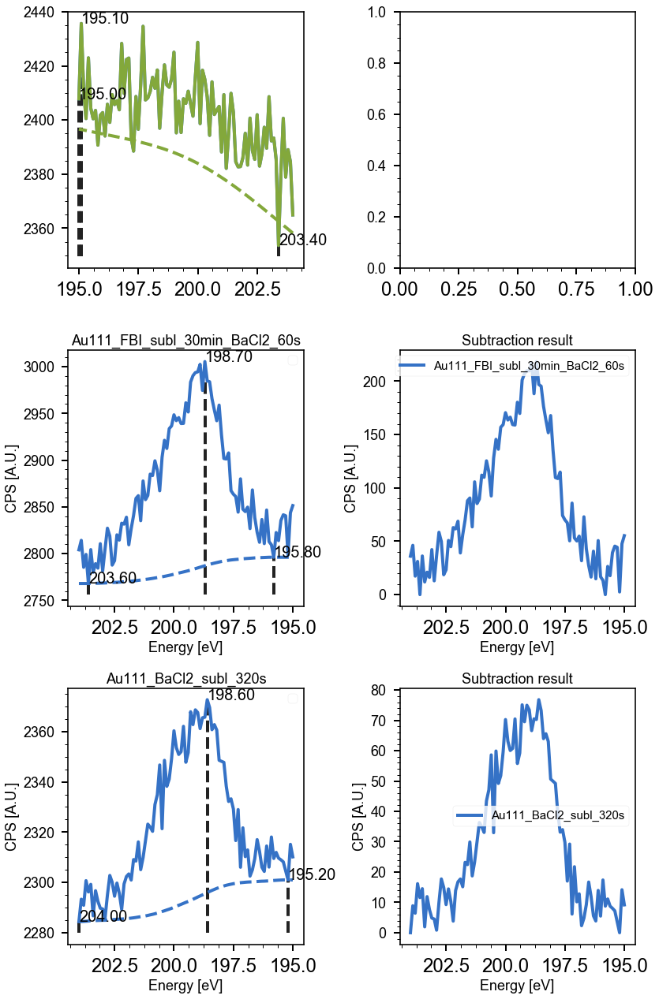

In [485]:
[fbaau, flbaau, baau] = region_bg_subtract([fbaau, flbaau, baau], 'Cl_2p')

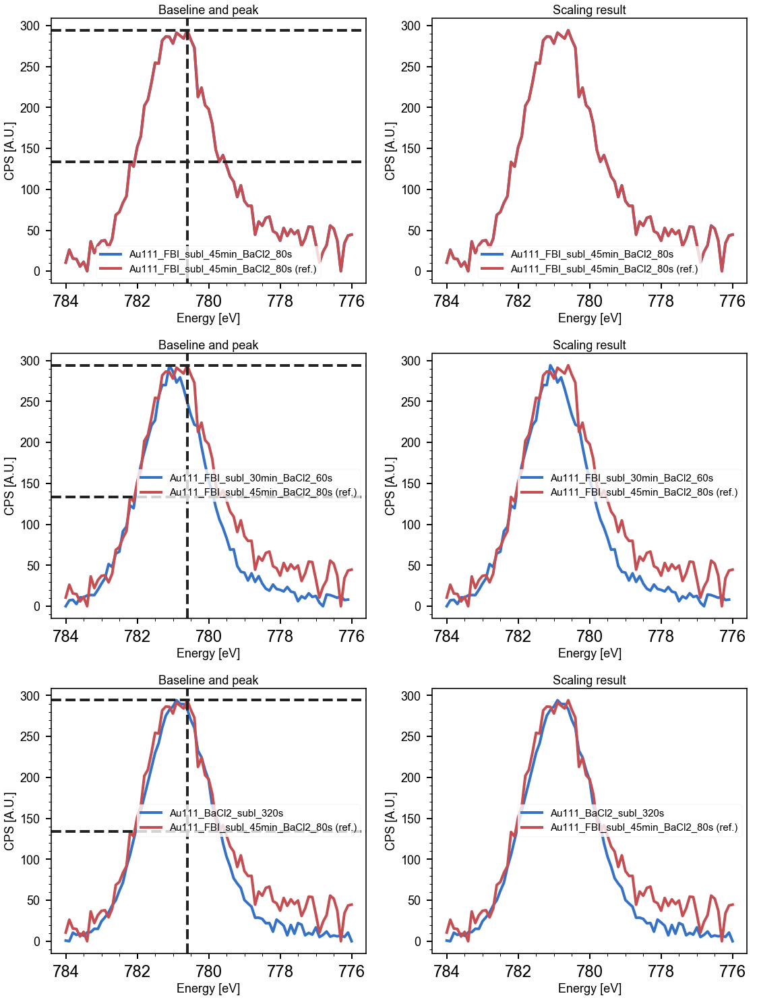

In [473]:
[sfbaau, sflbaau, sbaau] = scale_and_plot_spectra([fbaau, flbaau, baau], region='Ba_3d')

##### Plot scaled to Ba 3d

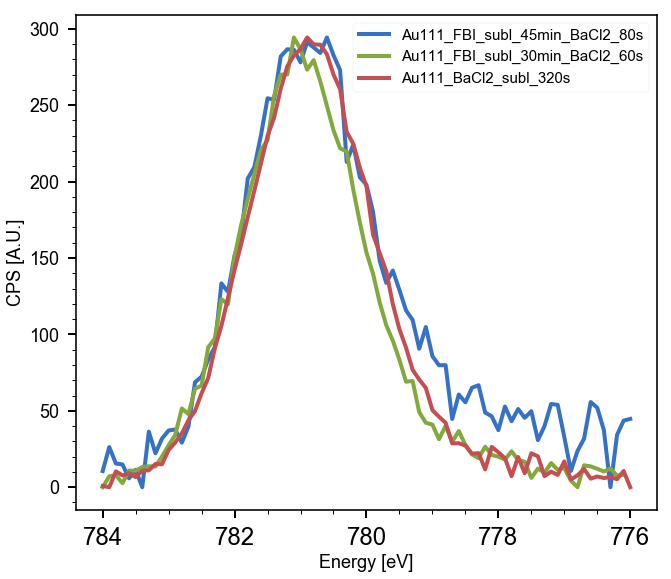

In [475]:
region = 'Ba_3d'
for xp in [sfbaau, sflbaau, sbaau]:
    plot_region(xp, region)

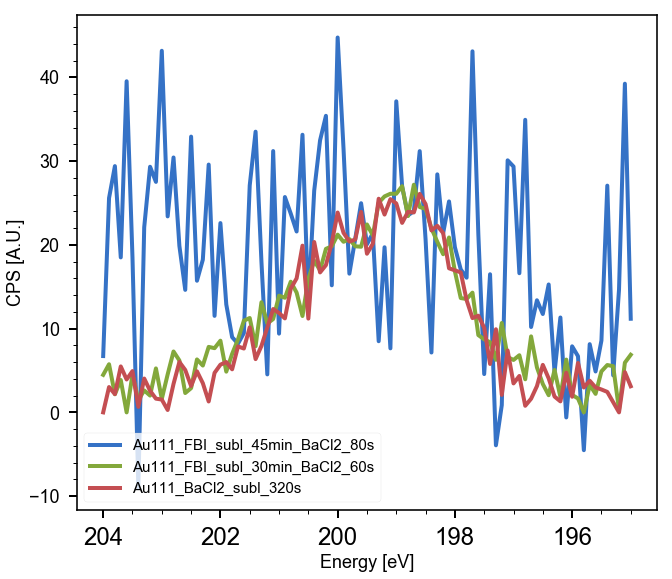

In [476]:
region = 'Cl_2p'
for xp in [sfbaau, sflbaau, sbaau]:
    plot_region(xp, region)

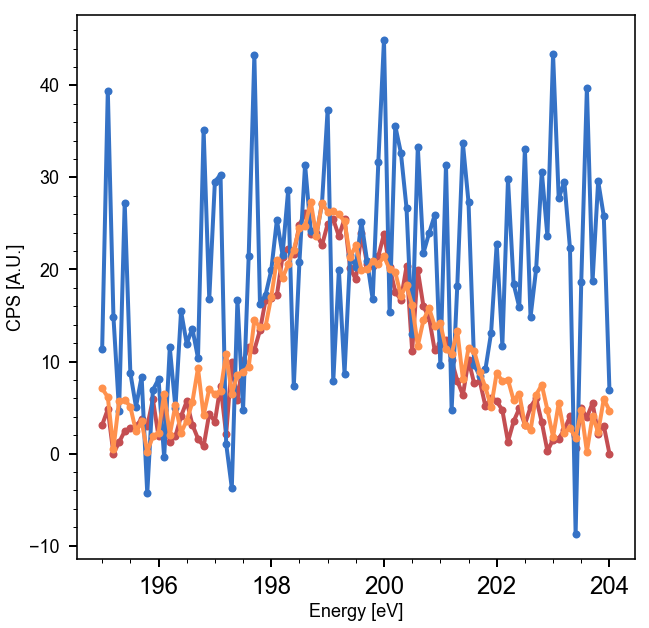

In [471]:
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['lines.markersize'] = 8

plt.figure(figsize=(10,10))
region = 'Cl_2p'
scatter_region(baau, region, col='r', offset=0.0*(i+2))
plot_region(baau, region, col='r', offset=0.0*(i+2), lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])

scatter_region(fbaau, region, col='b', offset=0.05*(i+1))
plot_region(fbaau, region, col='b', offset=0.05*(i+1), lb='__nolabel__')#'$\\Phi$ = %.2f'%fbibaratio[i])

scatter_region(flbaau, region, col='y', offset=0.05*(i+1))
plot_region(flbaau, region, col='y', offset=0.05*(i+1), lb='__nolabel__')#'$\\Phi$ = %.2f'%fbibaratio[i])
ax = plt.gca()
ax.get_legend().remove()
# ax.set(yticks=[], ylim = (-0.08, 0.45), xlim=(784, 776) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
# ax.set(xticks=range(776, 786, 2));
# ax.set_xticks(np.arange(776, 784, 0.2), minor=True);

# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/xpsBa3d.png',
#             dpi=400, transparent=True)

#####  Plot unscaled

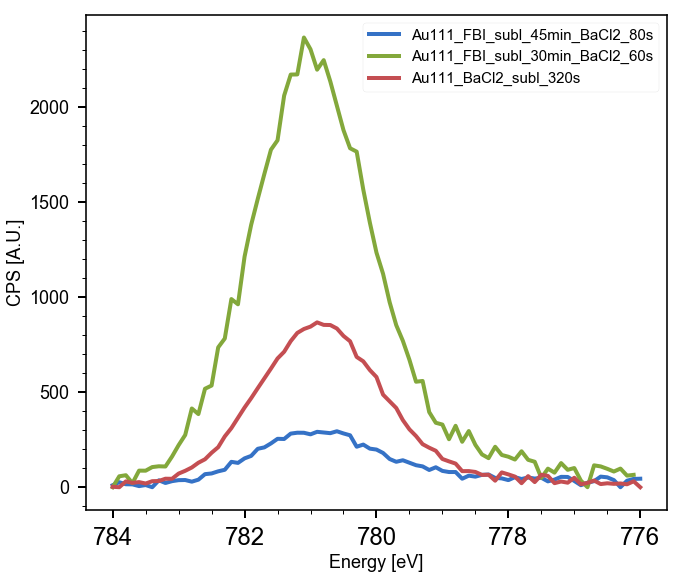

In [486]:
region = 'Ba_3d'
for xp in [fbaau, flbaau, baau]:
    plot_region(xp, region)

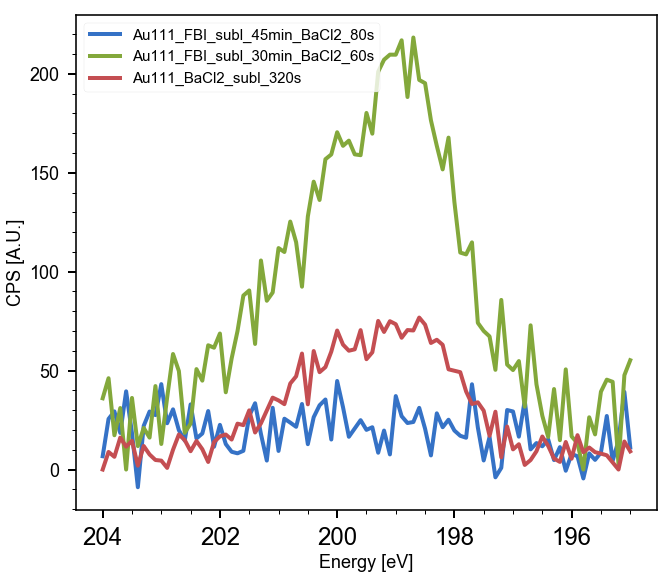

In [487]:
region = 'Cl_2p'
for xp in [fbaau, flbaau, baau]:
    plot_region(xp, region)

#### Cu

In [497]:
fbacu = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/Cu_BaCl2/20201026_Cu_BaCl2_subl_45min.xy'
bacu = xps_data_import(fbacu, )

ffbacu = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/20210203_13-Cu_FBI_subl_60min_BaCl2_8min.xy'
fbacu = xps_data_import(ffbacu, )
fbacu = trim_spectra(fbacu, bacu, 'Ba_3d')

##### Preproc

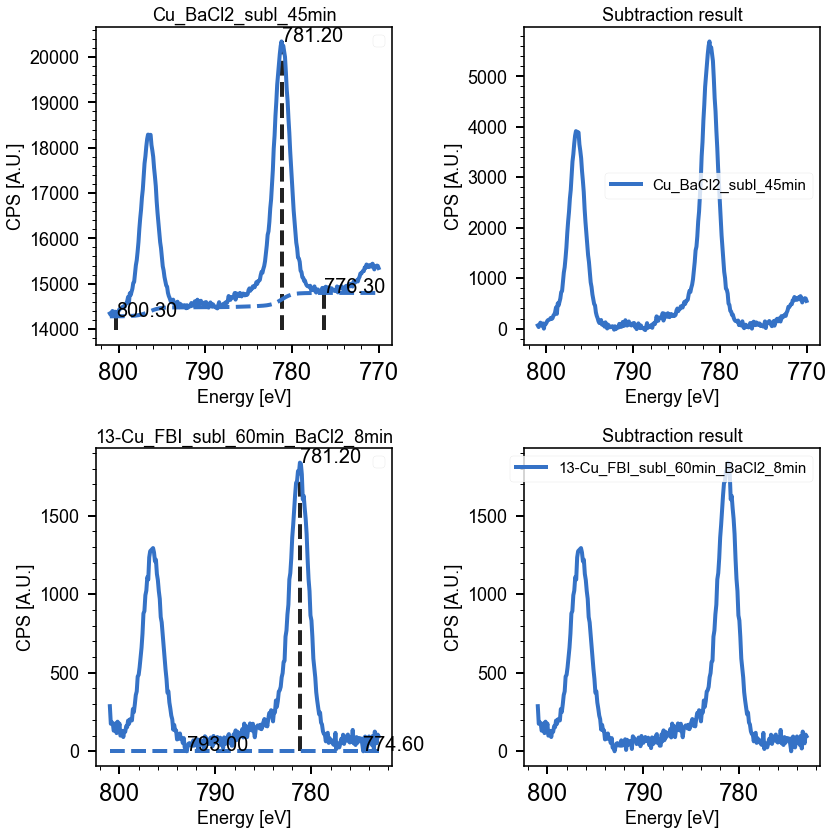

In [506]:
[bacu, fbacu] = region_bg_subtract([bacu, fbacu], 'Ba_3d')

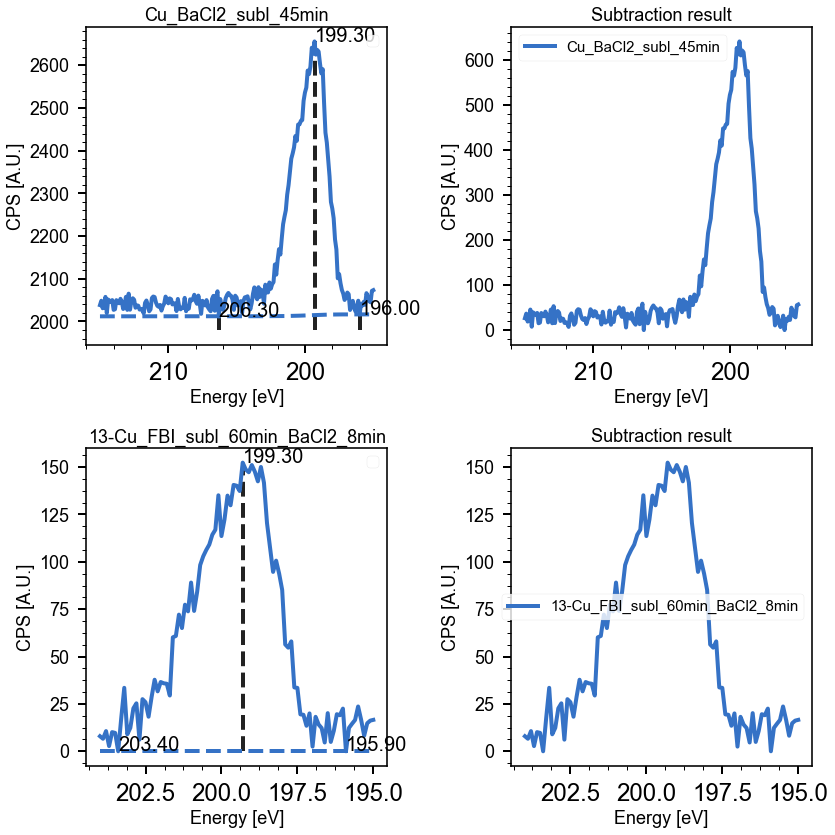

In [505]:
[bacu, fbacu] = region_bg_subtract([bacu, fbacu], 'Cl_2p')

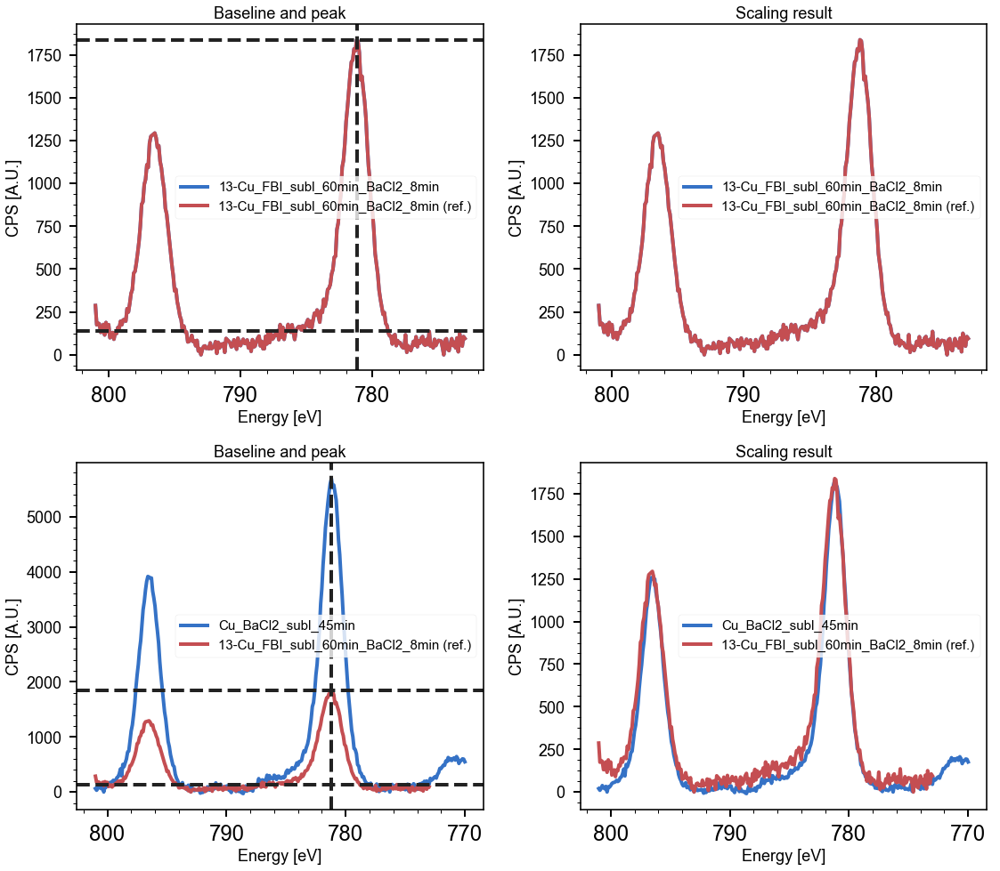

In [507]:
[sfbacu, sbacu] = scale_and_plot_spectra([fbacu, bacu], region='Ba_3d')

##### Plot scaled

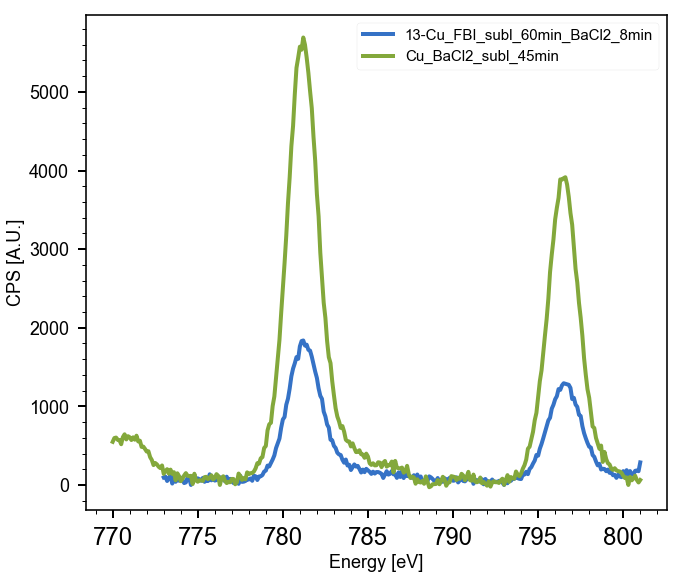

In [508]:
region = 'Ba_3d'
for xp in [fbacu, bacu]:
    plot_region(xp, region)

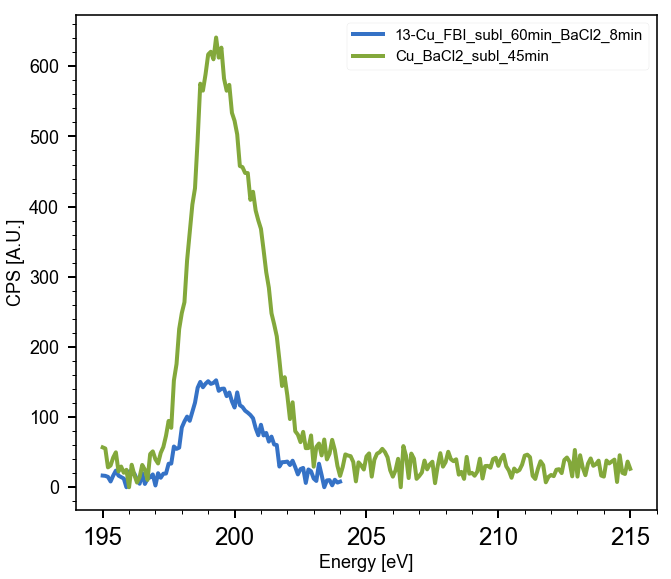

In [509]:
region = 'Cl_2p'
for xp in [fbacu, bacu]:
    plot_region(xp, region)

##### Plot scaled

In [526]:
sfbacu.name = 'FBI 0.9 ML + BaCl$_2$\n $\\theta$ = 1.3 / Cu (111)'
sfbacu.color = 'b'

sbacu.name = 'BaCl$_2$ / Cu (111)'
sbacu.color = 'r'

Text(778, 1750, 'Ba 3d')

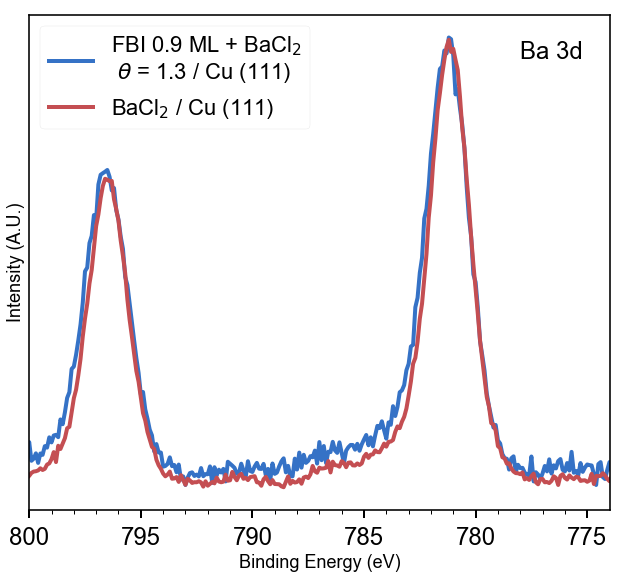

In [539]:
region = 'Ba_3d'
for xp in [sfbacu, sbacu]:
    plot_region(xp, region)
ax = plt.gca()
ax.set(xlim=(800, 774), xlabel='Binding Energy (eV)',
      ylabel='Intensity (A.U.)', yticks = [])
plt.legend(fontsize = 22)
plt.text(s='Ba 3d', x = 778, y =1750, fontsize = 24)

Text(197, 200, 'Cl 2p')

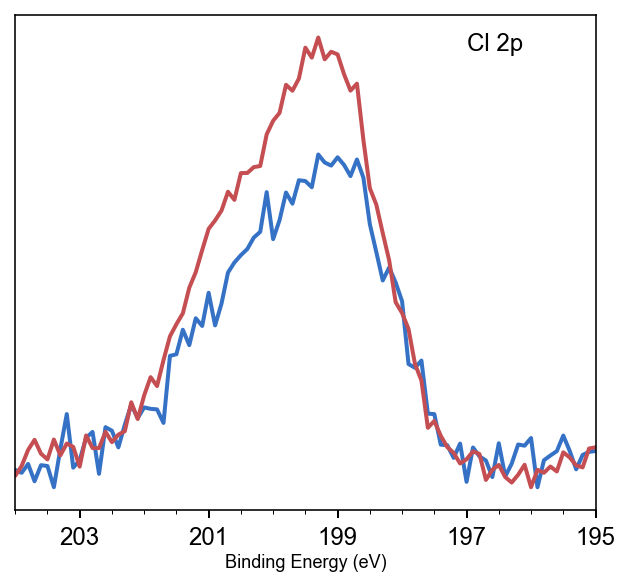

In [546]:
region = 'Cl_2p'
for xp in [sfbacu, sbacu]:
    plot_region(xp, region)
ax = plt.gca()
ax.set(xlim=(204, 195), xlabel='Binding Energy (eV)',
      ylabel='', yticks = [], xticks=range(195, 205, 2))
plt.legend().remove()
plt.text(s='Cl 2p', x = 197, y =200, fontsize = 24)

## C 1s curves

### Sample 2

Modify user pars
Modify user pars


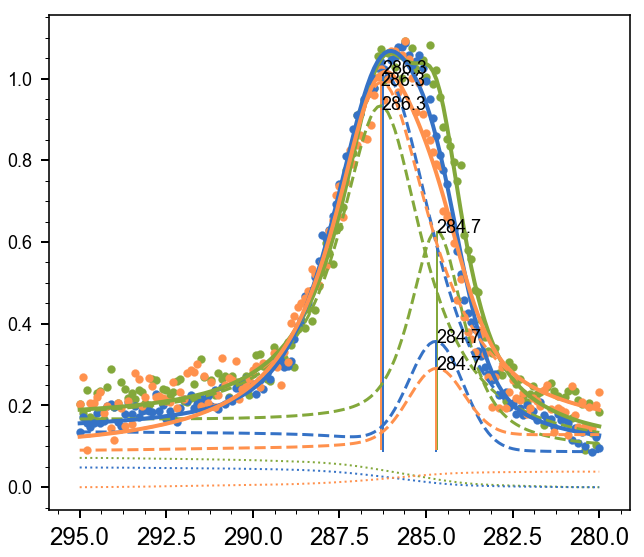

In [119]:
par_g = [0.2, 288, 0.93]
bounds_g = [(0.1, 0.25), (287, 289), (0.7, 1.2)]
for i, xp in enumerate(bg2[:2]+[bg2[4]]):
    Fn = XPFit(xp, 'C_1s')
    if i >= 1:
        Fn.preset_pars('v1_center', 284.7)
        Fn.preset_pars('v1_sigma', 0.93)
    fitv = Fn.double_pvoigt(sepPt=285)
#     if i>= 1: Fn.gauss_shoulder(fitv, par_g, bounds_g, Ng = 1)
    Fn.plot(plot_bg=True)

In [136]:
bg2[0].fit['C_1s'].best_values['v2_center'], bg2[1].fit['C_1s'].best_values['v2_center'],bg2[4].fit['C_1s'].best_values['v2_center']


(286.29542502612367, 286.12160600388484, 286.1954899585914)

In [121]:
bg2[4].color = 'r'

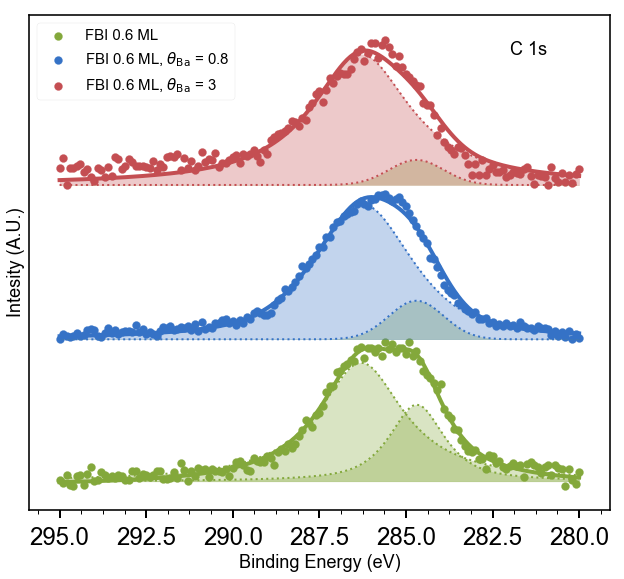

In [125]:
plot_fit_result(bg2[0], 'C_1s', plot_comps=True, offset = 0, off2 = 0.1, flag_fill=True, colf=['g', 'g'], lb='FBI 0.6 ML')
plot_fit_result(bg2[1], 'C_1s', plot_comps=True, offset = 3.4, off2 = 3.4, flag_fill=True, colf=['g', 'b', 'b'], lb='FBI 0.6 ML, $\\theta_{\mathrm{Ba}}$ = 0.8')
plot_fit_result(bg2[4], 'C_1s', plot_comps=True, offset = 6.7, off2 = 6.7, flag_fill=True, colf=['g', 'r', 'r'], lb='FBI 0.6 ML, $\\theta_{\mathrm{Ba}}$ = 3')
plt.gca().set(xlabel = 'Binding Energy (eV)', yticks = [], ylabel = 'Intesity (A.U.)')
plt.text(s = 'C 1s', x = 282, y =2.9)
plt.legend()
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/fitC1s_Au.png',
            dpi=400, transparent=True)

### Sample 3

[[],
 Text(0, 0.5, 'Intensity [A.U.]'),
 (295, 280),
 Text(0.5, 0, 'Binding Energy [eV]')]

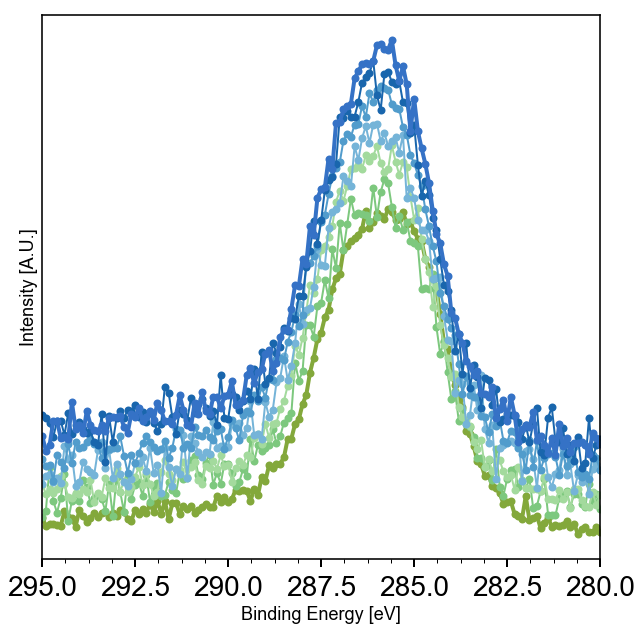

In [177]:
plt.rcParams['lines.linewidth'] = 4
plt.rcParams['lines.markersize'] = 8

plt.figure(figsize=(10,10))
region = 'C_1s'
cmap = plt.cm.Blues
cmapg = plt.cm.Greens

norm = Normalize(vmin=-15, vmax=80)
blues = [10, 20, 30, 40, 60, 80]

scatter_region(smoothed[1], region, col='g', offset=-0.01)
plot_region(smoothed[1], region, col='g', offset=-0.01, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 2

for i,xp in enumerate(smoothed[2:-1]):
    if i < 2: col = cmapg(norm(blues[-(i-2)]))
    else: col = cmap(norm(blues[i]))
    scatter_region(xp, region, col=col, offset=0.01*i)
    plot_region(xp, region, col=col, offset=0.01*i, lb='__nolabel__');#'$\\Phi$ = %.2f'%fbibaratio[i])
plt.rcParams['lines.linewidth'] = 4
scatter_region(smoothed[-1], region, col='b', offset=0.01*(i+1))
plot_region(smoothed[-1], region, col='b', offset=0.01*(i+1), lb='__nolabel__')#'$\\Phi$ = %.2f'%fbibaratio[i])

ax = plt.gca()
ax.get_legend().remove()
ax.set(yticks=[], xlim=(295, 280) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
# ax.set_xticks(range(530, 538));
# ax.set_xticks(np.arange(530, 537, 0.2), minor=True);

# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/fig2_xps_chelation/fig2_xps_chelation.b).png',
#             dpi=1000, transparent=True)

# Fe 2p experiment

In [240]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au_Mica/2021_10_01_FBI_Au_mica/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
files

g1fe = [read_processed_xp(f) for f in files]

colors = ['b', 'g', 'r']
for xp,c in zip(g1fe, colors):
    xp.color = c

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au_Mica/2021_10_01_FBI_Au_mica/proc/20211001_AuMica_Clean.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au_Mica/2021_10_01_FBI_Au_mica/proc/20211001_AuMica_FBI_subl_45min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au_Mica/2021_10_01_FBI_Au_mica/proc/20211001_AuMica_FBI_subl_45min_FeCl2_1ML.uxy.ft', returning empty fit dict


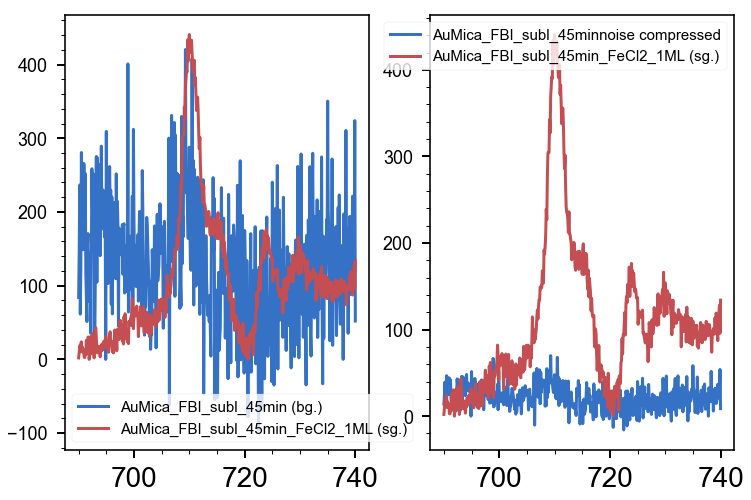

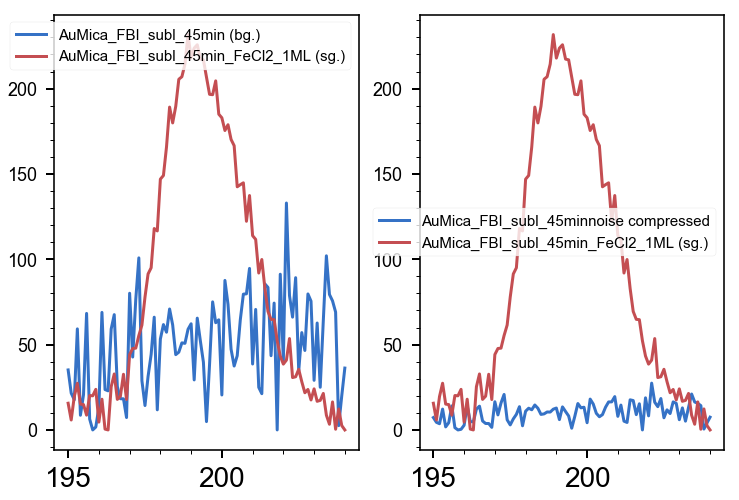

In [208]:
compress_noisy_region(g1fe[1], g1fe[2], 'Fe_2p', inplace=True);
compress_noisy_region(g1fe[1], g1fe[2], 'Cl_2p', inplace=True);

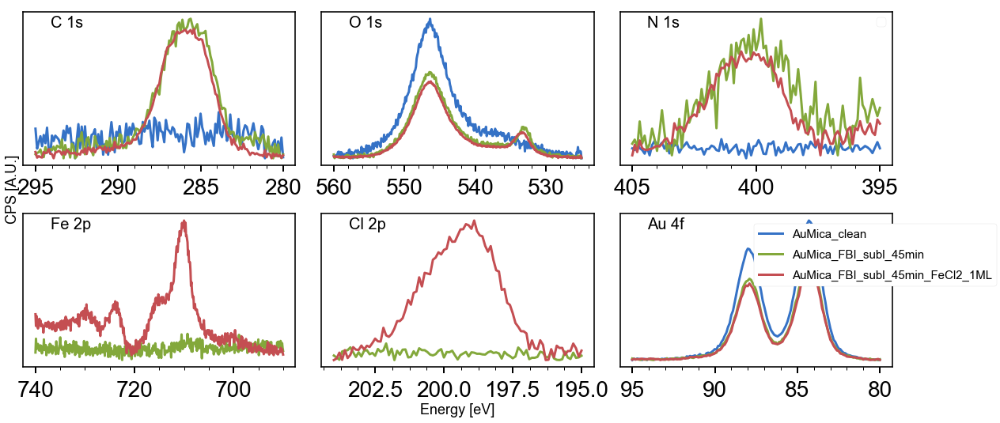

In [236]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Fe_2p', 'Cl_2p', 'Au_4f']

ax = plot_xp_regions(g1fe, regs)
ax[1][0].invert_xaxis()
ax[1][1].invert_xaxis()

## Subtract Au 4p

In [211]:
normfe = [normalise_dfx(xp) for xp in g1fe]

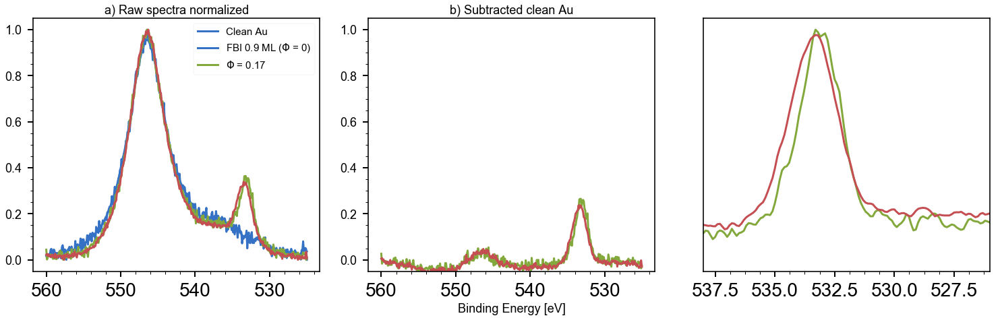

In [225]:
plt.rcParams['lines.linewidth'] = 3

region = 'O_1s'
# xp0 = normfe[0]
xp0 = gaussian_smooth(normfe[0], region, sigma=3)

fig, ax = plt.subplots(1, 3, figsize=(21, 7))
x = xp0.dfx[region].dropna().energy.values
y0 = xp0.dfx[region].dropna().counts.values
lb = ['Clean Au', 'FBI 0.9 ML ($\\Phi$ = 0)', '$\\Phi$ = 0.17']

plot_region(xp0, region, ax=ax[0])
sub_fe = []
for i,xp in enumerate(normfe):
    if i < 3:
        plot_region(xp, region, ax=ax[0])
    xpdif = subtract_ref_region(xp, xp0, region)
    if i > 0:
        x = xpdif.dfx[region].energy
        y = xpdif.dfx[region].counts
        if i < 3:
            plot_region(xpdif, region, ax=ax[1])
            
        plot_region(gaussian_smooth(xpdif, region, sigma=1), region, offset=0.02*i, ax=ax[2])
    crop_spectrum(xpdif, region, eup=537, edw=530, inplace=True)
    sub_fe.append(xpdif)
ax[0].legend(ax[0].get_lines(), lb)

tit = ['a) Raw spectra normalized', 'b) Subtracted clean Au', '']
for j,a in enumerate(ax):
    a.set_title(tit[j])
ax[0].invert_xaxis()
ax[1].invert_xaxis()
ax[1].set(ylim=ax[0].get_ylim(), xlabel='Binding Energy [eV]')

ax[2].set(yticks=[], xlim=(538, 526), ylabel=None, xlabel=None)
ax[2].get_legend().remove()
# ax[2].invert_xaxis()
plt.tight_layout()
# plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/si_ausub.a).png',
#             dpi=600)

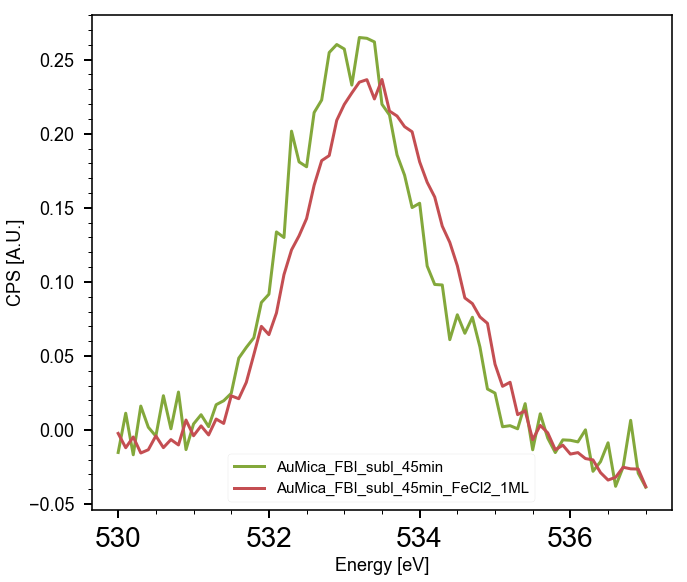

In [227]:
plot_region(sub_fe[1], region)
plot_region(sub_fe[2], region)

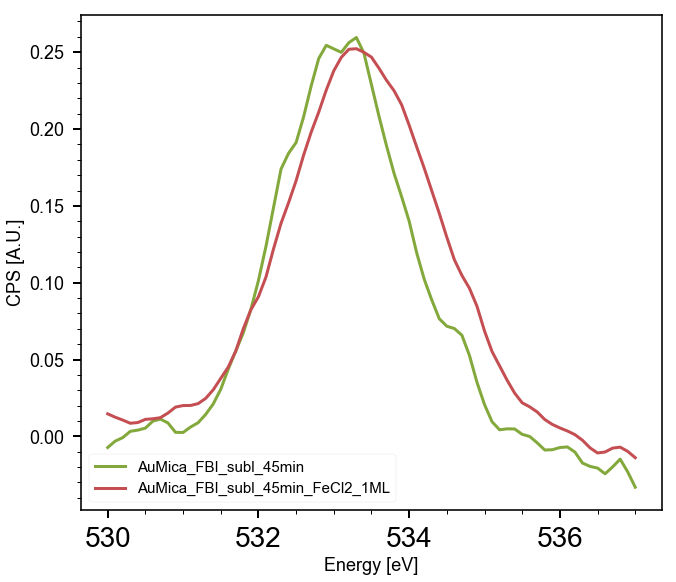

In [231]:
plot_region(gaussian_smooth(sub_fe[1], region, sigma=1), region, offset=0.0)
plot_region(gaussian_smooth(sub_fe[2], region, sigma=1), region, offset=0.02)

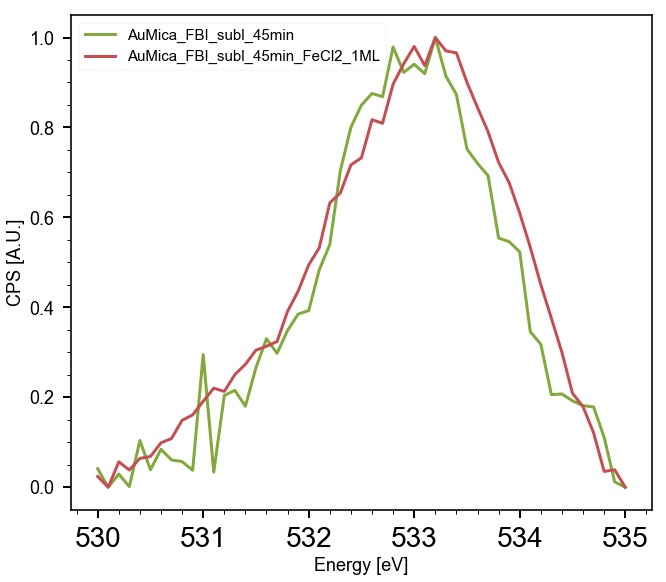

In [238]:
region = 'O_1s_(2)'
plot_region(sub_fe[1], region)
plot_region(sub_fe[2], region)

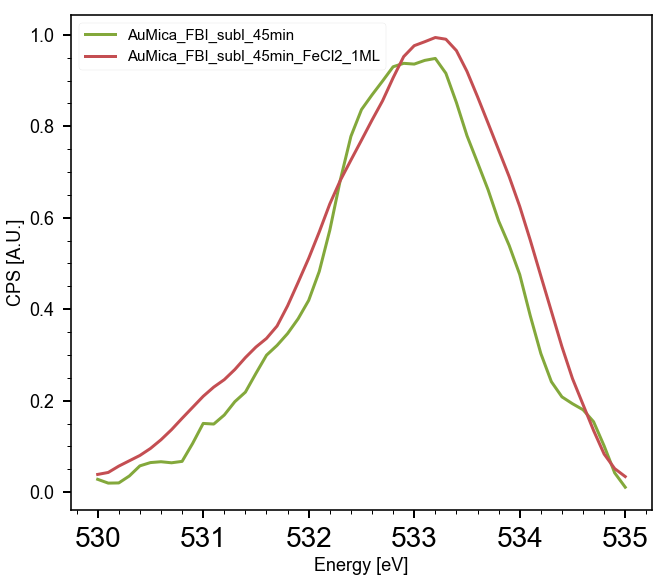

In [237]:
region = 'O_1s_(2)'
plot_region(gaussian_smooth(sub_fe[1], region, sigma=1), region, offset=0.0)
plot_region(gaussian_smooth(sub_fe[2], region, sigma=1), region, offset=0.02)

# BaCl$_2$ / FBI / Au $\phi = 3$

In [246]:
path = '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/**/*.uxy'

files = glob.glob(path, recursive=True)
files.sort()
files

g1 = [read_processed_xp(f) for f in files]

colors = ['b', 'g', 'r', 'k']
for xp,c in zip(g1, colors):
    xp.color = c

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_FBI_subl_30min_BaCl2_60s.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/Au111_FBI/2021_05_10_Au111/proc/20210510_Au111_clean2.uxy.ft', returning empty fit dict


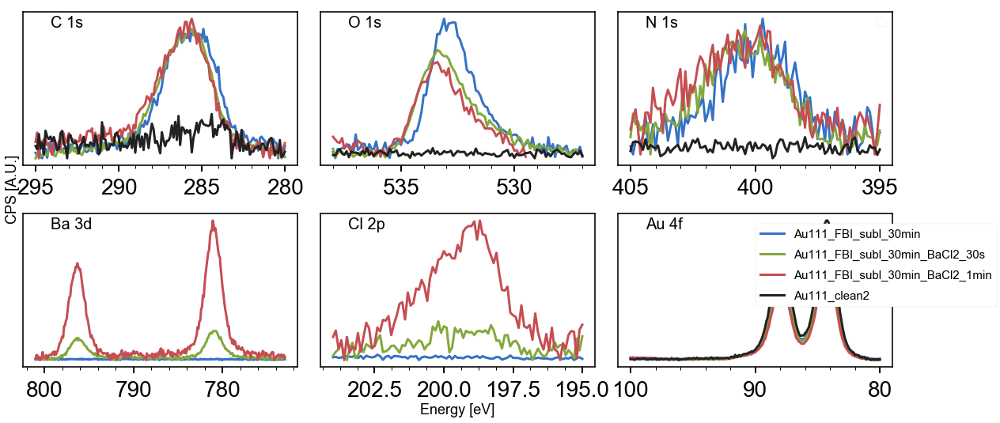

In [247]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Au_4f']

ax = plot_xp_regions(g1, regs)
ax[1][0].invert_xaxis()
ax[1][1].invert_xaxis()

In [249]:
num = ['Ba_3d']
denom = ['FBI0']
make_stoichometry_table(g1, num, denom)

Experiment	Ba_/FBI	
Au111_FBI_subl_30min	0.06 	 
Au111_FBI_subl_30min_BaCl2_30s	0.80 	 
Au111_FBI_subl_30min_BaCl2_1min	3.04 	 
Au111_clean2	0.00 	 


# Search for BaCl$_2$ / FBI / Cu $\phi \approx 1$

In [456]:
pathbacu = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021*/*BaCl2*.xy'
files = glob.glob(pathbacu)
for f in files:
    print(f)
cuxp = [xps_data_import(f) for f in files]

/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_05_Cu/20210205_14-Cu_FBI_subl_8min_BaCl2_1min.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/20210201_11-Cu_FBI_subl_20min_BaCl2_2min.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_300grad.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_200grad.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_2min.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_250grad.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/20210421_16-Cu_FBI_subl_22min_BaCl2_1min.xy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/20210203_13-C

## Preproc

14-Cu_FBI_subl_8min_BaCl2_1min Ba_3d
Max iterations exceeded, subtract ALS baseline
14-Cu_FBI_subl_8min_BaCl2_1min N_1s
Max iterations exceeded, subtract ALS baseline
14-Cu_FBI_subl_8min_BaCl2_1min O_1s
Max iterations exceeded, subtract ALS baseline
14-Cu_FBI_subl_8min_BaCl2_1min C_1s
14-Cu_FBI_subl_8min_BaCl2_1min Cl_2p
14-Cu_FBI_subl_8min_BaCl2_1min Cu_2p
11-Cu_FBI_subl_20min_BaCl2_2min Ba_3d
Max iterations exceeded, subtract ALS baseline
11-Cu_FBI_subl_20min_BaCl2_2min N_1s
11-Cu_FBI_subl_20min_BaCl2_2min O_1s
11-Cu_FBI_subl_20min_BaCl2_2min C_1s
11-Cu_FBI_subl_20min_BaCl2_2min Cl_2p
11-Cu_FBI_subl_20min_BaCl2_2min Cu_2p
16-Cu_FBI_subl_22min_BaCl2_6min_300grad Ba_3d
16-Cu_FBI_subl_22min_BaCl2_6min_300grad N_1s
16-Cu_FBI_subl_22min_BaCl2_6min_300grad O_1s
Max iterations exceeded, subtract ALS baseline
16-Cu_FBI_subl_22min_BaCl2_6min_300grad C_1s
16-Cu_FBI_subl_22min_BaCl2_6min_300grad Cl_2p
16-Cu_FBI_subl_22min_BaCl2_6min_300grad Cu_2p
16-Cu_FBI_subl_22min_BaCl2_6min_200grad Ba_3d
16

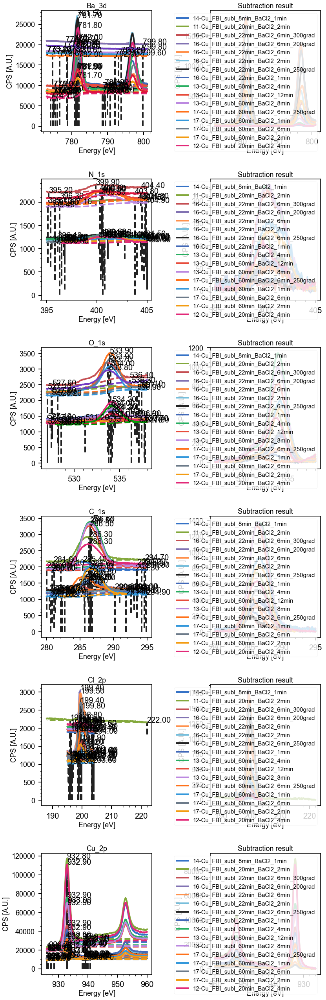

In [151]:
regs = ['Ba_3d', 'N_1s', 'O_1s', 'C_1s', 'Cl_2p', 'Cu_2p']
cubg = bulk_bg_subtract(cuxp, regs)

In [153]:
for xp in cubg:
    xp.area = {}

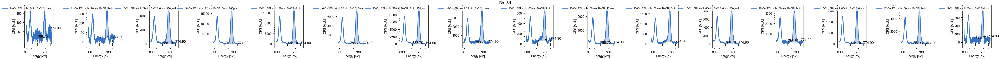

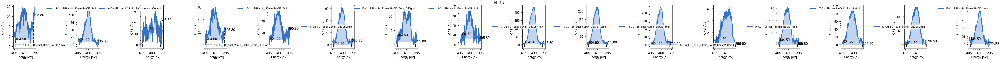

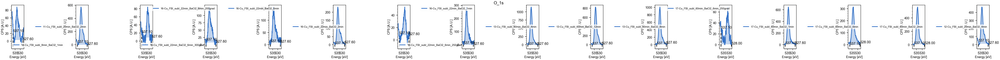

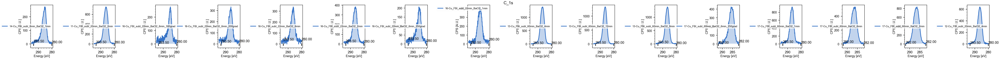

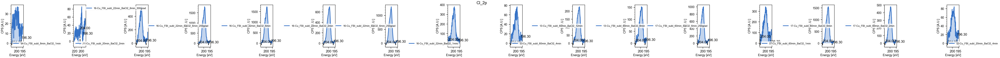

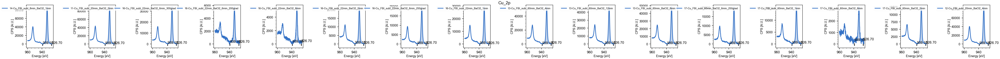

In [154]:
for r in regs:
    integrateRegions(cubg, r, asf)

In [158]:
for xp in cubg:
    direc, fname = os.path.split(xp.path)
    direc += '/proc/'
    fname = fname.replace('.xy', '.uxy')
    print(direc+fname)
    try:
        write_processed_xp(direc+fname, xp)
    except IndexError as e :
        print(e)

/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_05_Cu/proc/20210205_14-Cu_FBI_subl_8min_BaCl2_1min.uxy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_01_Cu/proc/20210201_11-Cu_FBI_subl_20min_BaCl2_2min.uxy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_300grad.uxy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_200grad.uxy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_6min.uxy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_2min.uxy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_250grad.uxy
/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_1min.uxy
/Users/pabloherrero/sabat/xps_spe

## Stoichiometry

In [161]:
for xp in cubg:
    xp.area['FBI0'] = xp.area['N_1s'] / 3
num = ['Ba_3d', 'O_1s', 'Cl_2p']
denom = ['FBI0', 'N_1s', 'Ba_3d']
display_stoichiometry(cubg, num, denom)

## Processed files

In [23]:
pathfbi = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min.uxy'
cu13 = [read_processed_xp(pathfbi)]

In [366]:
pathbacu = '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021*/proc/*BaCl2*.uxy'
files = glob.glob(pathbacu)
files
cubg = [read_processed_xp(f) for f in files]
sel = cu13 + cubg[8:11]

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_05_Cu/proc/20210205_14-Cu_FBI_subl_8min_BaCl2_1min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_200grad.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_04_21_Cu/proc/20210421_16-Cu_FBI_subl_22min_BaCl2_6min_300grad.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_4min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/FBI_Cu/FBI_subl/2021_02_03_Cu/proc/20210203_13-Cu_FBI_subl_60min_BaCl2_8min.uxy.ft', returning empty fit dict


In [367]:
[xp.name for xp in sel]

['FBI 0.9 ML/Cu (111)',
 '13-Cu_FBI_subl_60min_BaCl2_4min',
 '13-Cu_FBI_subl_60min_BaCl2_8min',
 '13-Cu_FBI_subl_60min_BaCl2_12min']

In [400]:
cols = ['g', 'b', 'r', 'm']
names = ['FBI 0.9 ML/Cu (111)', '$\\theta_{\mathrm{Ba}}$ = 0.6', '$\\theta_{\mathrm{Ba}}$ = 1.3', '$\\theta_{\mathrm{Ba}}$ = 1.8' ]
for xp, n, c in zip(sel, names, cols):
    xp.color = c
    xp.name = n

In [395]:
ncu = [normalise_dfx(xp) for xp in sel]

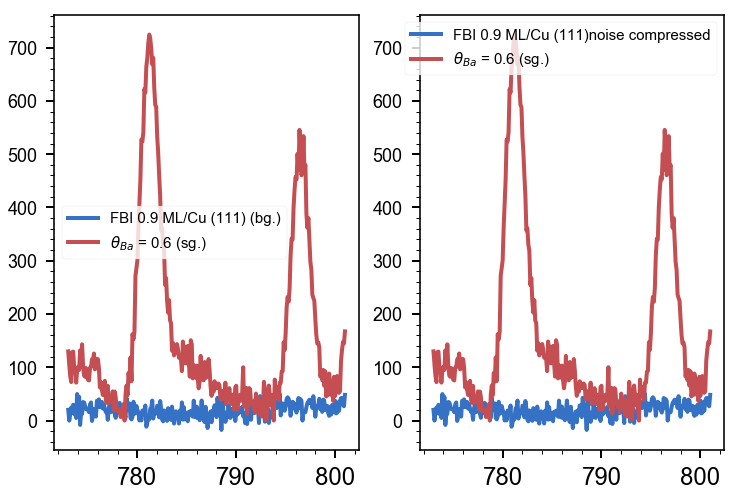

In [396]:
compress_noisy_region(sel[0], sel[1], 'Ba_3d', inplace=True);

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc750b10f98>,
      dtype=object)

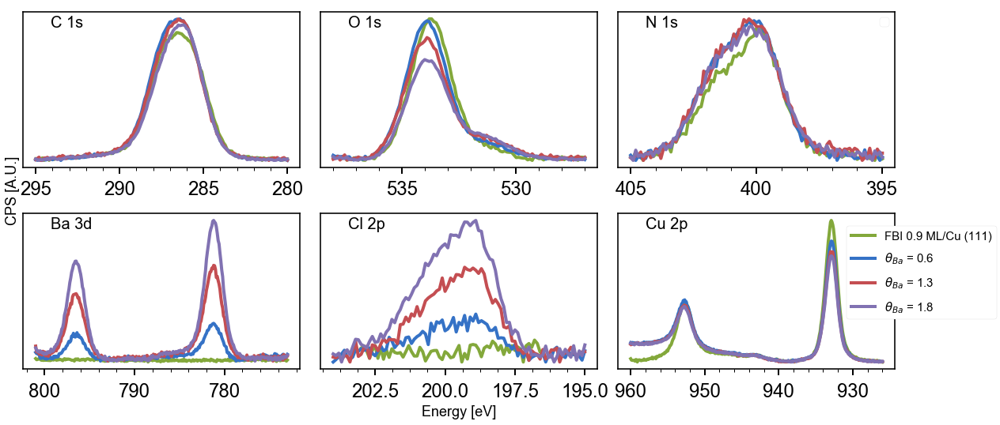

In [397]:
regs = ['C_1s', 'O_1s', 'N_1s', 'Ba_3d', 'Cl_2p', 'Cu_2p']
plot_xp_regions(sel, regs)

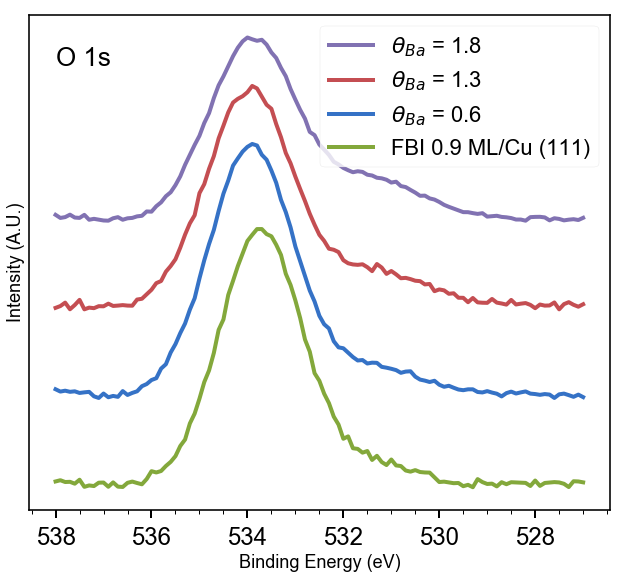

In [398]:
for i,xp in enumerate(sel[::-1]):
    plot_region(xp, 'O_1s', offset=-400*i)
ax = plt.gca()
ax.invert_xaxis()
ax.set(yticks = [], ylabel = 'Intensity (A.U.)', xlabel='Binding Energy (eV)')
plt.text(s = 'O 1s', x = 538, y = 700, fontsize =26)
plt.legend(fontsize =22)
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/SI_O1s_cu.png',
            dpi=400, transparent=True)

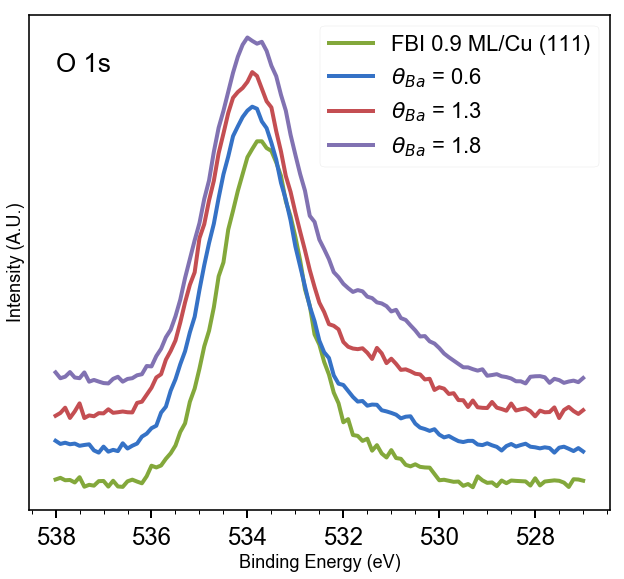

In [401]:
for i,xp in enumerate(ncu):
    plot_region(xp, 'O_1s', offset=0.1*i)
ax = plt.gca()
ax.invert_xaxis()
ax.set(yticks = [], ylabel = 'Intensity (A.U.)', xlabel='Binding Energy (eV)')
plt.text(s = 'O 1s', x = 538, y = 1.2, fontsize =26)
plt.legend(fontsize =22)
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/SI_O1s_cu.b).png',
            dpi=400, transparent=True)

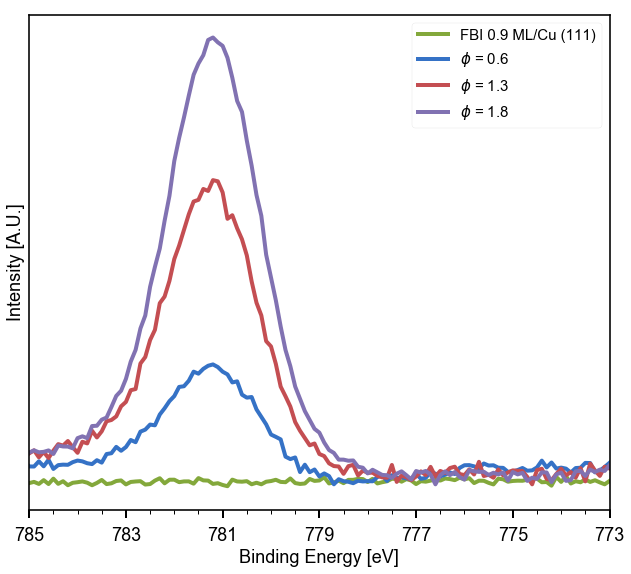

In [59]:
for i,xp in enumerate(sel):
    plot_region(xp, 'Ba_3d')#, offset=400*i)
ax = plt.gca()
ax.set(yticks=[], xlim=(784, 773) ,xlabel='Binding Energy [eV]', ylabel='Intensity [A.U.]')
ax.set(xticks=range(773, 786, 2));
# ax.set_xticks(np.arange(776, 784, 0.2), minor=True);


# STS_SI plot

In [146]:
path = '/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/STS_SI.csv'
sts = pd.read_csv(path, sep='\t', skiprows=1, names = ['bias',  'didv',  'bias1',   'point224',  'point225'])
sts.point225 = sts.point225 / 100

In [162]:
plt.rc('axes', labelsize=24)

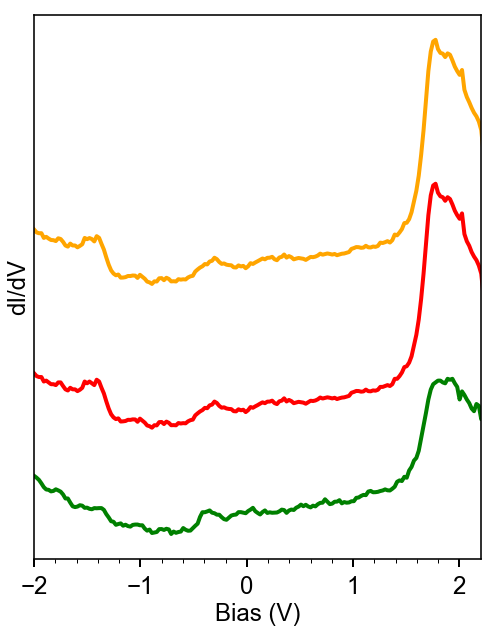

In [164]:
plt.figure(figsize=(8, 10))
plt.plot(sts.bias, sts.didv + 3e-11, color='orange')
plt.plot(sts.bias1, sts.point225, color='green')
plt.plot(sts.bias1, sts.point224 + 1e-11, color='red')
plt.gca().set(xlabel = 'Bias (V)', ylabel = 'dI/dV', xlim=(-2, 2.2), yticks = [])
plt.savefig('/Users/pabloherrero/Dropbox/phd/drafts/fbi_cu_sublimation/v4_au/si_figures/SI_STS.png',
            dpi=400, transparent=True)